In [1]:
import os
print(os.getcwd());os.chdir('/data01/ch6845/MarcoPolo_revision/')
print(os.getcwd())

/data01/ch6845/MarcoPolo_revision/experiments
/data01/ch6845/MarcoPolo_revision


In [2]:
import numpy as np
import pandas as pd

from scipy.io import mmread

import seaborn as sns

from sklearn.metrics import roc_auc_score, precision_recall_fscore_support
from sklearn import metrics
from sklearn.metrics.cluster import adjusted_rand_score

In [3]:
from matplotlib import font_manager

def font_prop(bold=False,**kwargs):
    if bold==True:
        path='/home/ch6845/tools/miniconda3/envs/MarcoPolo/lib/python3.7/site-packages/matplotlib/mpl-data/fonts/ttf/arialbd.ttf'
    else:
        path='/home/ch6845/tools/miniconda3/envs/MarcoPolo/lib/python3.7/site-packages/matplotlib/mpl-data/fonts/ttf/arial.ttf'
    fontproperties=font_manager.FontProperties(fname=path,
                                                   **kwargs)
    return fontproperties

In [4]:
import matplotlib.pyplot as plt
from matplotlib import font_manager
from matplotlib import colors
from cycler import cycler

# specify the custom font to use
#https://www.freefontspro.com/14454/arial.ttf
#/home/ch6845/tools/miniconda3/envs/pytorch/lib/python3.6/site-packages/matplotlib/mpl-data/fonts/ttf/
plt.rcParams['font.family'] = 'sans-serif'
plt.rcParams['font.sans-serif'] = 'Arial'
#https://color.adobe.com/ko/create/image

plt.rcParams["font.size"] = 18

font_fname = '/home/ch6845/tools/miniconda3/envs/MarcoPolo/lib/python3.7/site-packages/matplotlib/mpl-data/fonts/ttf/arial.ttf'
font_family = font_manager.FontProperties(fname=font_fname).get_name()

print(font_family)
#https://matplotlib.org/users/dflt_style_changes.html
color_seq_2_grey=['#999999',
                '#4D4D4D']
color_seq_2_pink=['#F5C2A7',
                '#F53345']

color_qual_2=['#0DD9C4','#F27E63']
"""
color_qual_5=['#F26D6D'
            '#83A603',
            '#04BFBF',
            '#8659B3',
            '#BD8A44']
"""
color_qual_6=['#F53345',
            '#87D303',
            '#04CBCC',
            '#8650CD',
            '#F5A637',              
            '#DBD783']


color_qual_7=['#F53345',
            '#87D303',
            '#04CBCC',
            '#8650CD',
            (160/256, 95/256, 0),
            '#F5A637',              
            '#DBD783',
            
             ]

color_qual_7_3=['#F53345',
            '#87D303',
            '#04CBCC',
            '#8650CD',
                
            (160/256, 95/256, 0),
            '#F5A637',              
            '#DBD783',
                
                '#a17a3d',
                '#e3ae5f',
                '#f0eecc',
            
             ]


#

color_qual_3=['#F7766F',
             '#05BC39',
             '#609FFC']
color_qual_3=[np.array(colors.to_rgb(c)) for c in color_qual_3]
color_qual_3_two=[color_qual_3[0],1.2*color_qual_3[0],
                  color_qual_3[1],1.2*color_qual_3[1],
                  color_qual_3[2],1.2*color_qual_3[1]]
color_qual_3_two=np.clip(color_qual_3_two,a_max=1,a_min=0)

plt.rcParams['legend.fancybox'] = False
plt.rcParams['legend.edgecolor']='1.0'
plt.rcParams['legend.framealpha']=0

Arial


In [5]:
plt.rcParams

RcParams({'_internal.classic_mode': False,
          'agg.path.chunksize': 0,
          'animation.avconv_args': [],
          'animation.avconv_path': 'avconv',
          'animation.bitrate': -1,
          'animation.codec': 'h264',
          'animation.convert_args': [],
          'animation.convert_path': 'convert',
          'animation.embed_limit': 20.0,
          'animation.ffmpeg_args': [],
          'animation.ffmpeg_path': 'ffmpeg',
          'animation.frame_format': 'png',
          'animation.html': 'none',
          'animation.html_args': [],
          'animation.writer': 'ffmpeg',
          'axes.autolimit_mode': 'data',
          'axes.axisbelow': 'line',
          'axes.edgecolor': 'black',
          'axes.facecolor': 'white',
          'axes.formatter.limits': [-5, 6],
          'axes.formatter.min_exponent': 0,
          'axes.formatter.offset_threshold': 4,
          'axes.formatter.use_locale': False,
          'axes.formatter.use_mathtext': False,
          'axes.f

In [6]:
dataset_name_all=[
'Kohinbulk_filtered',
'HumanLiver_filtered',
'Zhengmix8eq_filtered'  
]

dataset_name_all=dataset_name_all+["TabulaAorta_filtered",
"TabulaBladder_filtered",
"TabulaBrainMyeloid_filtered",
"TabulaBrainNonMyeloid_filtered",
"TabulaDiaphragm_filtered",
"TabulaFat_filtered",
"TabulaHeart_filtered",
"TabulaKidney_filtered",
"TabulaLargeIntestine_filtered",
"TabulaLimbMuscle_filtered",
"TabulaLiver_filtered",
"TabulaLung_filtered",
"TabulaMammaryGland_filtered",
"TabulaMarrow_filtered",
"TabulaPancreas_filtered",
"TabulaSkin_filtered",
"TabulaSpleen_filtered",
"TabulaThymus_filtered",
"TabulaTongue_filtered",
"TabulaTrachea_filtered"]

for dataset_name in dataset_name_all:
    print('{} (https://ch6845.github.io/MarcoPolo/{}/index.html)'.format(dataset_name.replace('Tabula','').replace('_filtered',''),dataset_name.replace('_filtered','')))

Kohinbulk (https://ch6845.github.io/MarcoPolo/Kohinbulk/index.html)
HumanLiver (https://ch6845.github.io/MarcoPolo/HumanLiver/index.html)
Zhengmix8eq (https://ch6845.github.io/MarcoPolo/Zhengmix8eq/index.html)
Aorta (https://ch6845.github.io/MarcoPolo/TabulaAorta/index.html)
Bladder (https://ch6845.github.io/MarcoPolo/TabulaBladder/index.html)
BrainMyeloid (https://ch6845.github.io/MarcoPolo/TabulaBrainMyeloid/index.html)
BrainNonMyeloid (https://ch6845.github.io/MarcoPolo/TabulaBrainNonMyeloid/index.html)
Diaphragm (https://ch6845.github.io/MarcoPolo/TabulaDiaphragm/index.html)
Fat (https://ch6845.github.io/MarcoPolo/TabulaFat/index.html)
Heart (https://ch6845.github.io/MarcoPolo/TabulaHeart/index.html)
Kidney (https://ch6845.github.io/MarcoPolo/TabulaKidney/index.html)
LargeIntestine (https://ch6845.github.io/MarcoPolo/TabulaLargeIntestine/index.html)
LimbMuscle (https://ch6845.github.io/MarcoPolo/TabulaLimbMuscle/index.html)
Liver (https://ch6845.github.io/MarcoPolo/TabulaLiver/inde

In [7]:
def dataset_name_mapper(dataset_name,mode='full'):
    if mode=='full':
        if 'Tabula' in dataset_name:
            organ=dataset_name.replace('Tabula','').replace('_filtered','')
            
            organ=organ.replace('BrainMyeloid','Brain Myeloid').\
            replace('BrainNonMyeloid','Brain Non-Myeloid').\
            replace('LargeIntestine','Large Intestine').\
            replace('LimbMuscle','Limb Muscle').\
            replace('MammaryGland','Mammary Gland')       
            
            return '{} (Tabula Muris)'.format(organ)    
        elif 'Koh' in dataset_name:
            return 'hESC (Koh et al.)'
        elif 'Liver' in dataset_name:
            return 'Liver (MacParland et al.)'
        elif 'Zheng' in dataset_name:
            return 'PBMC (Zheng et al.)'
        else:
            return dataset_name
    elif mode=='short':
        if 'Tabula' in dataset_name:
            organ=dataset_name.replace('Tabula','').replace('_filtered','')
            
            organ=organ.replace('BrainMyeloid','Brain Myeloid').\
            replace('BrainNonMyeloid','Brain Non-Myeloid').\
            replace('LargeIntestine','Large Intestine').\
            replace('LimbMuscle','Limb Muscle').\
            replace('MammaryGland','Mammary Gland')              
        
            return '{} (Tabula)'.format(organ)    
        elif 'Koh' in dataset_name:
            return 'hESC'
        elif 'Liver' in dataset_name:
            return 'Liver'
        elif 'Zheng' in dataset_name:
            return 'PBMC'
        else:
            return dataset_name   
    else:
        raise
        
dataset_name_mapper(dataset_name_all[-1])

'Trachea (Tabula Muris)'

In [8]:
def celltype_mapper(celltype,short=False):
    celltype_dict={
    'b.cells':'B cells',
    'regulatory.t':'Regulatory T cells',
    'memory.t':'Memory T cells',
    'naive.cytotoxic':'Naive cytotoxic',
    'cd4.t.helper':'Helper T cells',    
    'naive.t':'Naive T cells',    
    'cd14.monocytes':'Monocytes',    
    'cd56.nk':'NK cells',
                   
    'hESC':'hESC',
    'APS':'Ant. primitive streak',
    'MPS':'Mid. primitive streak',
    'DLL1pPXM':'Paraxial mesoderm',
    'ESMT':'Early somite',
    'Sclrtm':'Sclerotome',                   
    'D5CntrlDrmmtm':'Central dermomyotome',
    'D2LtM':'Lateral mesoderm',  
        
    'LSECs':'LSECs',
    'Cholangiocytes':'Cholangiocytes',        
    'Macrophages':'Macrophages',        
    'ab T cells':'αβ T cells',        
    'NK cells':'NK cells',        
    'gd T cells':'γδ T cells',        
    'Hepatocytes':'Hepatocytes',        
    'Mature B cells':'Mature B cells',        
    'Hepatic Stellate Cells':'Hepatic stellate cells',        
    'Plasma cells':'Plasma cells',                
    'Erythroid cells':'Erythroid cells',  
        
    'pancreatic A cell':'α cells',
    'type B pancreatic cell':'β cells',
    'leukocyte':'Leukocytes',
    'pancreatic acinar cell':'Acinar cells',
    'pancreatic PP cell':'PP cells',
    'pancreatic ductal cell':'Ductal cells',
    'endothelial cell':'Endothelial cells',
    'pancreatic D cell':'δ cells',
    'pancreatic stellate cell':'Pancreatic stellate cells', 
            
    'fibroblast':'Fibroblasts',
    'myofibroblast cell':'Myofibroblast cells',
    'endocardial cell':'Endocardial cells',
    'cardiac muscle cell':'Cardiac muscle cells',
    'smooth muscle cell':'Smooth muscle cells',
        
    'T cell':'T cells',
    'natural killer cell':'NK cells',
        
    'stromal cell':'Stromal cells',
    'myeloid cell':'Myeloid cells',
    'monocyte':'Monocytes',      
    'classical monocyte':'Classical monocytes',      
    'epithelial cell of lung':'Epithelial cells',
    'lung endothelial cell':'Endothelial cells',
    'ciliated columnar cell of tracheobronchial tree':'Ciliated columnar cells',
        
        
}
    celltype_dict_short={
    'b.cells':'B cells',
    'regulatory.t':'Regulatory T cells',
    'memory.t':'Memory T cells',
    'naive.cytotoxic':'Naive cytotoxic',
    'cd4.t.helper':'Helper T cells',    
    'naive.t':'Naive T cells',    
    'cd14.monocytes':'Monocytes',    
    'cd56.nk':'NK cells',
                   
    'hESC':'hESC',
    'APS':'APS',
    'MPS':'MPS',
    'DLL1pPXM':'Paraxial mesoderm',
    'ESMT':'Early somite',
    'Sclrtm':'Sclerotome',                   
    'D5CntrlDrmmtm':'Central dermomyotome',
    'D2LtM':'Lateral mesoderm',  
        
    'LSECs':'LSECs',
    'Cholangiocytes':'Cholangiocytes',        
    'Macrophages':'Macrophages',        
    'ab T cells':'αβ T cells',        
    'NK cells':'NK cells',        
    'gd T cells':'γδ T cells',        
    'Hepatocytes':'Hepatocytes',        
    'Mature B cells':'Mature B cells',        
    'Hepatic Stellate Cells':'Hepatic stellate cells',        
    'Plasma cells':'Plasma cells',                
    'Erythroid cells':'Erythroid cells', 
        
    'pancreatic A cell':'α cells',
    'type B pancreatic cell':'β cells',
    'leukocyte':'Leukocytes',
    'pancreatic acinar cell':'Acinar cells',
    'pancreatic PP cell':'PP cells',
    'pancreatic ductal cell':'Ductal cells',
    'endothelial cell':'Endothelial cells',
    'pancreatic D cell':'δ cells',
    'pancreatic stellate cell':'PaSC',   
        
    'fibroblast':'Fibroblasts',
    'myofibroblast cell':'Myofibroblast cells',
    'endocardial cell':'Endocardial cells',
    'cardiac muscle cell':'Cardiac muscle cells',
    'smooth muscle cell':'Smooth muscle cells',
        
    'T cell':'T cells',
    'natural killer cell':'NK cells',       
        
        
    'stromal cell':'Stromal cells',
    'myeloid cell':'Myeloid cells',
    'monocyte':'Monocytes',      
    'classical monocyte':'Classical monocytes',      
    'epithelial cell of lung':'Epithelial cells',
    'lung endothelial cell':'Endothelial cells',
    'ciliated columnar cell of tracheobronchial tree':'Ciliated columnar cells'
        
        
}    
    if short:
        if celltype in celltype_dict_short.keys():
            return celltype_dict_short[celltype]
        else:
            try:
                return celltype[0].upper()+celltype[1:]
            except:
                return celltype
    else:
        if celltype in celltype_dict.keys():
            return celltype_dict[celltype]
        else:
            try:
                return celltype[0].upper()+celltype[1:]
            except:
                return celltype        
        
#celltype_mapper(exp_data_meta_transformed_sub['phenoid'][0],True)  

In [9]:
def method_mapper(method):
    if method=='MarcoPolo':
        return 'MarcoPolo'
    if method=='vst':
        return 'HVG (VST)'
    elif method=='disp':
        return 'HVG (DISP)'
    elif 'seurat' in method:
        if method.split(',')[2]=='with_filter':        
            if '0_5' in method:
                return 'Clustering+DE (0.5, default)'
            elif '1_0' in method:
                return 'Clustering+DE (1.0, default)'
            elif '1_5' in method:
                return 'Clustering+DE (1.5, default)'        
            else:
                raise RuntimeError(method)
        elif method.split(',')[2]=='without_filter':        
            if '0_5' in method:
                return 'Clustering+DE (0.5, no filter)'
            elif '1_0' in method:
                return 'Clustering+DE (1.0, no filter)'
            elif '1_5' in method:
                return 'Clustering+DE (1.5, no filter)'        
            else:
                raise RuntimeError(method)
        else:
            raise

    elif 'ht' in method:
        if 'tsne' in method:
            return 'scHaystack (tSNE)'
        if 'pca' in method:
            return 'scHaystack'
        else:
            raise RuntimeError(method)        
    else:
        raise RuntimeError(method)

In [10]:
def load_deg(dataset_name='HumanLiver_filtered',res_str='0_5',lfc_filter=True):
    with open('datasets/extract/{}.data.row'.format(dataset_name),'r') as f: exp_data_row=[i.strip().strip('"') for i in f.read().split()]
    
    if lfc_filter==True:
        deg_result=pd.read_csv('datasets/extract/{}.clustering.{}.deg.tsv'.format(dataset_name,res_str),sep='\t',index_col=0)
    else:
        deg_result=pd.read_csv('datasets/extract/{}.clustering.{}.deg.all.tsv'.format(dataset_name,res_str),sep='\t',index_col=0)

    deg_result['avg_logFC_abs']=-np.abs(deg_result['avg_logFC'])
    
    deg_result_sorted=deg_result.sort_values(['p_val','avg_logFC_abs'])
    
    top_gene=deg_result_sorted['gene'].astype(str).values
    _,idx=np.unique(top_gene,return_index=True)
    top_gene_unique=top_gene[np.sort(idx)]
    
    #print(top_gene_unique,exp_data_row)
    
    assert set(top_gene_unique).issubset(exp_data_row)  
    
    return top_gene_unique

In [11]:
def load_runtime(dataset_name,method='MarcoPolo',gpu=True):
    if method=='MarcoPolo':
        if gpu==True:
            runtime=float(pd.read_csv('datasets/extract/{}.QQscore.runtime.gpu.tsv'.format(dataset_name)).columns[0])
        else:
            runtime=float(pd.read_csv('datasets/extract/{}.QQscore.runtime.cpu.tsv'.format(dataset_name)).columns[0])
    elif method in ['vst','mvp','disp']:
        runtime=np.nan
    elif method in ['ht.tsne','ht.pca']:
        runtime=float(pd.read_csv('datasets/extract/{}.hvg.{}.runtime.tsv'.format(dataset_name,method)).columns[0])
    elif 'seurat' in method:
        resolution=method.split(',')[1]
        if method.split(',')[2]=='with_filter':
            runtime=float(pd.read_csv('datasets/extract/{}.clustering.{}.deg.runtime.tsv'.format(dataset_name,resolution)).columns[0])
        elif method.split(',')[2]=='without_filter':
            runtime=float(pd.read_csv('datasets/extract/{}.clustering.{}.deg_all.runtime.tsv'.format(dataset_name,resolution)).columns[0])
        else:
            raise
    return runtime      

In [12]:
def load_score(dataset_name,method='MarcoPolo'):
    with open('datasets/extract/{}.data.row'.format(dataset_name),'r') as f: exp_data_row=[i.strip().strip('"') for i in f.read().split()]
    
    if method=='MarcoPolo':
        allscore=pd.read_csv('datasets/extract/{}.MarcoPolo.{}.rank.tsv'.format(dataset_name,2),sep='\t',index_col=0)
        #print(allscore)
        score=-allscore['MarcoPolo_rank'].values
        
    elif method in ['vst','mvp','disp','ht.tsne','ht.pca']:
        hvg_result=pd.read_csv('datasets/extract/{}.hvg.{}.tsv'.format(dataset_name,method),sep='\t',index_col=0)
        hvg_result.index=hvg_result.index.astype(str)
        
        if hvg_result.shape[1]==0:
            #print(method,'no sorting')
            pass
        elif hvg_result.shape[1]==1:
            #print(method,'sorting x')
            hvg_result=hvg_result.sort_values(by='x',ascending=False)
        else:
            #print(method,'no sorting')
            pass
        score=-np.array(list(map(lambda x: hvg_result.index.tolist().index(x) if x in hvg_result.index else len(hvg_result.index), exp_data_row)))

    elif 'seurat' in method:
        resolution=method.split(',')[1]
        
        if method.split(',')[2]=='with_filter':
            lfc_filter=True
        elif method.split(',')[2]=='without_filter':
            lfc_filter=False
        else:
            raise

        deg_result=load_deg(dataset_name=dataset_name,res_str=resolution,lfc_filter=lfc_filter)
        score=-np.array(list(map(lambda x: deg_result.tolist().index(x) if x in deg_result else len(deg_result), exp_data_row)))        
        
        #seurat_maxdiff=pd.read_csv('datasets/extract/{}.clustering.{}.label.maxdiff.tsv'.format(dataset_name,resolution),sep='\t',header=None)
        #seurat_markerrho=exp_data_pertype_onehot.astype(int)[marker_maxdiff].to_csv('datasets/extract/{}.clusterlabel.{}.markerrho.tsv'.format(dataset_name,resolution),sep='\t')
        #print(seurat_maxdiff)
        #score=seurat_maxdiff[1].values
    else:
        raise
    
    assert len(exp_data_row)==len(score)   
    return score

In [13]:
def load_marker(dataset_name,method='cellmarker',num_genes=100,lfc=2,type_list=None):
    with open('datasets/extract/{}.data.row'.format(dataset_name),'r') as f: exp_data_row=[i.strip().strip('"') for i in f.read().split()]
    
    if method=='cellmarker':
        marker=pd.read_csv('datasets/extract/{}.markerdb.CellMarker.tsv'.format(dataset_name),sep='\t',index_col=0,header=None)
        marker=marker[1].values
        
        assert np.all(list(map(lambda x: x in exp_data_row, marker)))
        
    elif method=='truelabel_maxdiff':
        markerrho=pd.read_csv('datasets/extract/{}.markerrho.{}.{}.tsv'.format(dataset_name,num_genes,lfc),index_col=0,sep='\t')
        if type_list is not None:
            #pass
            markerrho=markerrho.loc[type_list]
            markerrho=markerrho.iloc[:,(markerrho.sum(axis=0)!=0).values]
            markerrho=markerrho.iloc[:,(markerrho.sum(axis=0)!=markerrho.shape[0]).values]
        marker=markerrho.columns.values
        
        assert np.all(list(map(lambda x: x in exp_data_row, marker)))
        
    elif method=='EVF':
        marker=pd.read_csv('datasets/extract/{}.nDiffEVF.tsv'.format(dataset_name),sep='\t',index_col=0)
        #print(marker)
        marker=marker[marker.iloc[:,0]!=0].index.astype(str).tolist()
    elif method=='DEFac':
        marker=pd.read_csv('datasets/extract/{}.splattermeta.tsv'.format(dataset_name),sep='\t',index_col=0)
        marker=marker[marker.columns[marker.columns.str.contains('DEFac')]]
        marker=np.abs(np.log2(marker)).sum(axis=1)
        #print(np.log2(marker))
        marker=marker.sort_values(ascending=False).iloc[:100].index.tolist()
        
    else:
        raise

    #print(sorted([int(i) for i in exp_data_row]))
    
    return marker

In [304]:
marker=pd.read_csv('datasets/extract/{}.nDiffEVF.tsv'.format(dataset_name),sep='\t',index_col=0)
#print(marker)
#marker=marker[marker.iloc[:,0]!=0].index.astype(str).tolist()

In [310]:
marker.sort_values(by='0')

,0
1,
2,0
3337,0
3336,0
3335,0
3334,0
...,...
1773,1
1776,1
3052,1


In [ ]:
dataset_name="Simul_5000_5e-4_9_filtered"

In [140]:
pd.read_csv('datasets/extract/{}.nDiffEVF.tsv'.format(dataset_name),sep='\t',index_col=0)

FileNotFoundError: [Errno 2] No such file or directory: 'datasets/extract/TabulaLung_filtered.nDiffEVF.tsv'

# tree

In [14]:
from Bio import Phylo
tree = Phylo.read("tree_sameend.txt", "newick")
#import pylab
fig = plt.figure(figsize=(6, 5)) 
fig_sub1=fig.add_subplot()



Phylo.draw(tree,axes=fig_sub1,label_func=lambda x: '')
#pylab.axis('off')

fig_sub1.set_ylabel('False positive rate')

#fig_sub1.set_xlim(0,1)
#fig_sub1.spines['top'].set_visible(False)
#plt.show()

fig.savefig('pub/tree.png', bbox_inches='tight')
fig.savefig('pub/tree.jpg', bbox_inches='tight')
fig.savefig('pub/tree.svg', bbox_inches='tight')

ModuleNotFoundError: No module named 'Bio'

# data loading

In [59]:
a=load_marker(dataset_name,method='EVF')  
b=load_marker(dataset_name,method='truelabel_maxdiff')  
len(a),len(b),len(set(a).intersection(b))

(14, 8, 8)

Simul_1000_1e-2_1_filtered
MarcoPolo
vst
disp
ht.pca
seurat,0_5,without_filter
seurat,1_0,without_filter
seurat,1_5,without_filter
seurat,0_5,with_filter
seurat,1_0,with_filter
seurat,1_5,with_filter
Simul_1000_1e-2_2_filtered
MarcoPolo
vst
disp
ht.pca
seurat,0_5,without_filter
seurat,1_0,without_filter
seurat,1_5,without_filter
seurat,0_5,with_filter
seurat,1_0,with_filter
seurat,1_5,with_filter
Simul_1000_1e-2_3_filtered
MarcoPolo
vst
disp
ht.pca
seurat,0_5,without_filter
seurat,1_0,without_filter
seurat,1_5,without_filter
seurat,0_5,with_filter
seurat,1_0,with_filter
seurat,1_5,with_filter
Simul_1000_1e-2_4_filtered
MarcoPolo
vst
disp
ht.pca
seurat,0_5,without_filter
seurat,1_0,without_filter
seurat,1_5,without_filter
seurat,0_5,with_filter
seurat,1_0,with_filter
seurat,1_5,with_filter
Simul_1000_1e-2_5_filtered
MarcoPolo
vst
disp
ht.pca
seurat,0_5,without_filter
seurat,1_0,without_filter
seurat,1_5,without_filter
seurat,0_5,with_filter
seurat,1_0,with_filter
seurat,1_5,with_filter


/home/ch6845/tools/miniconda3/envs/MarcoPolo/lib/python3.7/site-packages/ipykernel_launcher.py:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  import sys


vst
disp
ht.pca
seurat,0_5,without_filter
seurat,1_0,without_filter
seurat,1_5,without_filter
seurat,0_5,with_filter
seurat,1_0,with_filter
seurat,1_5,with_filter
Simul_1000_1e-3_2_filtered
MarcoPolo
vst
disp
ht.pca
seurat,0_5,without_filter
seurat,1_0,without_filter
seurat,1_5,without_filter
seurat,0_5,with_filter
seurat,1_0,with_filter
seurat,1_5,with_filter
Simul_1000_1e-3_3_filtered
MarcoPolo
vst
disp
ht.pca
seurat,0_5,without_filter
seurat,1_0,without_filter
seurat,1_5,without_filter
seurat,0_5,with_filter
seurat,1_0,with_filter
seurat,1_5,with_filter
Simul_1000_1e-3_4_filtered
MarcoPolo
vst
disp
ht.pca
seurat,0_5,without_filter
seurat,1_0,without_filter
seurat,1_5,without_filter
seurat,0_5,with_filter
seurat,1_0,with_filter
seurat,1_5,with_filter
Simul_1000_1e-3_5_filtered
MarcoPolo
vst
disp
ht.pca
seurat,0_5,without_filter
seurat,1_0,without_filter
seurat,1_5,without_filter
seurat,0_5,with_filter
seurat,1_0,with_filter
seurat,1_5,with_filter
Simul_1000_1e-3_6_filtered
MarcoPolo


ht.pca
seurat,0_5,without_filter
seurat,1_0,without_filter
seurat,1_5,without_filter
seurat,0_5,with_filter
seurat,1_0,with_filter
seurat,1_5,with_filter
Simul_2000_1e-3_3_filtered
MarcoPolo
vst
disp
ht.pca
seurat,0_5,without_filter
seurat,1_0,without_filter
seurat,1_5,without_filter
seurat,0_5,with_filter
seurat,1_0,with_filter
seurat,1_5,with_filter
Simul_2000_1e-3_4_filtered
MarcoPolo
vst
disp
ht.pca
seurat,0_5,without_filter
seurat,1_0,without_filter
seurat,1_5,without_filter
seurat,0_5,with_filter
seurat,1_0,with_filter
seurat,1_5,with_filter
Simul_2000_1e-3_5_filtered
MarcoPolo
vst
disp
ht.pca
seurat,0_5,without_filter
seurat,1_0,without_filter
seurat,1_5,without_filter
seurat,0_5,with_filter
seurat,1_0,with_filter
seurat,1_5,with_filter
Simul_2000_1e-3_6_filtered
MarcoPolo
vst
disp
ht.pca
seurat,0_5,without_filter
seurat,1_0,without_filter
seurat,1_5,without_filter
seurat,0_5,with_filter
seurat,1_0,with_filter
seurat,1_5,with_filter
Simul_2000_1e-3_7_filtered
MarcoPolo
vst
disp


ht.pca
seurat,0_5,without_filter
seurat,1_0,without_filter
seurat,1_5,without_filter
seurat,0_5,with_filter
seurat,1_0,with_filter
seurat,1_5,with_filter
Simul_5000_1e-3_4_filtered
MarcoPolo
vst
disp
ht.pca
seurat,0_5,without_filter
seurat,1_0,without_filter
seurat,1_5,without_filter
seurat,0_5,with_filter
seurat,1_0,with_filter
seurat,1_5,with_filter
Simul_5000_1e-3_5_filtered
MarcoPolo
vst
disp
ht.pca
seurat,0_5,without_filter
seurat,1_0,without_filter
seurat,1_5,without_filter
seurat,0_5,with_filter
seurat,1_0,with_filter
seurat,1_5,with_filter
Simul_5000_1e-3_6_filtered
MarcoPolo
vst
disp
ht.pca
seurat,0_5,without_filter
seurat,1_0,without_filter
seurat,1_5,without_filter
seurat,0_5,with_filter
seurat,1_0,with_filter
seurat,1_5,with_filter
Simul_5000_1e-3_7_filtered
MarcoPolo
vst
disp
ht.pca
seurat,0_5,without_filter
seurat,1_0,without_filter
seurat,1_5,without_filter
seurat,0_5,with_filter
seurat,1_0,with_filter
seurat,1_5,with_filter
Simul_5000_1e-3_8_filtered
MarcoPolo
vst
disp


ht.pca
seurat,0_5,without_filter
seurat,1_0,without_filter
seurat,1_5,without_filter
seurat,0_5,with_filter
seurat,1_0,with_filter
seurat,1_5,with_filter
Simul_10000_1e-3_5_filtered
MarcoPolo
vst
disp
ht.pca
seurat,0_5,without_filter
seurat,1_0,without_filter
seurat,1_5,without_filter
seurat,0_5,with_filter
seurat,1_0,with_filter
seurat,1_5,with_filter
Simul_10000_1e-3_6_filtered
MarcoPolo
vst
disp
ht.pca
seurat,0_5,without_filter
seurat,1_0,without_filter
seurat,1_5,without_filter
seurat,0_5,with_filter
seurat,1_0,with_filter
seurat,1_5,with_filter
Simul_10000_1e-3_7_filtered
MarcoPolo
vst
disp
ht.pca
seurat,0_5,without_filter
seurat,1_0,without_filter
seurat,1_5,without_filter
seurat,0_5,with_filter
seurat,1_0,with_filter
seurat,1_5,with_filter
Simul_10000_1e-3_8_filtered
MarcoPolo
vst
disp
ht.pca
seurat,0_5,without_filter
seurat,1_0,without_filter
seurat,1_5,without_filter
seurat,0_5,with_filter
seurat,1_0,with_filter
seurat,1_5,with_filter
Simul_10000_1e-3_9_filtered
MarcoPolo
vst


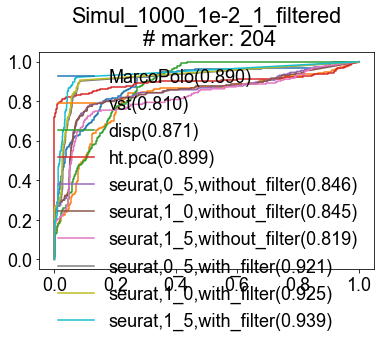

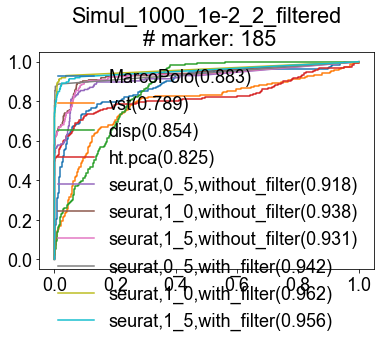

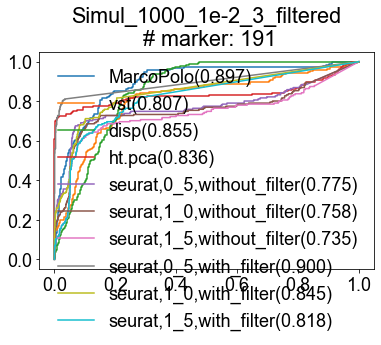

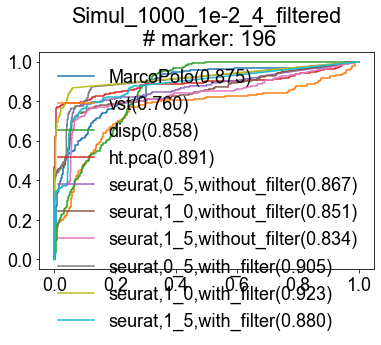

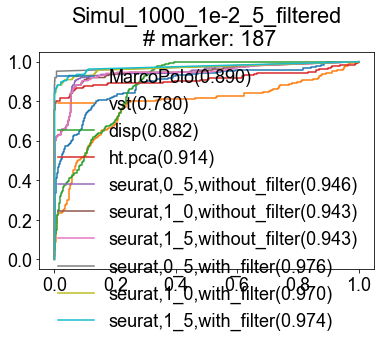

...

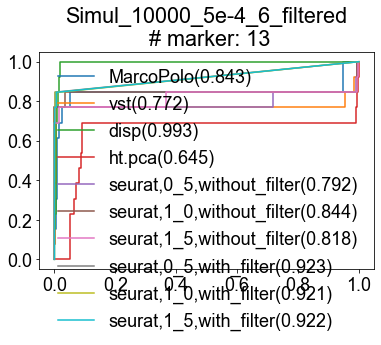

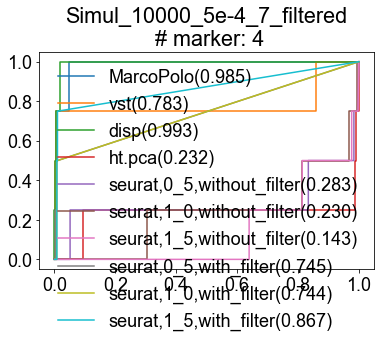

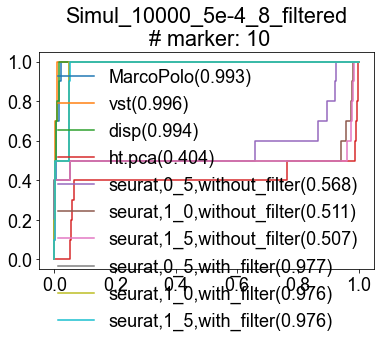

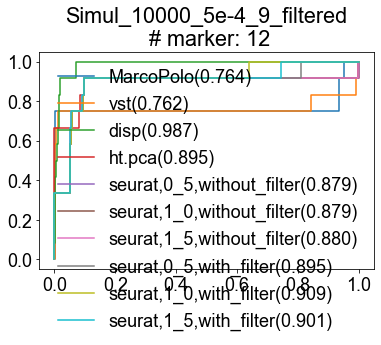

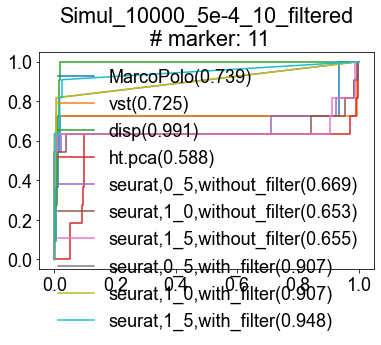

In [14]:
record_list=[]#pd.DataFrame(columns=[1],index=['1e-2','5e-3','1e-3','5e-4','1e-4'])
for ncells_total in [1000,2000,5000,10000]:
    for prop in ['1e-2','5e-3','1e-3','5e-4'][::]:
        for i in range(1,10+1):

            dataset_name='Simul_{}_{}_{}_filtered'.format(ncells_total,prop,i)
            plt.figure()
            print(dataset_name)

            with open('datasets/extract/{}.data.row'.format(dataset_name),'r') as f: exp_data_row=[i.strip().strip('"') for i in f.read().split()]


            #marker=load_marker(dataset_name,method='truelabel_maxdiff',num_genes=500,lfc=2)          
            marker=load_marker(dataset_name,method='EVF')       

            DE_bool=list(map(lambda x: x in marker, exp_data_row))

            marker_old=load_marker(dataset_name,method='truelabel_maxdiff', num_genes=500, lfc=2)  
            
            
            for method in ['MarcoPolo','vst','disp','ht.pca','seurat,0_5,without_filter','seurat,1_0,without_filter','seurat,1_5,without_filter','seurat,0_5,with_filter','seurat,1_0,with_filter','seurat,1_5,with_filter']:
                print(method)
                
                score=load_score(dataset_name,method)

                auc=roc_auc_score(DE_bool,score)
                runtime=load_runtime(dataset_name,method)

                fpr, tpr, thresholds = metrics.roc_curve(DE_bool,score);
                plt.plot(fpr,tpr,label='{}({:.3f})'.format(method,auc))

                if 'seurat' in method:
                    res=method.split(',')[1]
                    clustering_label=pd.read_csv('datasets/extract/{}.clustering.{}.label.tsv'.format(dataset_name,res),sep='\t')
                    exp_data_meta=pd.read_csv('datasets/extract/{}.metadatacol.tsv'.format(dataset_name),sep='\t')
                    ari=adjusted_rand_score(exp_data_meta['phenoid'],clustering_label['seurat_clusters'])
                else:
                    ari=0

                record_list.append({
                    'Prob. of non-zero gene effect':'{:s}'.format(str(prop)),
                    'ncells_total':ncells_total,
                    'num_marker':np.sum(DE_bool),
                    'num_marker_old':len(marker_old),
                    'num_marker_intersection':len(set(marker).intersection(marker_old)),
                    'Method':method_mapper(method),
                    'AUC':auc,
                    'ARI':ari,
                    'runtime':runtime,
                    'runtime2':load_runtime(dataset_name,method,False) if method=='MarcoPolo' else runtime
                })        


            #plt.title("{}\n# marker from DB={}".format(dataset_name,len(marker_unique_converted_filtered)))
            plt.title("{}\n # marker: {}".format(dataset_name,sum(DE_bool)))
            plt.legend()     

            plt.plot()

In [15]:
record_list_df_simul=pd.DataFrame(record_list)

In [16]:
record_list_df_simul['Prob. of non-zero gene effect_num']=record_list_df_simul['Prob. of non-zero gene effect'].astype(float)
record_list_df_simul['Methods']=record_list_df_simul['Method'].str.replace('\+DE','').str.replace(', default','')
record_list_df_simul['Num. of Cells']=record_list_df_simul['ncells_total']

/home/ch6845/tools/miniconda3/envs/MarcoPolo/lib/python3.7/site-packages/ipykernel_launcher.py:2: FutureWarning: The default value of regex will change from True to False in a future version.
  


In [17]:
record_list_df_simul.head()

,Prob. of non-zero gene effect,ncells_total,num_marker,num_marker_old,num_marker_intersection,Method,AUC,ARI,runtime,runtime2,Prob. of non-zero gene effect_num,Methods,Num. of Cells
0,1e-2,1000,204,89,89,MarcoPolo,0.890319,0.000000,243.881035,22470.524193,0.01,MarcoPolo,1000
1,1e-2,1000,204,89,89,HVG (VST),0.810446,0.000000,NaN,NaN,0.01,HVG (VST),1000
2,1e-2,1000,204,89,89,HVG (DISP),0.871271,0.000000,NaN,NaN,0.01,HVG (DISP),1000
3,1e-2,1000,204,89,89,scHaystack,0.898897,0.000000,15.755057,15.755057,0.01,scHaystack,1000
4,1e-2,1000,204,89,89,"Clustering+DE (0.5, no filter)",0.845827,0.206282,66.183386,66.183386,0.01,"Clustering (0.5, no filter)",1000


<AxesSubplot:xlabel='num_marker', ylabel='num_marker_old'>

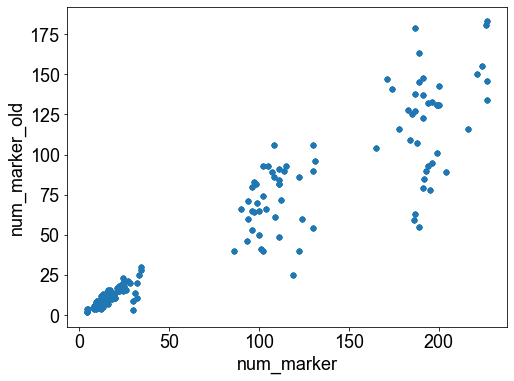

In [17]:
fig = plt.figure(figsize=(20, 20)) 
gs=fig.add_gridspec(20,20)

fig_sub1=fig.add_subplot(gs[0:6,0:8])

record_list_df_simul.plot.scatter(x='num_marker', y='num_marker_old', ax=fig_sub1)

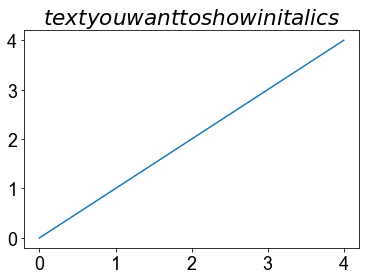

In [20]:
import matplotlib.pyplot as plt

plt.plot(range(5), range(5))
plt.title('$\it{text you want to show in italics}$')
plt.show()

In [301]:
for ncells_total in [1000,2000,5000,10000]:
    for prop in ['1e-2','5e-3','1e-3','5e-4'][::]:
        for i in range(1,10+1):

            dataset_name='Simul_{}_{}_{}_filtered'.format(ncells_total,prop,i)
            plt.figure()
            print(dataset_name)

            with open('datasets/extract/{}.data.row'.format(dataset_name),'r') as f: exp_data_row=[i.strip().strip('"') for i in f.read().split()]
            print(dataset_name, len(exp_data_row))


Simul_1000_1e-2_1_filtered
Simul_1000_1e-2_1_filtered 1500
Simul_1000_1e-2_2_filtered
Simul_1000_1e-2_2_filtered 1500
Simul_1000_1e-2_3_filtered
Simul_1000_1e-2_3_filtered 1500
Simul_1000_1e-2_4_filtered
Simul_1000_1e-2_4_filtered 1500
Simul_1000_1e-2_5_filtered
Simul_1000_1e-2_5_filtered 1500
Simul_1000_1e-2_6_filtered
Simul_1000_1e-2_6_filtered 1500
Simul_1000_1e-2_7_filtered
Simul_1000_1e-2_7_filtered 1500
Simul_1000_1e-2_8_filtered
Simul_1000_1e-2_8_filtered 1500
Simul_1000_1e-2_9_filtered
Simul_1000_1e-2_9_filtered 1500
Simul_1000_1e-2_10_filtered
Simul_1000_1e-2_10_filtered 1500
Simul_1000_5e-3_1_filtered
Simul_1000_5e-3_1_filtered 1500
Simul_1000_5e-3_2_filtered
Simul_1000_5e-3_2_filtered 1500
Simul_1000_5e-3_3_filtered
Simul_1000_5e-3_3_filtered 1500
Simul_1000_5e-3_4_filtered
Simul_1000_5e-3_4_filtered 1500
Simul_1000_5e-3_5_filtered
Simul_1000_5e-3_5_filtered 1500
Simul_1000_5e-3_6_filtered
Simul_1000_5e-3_6_filtered 1500
Simul_1000_5e-3_7_filtered
Simul_1000_5e-3_7_filtered 

/home/ch6845/tools/miniconda3/envs/MarcoPolo/lib/python3.7/site-packages/ipykernel_launcher.py:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


Simul_1000_1e-3_8_filtered 1500
Simul_1000_1e-3_9_filtered
Simul_1000_1e-3_9_filtered 1500
Simul_1000_1e-3_10_filtered
Simul_1000_1e-3_10_filtered 1500
Simul_1000_5e-4_1_filtered
Simul_1000_5e-4_1_filtered 1500
Simul_1000_5e-4_2_filtered
Simul_1000_5e-4_2_filtered 1500
Simul_1000_5e-4_3_filtered
Simul_1000_5e-4_3_filtered 1500
Simul_1000_5e-4_4_filtered
Simul_1000_5e-4_4_filtered 1500
Simul_1000_5e-4_5_filtered
Simul_1000_5e-4_5_filtered 1500
Simul_1000_5e-4_6_filtered
Simul_1000_5e-4_6_filtered 1500
Simul_1000_5e-4_7_filtered
Simul_1000_5e-4_7_filtered 1500
Simul_1000_5e-4_8_filtered
Simul_1000_5e-4_8_filtered 1500
Simul_1000_5e-4_9_filtered
Simul_1000_5e-4_9_filtered 1500
Simul_1000_5e-4_10_filtered
Simul_1000_5e-4_10_filtered 1500
Simul_2000_1e-2_1_filtered
Simul_2000_1e-2_1_filtered 1500
Simul_2000_1e-2_2_filtered
Simul_2000_1e-2_2_filtered 1500
Simul_2000_1e-2_3_filtered
Simul_2000_1e-2_3_filtered 1500
Simul_2000_1e-2_4_filtered
Simul_2000_1e-2_4_filtered 1500
Simul_2000_1e-2_5_fi

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

In [ ]:

dataset_name='Simul_{}_{}_{}_filtered'.format(ncells_total,prop,i)
plt.figure()
print(dataset_name)

with open('datasets/extract/{}.data.row'.format(dataset_name),'r') as f: exp_data_row=[i.strip().strip('"') for i in f.read().split()]

In [300]:
len(exp_data_row)

1500

In [294]:
record_list_df_simul

,Prob. of non-zero gene effect,ncells_total,num_marker,num_marker_old,num_marker_intersection,Method,AUC,ARI,runtime,runtime2,Prob. of non-zero gene effect_num,Methods,Num. of Cells
0,1e-2,1000,204,89,89,MarcoPolo,0.890319,0.000000,243.881035,22470.524193,0.0100,MarcoPolo,1000
1,1e-2,1000,204,89,89,HVG (VST),0.810446,0.000000,NaN,NaN,0.0100,HVG (VST),1000
2,1e-2,1000,204,89,89,HVG (DISP),0.871271,0.000000,NaN,NaN,0.0100,HVG (DISP),1000
3,1e-2,1000,204,89,89,scHaystack,0.898897,0.000000,15.755057,15.755057,0.0100,scHaystack,1000
4,1e-2,1000,204,89,89,"Clustering+DE (0.5, no filter)",0.845827,0.206282,66.183386,66.183386,0.0100,"Clustering (0.5, no filter)",1000
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1595,5e-4,10000,11,8,8,"Clustering+DE (1.0, no filter)",0.652726,0.043683,769.865413,769.865413,0.0005,"Clustering (1.0, no filter)",10000
1596,5e-4,10000,11,8,8,"Clustering+DE (1.5, no filter)",0.654558,0.047321,1150.823047,1150.823047,0.0005,"Clustering (1.5, no filter)",10000
1597,5e-4,10000,11,8,8,"Clustering+DE (0.5, default)",0.907198,0.039734,57.275253,57.275253,0.0005,Clustering (0.5),10000
1598,5e-4,10000,11,8,8,"Clustering+DE (1.0, default)",0.907076,0.043683,62.271167,62.271167,0.0005,Clustering (1.0),10000


In [346]:
record_list_df_simul.plot.scatter(x='Prob. of non-zero gene effect_num', y='num_marker')

NameError: name 'record_list_df_simul' is not defined

In [351]:
record_list_df_simul

,Prob. of non-zero gene effect,ncells_total,num_marker,num_marker_old,num_marker_intersection,Method,AUC,ARI,runtime,runtime2,Prob. of non-zero gene effect_num,Methods,Num. of Cells
0,1e-2,1000,204,89,89,MarcoPolo,0.890319,0.000000,243.881035,22470.524193,0.0100,MarcoPolo,1000
1,1e-2,1000,204,89,89,HVG (VST),0.810446,0.000000,NaN,NaN,0.0100,HVG (VST),1000
2,1e-2,1000,204,89,89,HVG (DISP),0.871271,0.000000,NaN,NaN,0.0100,HVG (DISP),1000
3,1e-2,1000,204,89,89,scHaystack,0.898897,0.000000,15.755057,15.755057,0.0100,scHaystack,1000
4,1e-2,1000,204,89,89,"Clustering+DE (0.5, no filter)",0.845827,0.206282,66.183386,66.183386,0.0100,"Clustering (0.5, no filter)",1000
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1595,5e-4,10000,11,8,8,"Clustering+DE (1.0, no filter)",0.652726,0.043683,769.865413,769.865413,0.0005,"Clustering (1.0, no filter)",10000
1596,5e-4,10000,11,8,8,"Clustering+DE (1.5, no filter)",0.654558,0.047321,1150.823047,1150.823047,0.0005,"Clustering (1.5, no filter)",10000
1597,5e-4,10000,11,8,8,"Clustering+DE (0.5, default)",0.907198,0.039734,57.275253,57.275253,0.0005,Clustering (0.5),10000
1598,5e-4,10000,11,8,8,"Clustering+DE (1.0, default)",0.907076,0.043683,62.271167,62.271167,0.0005,Clustering (1.0),10000


In [368]:
record_list_df_simul_temp

,Prob. of non-zero gene effect,ncells_total,num_marker,num_marker_old,num_marker_intersection,Method,AUC,ARI,runtime,runtime2,Prob. of non-zero gene effect_num,Methods,Num. of Cells
0,1e-2,1000,204,89,89,MarcoPolo,0.890319,0.000000,243.881035,22470.524193,0.0100,MarcoPolo,1000
1,1e-2,1000,204,89,89,HVG (VST),0.810446,0.000000,NaN,NaN,0.0100,HVG (VST),1000
2,1e-2,1000,204,89,89,HVG (DISP),0.871271,0.000000,NaN,NaN,0.0100,HVG (DISP),1000
3,1e-2,1000,204,89,89,scHaystack,0.898897,0.000000,15.755057,15.755057,0.0100,scHaystack,1000
4,1e-2,1000,204,89,89,"Clustering+DE (0.5, no filter)",0.845827,0.206282,66.183386,66.183386,0.0100,"Clustering (0.5, no filter)",1000
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1595,5e-4,10000,11,8,8,"Clustering+DE (1.0, no filter)",0.652726,0.043683,769.865413,769.865413,0.0005,"Clustering (1.0, no filter)",10000
1596,5e-4,10000,11,8,8,"Clustering+DE (1.5, no filter)",0.654558,0.047321,1150.823047,1150.823047,0.0005,"Clustering (1.5, no filter)",10000
1597,5e-4,10000,11,8,8,"Clustering+DE (0.5, default)",0.907198,0.039734,57.275253,57.275253,0.0005,Clustering (0.5),10000
1598,5e-4,10000,11,8,8,"Clustering+DE (1.0, default)",0.907076,0.043683,62.271167,62.271167,0.0005,Clustering (1.0),10000


In [372]:
record_list_df_simul_temp=record_list_df_simul.copy()
record_list_df_simul_temp['Prob. of non-zero gene effect'].map(lambda x: {0.01:'1e-2', 0.005:'5e-3', 0.001:'1e-3', 0.0005:'5e-4'}[x])

KeyError: '1e-2'

In [382]:
num_markers=record_list_df_simul.groupby(['Prob. of non-zero gene effect_num','Num. of Cells']).mean()[['num_marker']].rename(columns={'num_marker':'Num. of Markers'}).sort_values('Prob. of non-zero gene effect_num',ascending=False)
num_markers.to_csv('pub/num_marker.csv')

In [377]:
record_list_df_simul.columns

Index(['Prob. of non-zero gene effect', 'ncells_total', 'num_marker',
       'num_marker_old', 'num_marker_intersection', 'Method', 'AUC', 'ARI',
       'runtime', 'runtime2', 'Prob. of non-zero gene effect_num', 'Methods',
       'Num. of Cells'],
      dtype='object')

In [362]:
num_markers['Prob. of non-zero gene effect_num']#.map(lambda x: {0.01:'1e-2', 0.005:'5e-3', 0.001:'1e-3', 0.0005:'5e-4'}[x])

KeyError: 'Prob. of non-zero gene effect_num'

Text(100, 3, '$\\it{r}$ = 0.933\n')

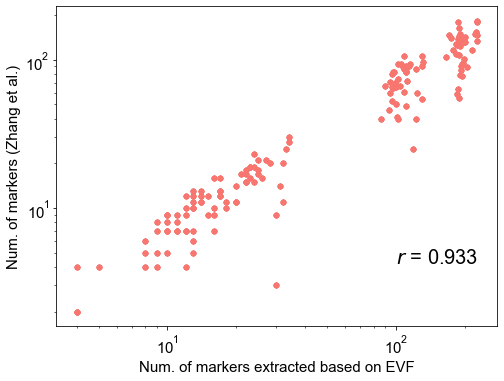

In [21]:
plt.rcParams["axes.prop_cycle"]=cycler('color',color_qual_3)
plt.rcParams["font.size"] = 15

fig = plt.figure(figsize=(20, 20)) 
gs=fig.add_gridspec(20,20)

fig_sub1=fig.add_subplot(gs[0:6,0:8])

record_list_df_simul.plot.scatter(x='num_marker', y='num_marker_old', ax=fig_sub1)

fig_sub1.set_xlabel('Num. of markers extracted based on EVF')
fig_sub1.set_ylabel('Num. of markers (Zhang et al.)')

fig_sub1.set_xscale('log')
fig_sub1.set_yscale('log')

from scipy import stats

r_result=stats.pearsonr(record_list_df_simul['num_marker'], record_list_df_simul['num_marker_old'])

##fig_sub1.text(x=0,y=0,s="{:.3f} {:.3f}".format(r_result[0],r_result[1]))
fig_sub1.text(x=100, y=3 ,s="$\it{r}$"+" = {:.3f}\n".format(r_result[0]), 
              fontproperties=font_prop(bold=False,size=20))

In [22]:
fig.savefig('pub/marker_count.png', bbox_inches='tight')
fig.savefig('pub/marker_count.jpg', bbox_inches='tight')
fig.savefig('pub/marker_count.svg', bbox_inches='tight')

In [23]:
record_list_df_simul

,Prob. of non-zero gene effect,ncells_total,num_marker,num_marker_old,num_marker_intersection,Method,AUC,ARI,runtime,runtime2,Prob. of non-zero gene effect_num,Methods,Num. of Cells
0,1e-2,1000,204,89,89,MarcoPolo,0.890319,0.000000,243.881035,22470.524193,0.0100,MarcoPolo,1000
1,1e-2,1000,204,89,89,HVG (VST),0.810446,0.000000,NaN,NaN,0.0100,HVG (VST),1000
2,1e-2,1000,204,89,89,HVG (DISP),0.871271,0.000000,NaN,NaN,0.0100,HVG (DISP),1000
3,1e-2,1000,204,89,89,scHaystack,0.849321,0.000000,21.741828,21.741828,0.0100,scHaystack,1000
4,1e-2,1000,204,89,89,"Clustering+DE (0.5, no filter)",0.845827,0.206282,66.183386,66.183386,0.0100,"Clustering (0.5, no filter)",1000
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1595,5e-4,10000,11,8,8,"Clustering+DE (1.0, no filter)",0.652726,0.043683,769.865413,769.865413,0.0005,"Clustering (1.0, no filter)",10000
1596,5e-4,10000,11,8,8,"Clustering+DE (1.5, no filter)",0.654558,0.047321,1150.823047,1150.823047,0.0005,"Clustering (1.5, no filter)",10000
1597,5e-4,10000,11,8,8,"Clustering+DE (0.5, default)",0.907198,0.039734,57.275253,57.275253,0.0005,Clustering (0.5),10000
1598,5e-4,10000,11,8,8,"Clustering+DE (1.0, default)",0.907076,0.043683,62.271167,62.271167,0.0005,Clustering (1.0),10000


Text(0.5, 0, 'Percentage of fold change-based markers included in the EVF—based marker set')

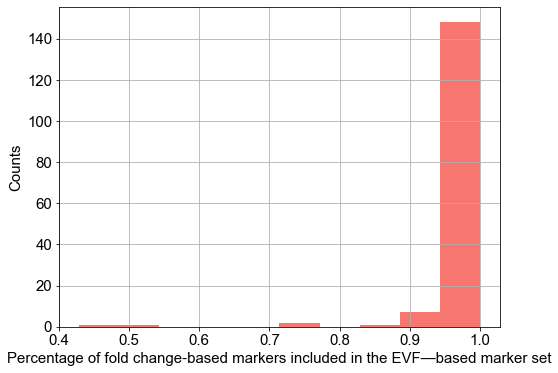

In [24]:
plt.rcParams["axes.prop_cycle"]=cycler('color',color_qual_3)
plt.rcParams["font.size"] = 15

fig = plt.figure(figsize=(20, 20)) 
gs=fig.add_gridspec(20,20)


fig_sub1=fig.add_subplot(gs[0:6,0:8])

record_list_df_simul_sub=record_list_df_simul[record_list_df_simul['Method']=='MarcoPolo']
(record_list_df_simul_sub['num_marker_intersection']/record_list_df_simul_sub['num_marker_old']).hist(ax=fig_sub1)

fig_sub1.set_ylabel('Counts')
fig_sub1.set_xlabel('Percentage of fold change-based markers included in the EVF—based marker set')

In [25]:
fig.savefig('pub/marker_overlap.png', bbox_inches='tight')
fig.savefig('pub/marker_overlap.jpg', bbox_inches='tight')
fig.savefig('pub/marker_overlap.svg', bbox_inches='tight')

# ARI

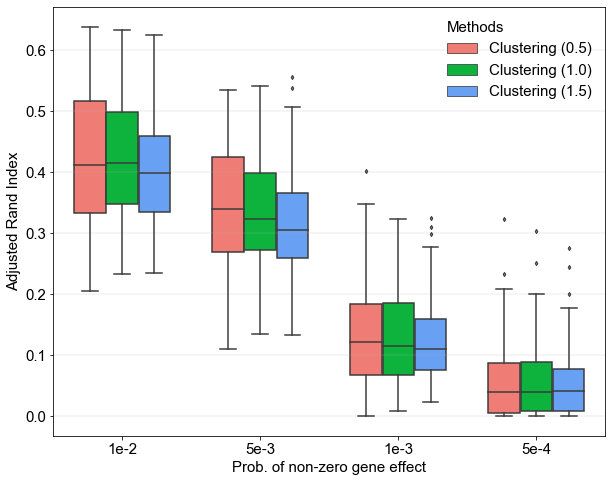

In [26]:
plt.rcParams["axes.prop_cycle"]=cycler('color',color_qual_3)
plt.rcParams["font.size"] = 15
#record_list_df_simul
fig = plt.figure(figsize=(25, 25)) 
gs=fig.add_gridspec(25,25)


fig_sub1=fig.add_subplot(gs[0:8,0:10])

record_list_df_simul['Adjusted Rand Index']=record_list_df_simul['ARI']

sns.boxplot(x='Prob. of non-zero gene effect',y='Adjusted Rand Index',
            order=['1e-2','5e-3','1e-3','5e-4'],
            hue='Methods',
            data=record_list_df_simul[
                
                                        (record_list_df_simul['Method'].str.contains('Clustering')&
                                      (~record_list_df_simul['Method'].str.contains('filter')))],
            width=0.7,
            saturation=0.9,
            flierprops = dict(markerfacecolor = '0.50', markersize = 3),
            ax=fig_sub1
           )
fig_sub1.yaxis.grid(True,linewidth=0.4,alpha=0.6)
#leg=fig_sub1.legend()
fig_sub1.get_legend()._legend_box.align = "left"
#plt.legend()



In [27]:
fig.savefig('pub/simul_ARI_overall.png', bbox_inches='tight')
fig.savefig('pub/simul_ARI_overall.jpg', bbox_inches='tight')
fig.savefig('pub/simul_ARI_overall.svg', bbox_inches='tight')

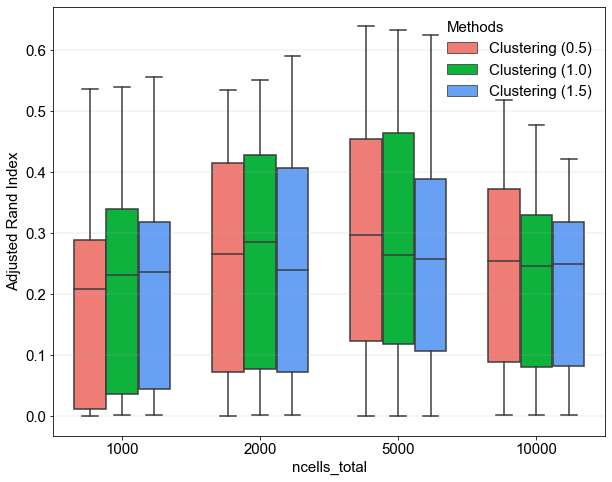

In [28]:
plt.rcParams["axes.prop_cycle"]=cycler('color',color_qual_3)
plt.rcParams["font.size"] = 15
#record_list_df_simul
fig = plt.figure(figsize=(25, 25)) 
gs=fig.add_gridspec(25,25)


fig_sub1=fig.add_subplot(gs[0:8,0:10])

record_list_df_simul['Adjusted Rand Index']=record_list_df_simul['ARI']

sns.boxplot(x='ncells_total',y='Adjusted Rand Index',
            hue='Methods',
            data=record_list_df_simul[
                
                                        (record_list_df_simul['Method'].str.contains('Clustering')&
                                      (~record_list_df_simul['Method'].str.contains('filter')))],
            width=0.7,
            saturation=0.9,
            ax=fig_sub1
           )
fig_sub1.yaxis.grid(True,linewidth=0.4,alpha=0.6)
#leg=fig_sub1.legend()
fig_sub1.get_legend()._legend_box.align = "left"
#plt.legend()



Text(-0.08, 1.0, 'b')

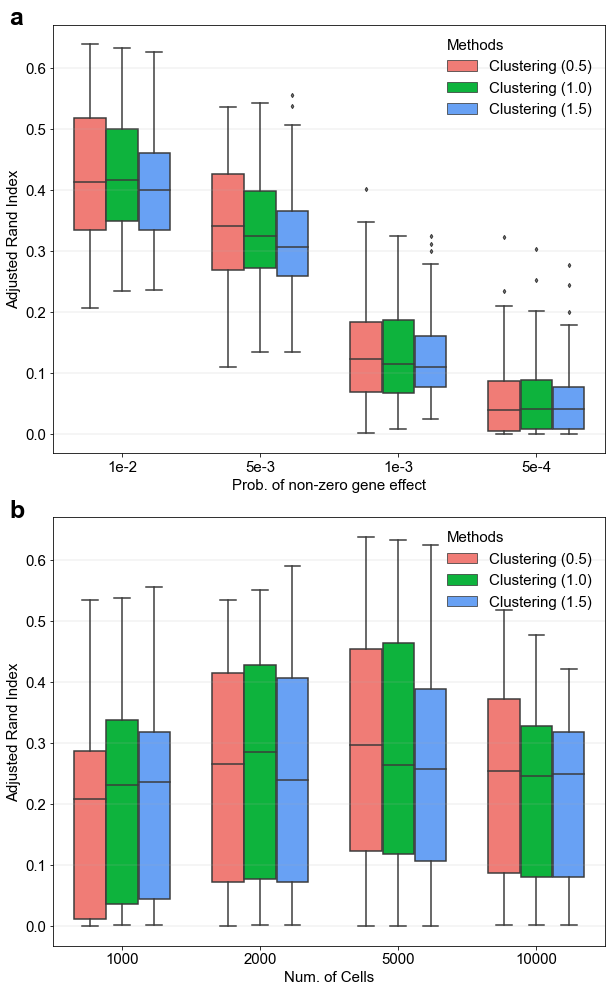

In [29]:
plt.rcParams["axes.prop_cycle"]=cycler('color',color_qual_3)
plt.rcParams["font.size"] = 15
#record_list_df_simul
fig = plt.figure(figsize=(25, 25)) 
gs=fig.add_gridspec(25,25)



fig_sub1=fig.add_subplot(gs[0:8,0:10])

record_list_df_simul['Adjusted Rand Index']=record_list_df_simul['ARI']

sns.boxplot(x='Prob. of non-zero gene effect',y='Adjusted Rand Index',
            order=['1e-2','5e-3','1e-3','5e-4'],
            hue='Methods',
            data=record_list_df_simul[
                
                                        (record_list_df_simul['Method'].str.contains('Clustering')&
                                      (~record_list_df_simul['Method'].str.contains('filter')))],
            width=0.7,
            saturation=0.9,
            flierprops = dict(markerfacecolor = '0.50', markersize = 3),
            ax=fig_sub1
           )
fig_sub1.yaxis.grid(True,linewidth=0.4,alpha=0.6)
#leg=fig_sub1.legend()
fig_sub1.get_legend()._legend_box.align = "left"
#plt.legend()
fig_sub1.text(-0.08, 1.0, 'a', fontproperties=font_prop(bold=True,size=25), transform=fig_sub1.transAxes)


fig_sub1=fig.add_subplot(gs[9:9+8,0:10])

record_list_df_simul['Adjusted Rand Index']=record_list_df_simul['ARI']

sns.boxplot(x='Num. of Cells',y='Adjusted Rand Index',
            hue='Methods',
            data=record_list_df_simul[
                
                                        (record_list_df_simul['Method'].str.contains('Clustering')&
                                      (~record_list_df_simul['Method'].str.contains('filter')))],
            width=0.7,
            saturation=0.9,
            ax=fig_sub1
           )
fig_sub1.yaxis.grid(True,linewidth=0.4,alpha=0.6)
#leg=fig_sub1.legend()
fig_sub1.get_legend()._legend_box.align = "left"
#plt.legend()
fig_sub1.text(-0.08, 1.0, 'b', fontproperties=font_prop(bold=True,size=25), transform=fig_sub1.transAxes)


Text(-0.08, 1.0, 'D')

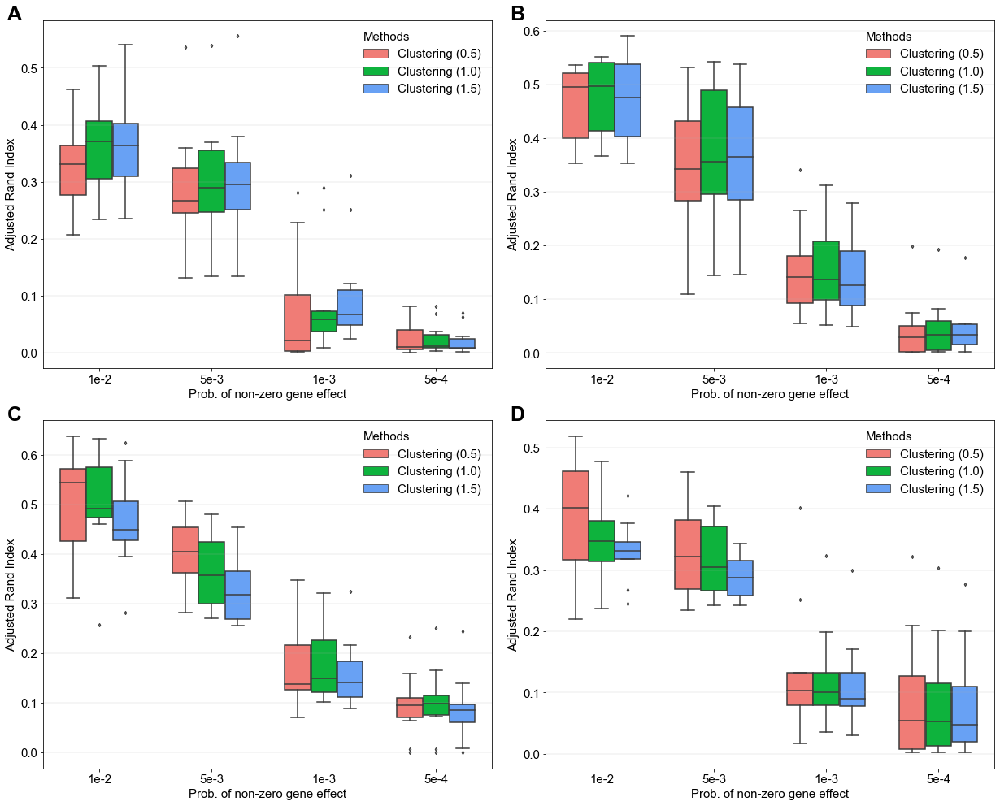

In [31]:
plt.rcParams["axes.prop_cycle"]=cycler('color',color_qual_3)
plt.rcParams["font.size"] = 15
#record_list_df_simul
fig = plt.figure(figsize=(25, 25)) 
gs=fig.add_gridspec(25,25)


fig_sub1=fig.add_subplot(gs[0:8,0:10])

record_list_df_simul['Adjusted Rand Index']=record_list_df_simul['ARI']

sns.boxplot(x='Prob. of non-zero gene effect',y='Adjusted Rand Index',
            order=['1e-2','5e-3','1e-3','5e-4'],
            hue='Methods',
            data=record_list_df_simul[
                (record_list_df_simul['ncells_total']==1000)&
                                        (record_list_df_simul['Method'].str.contains('Clustering')&
                                      (~record_list_df_simul['Method'].str.contains('filter')))],
            width=0.7,
            saturation=0.9,
            flierprops = dict(markerfacecolor = '0.50', markersize = 3),
            ax=fig_sub1
           )
fig_sub1.yaxis.grid(True,linewidth=0.4,alpha=0.6)
#leg=fig_sub1.legend()
fig_sub1.get_legend()._legend_box.align = "left"
#plt.legend()
fig_sub1.text(-0.08, 1.0, 'A', fontproperties=font_prop(bold=True,size=25), transform=fig_sub1.transAxes)



fig_sub1=fig.add_subplot(gs[0:8,11:21])

record_list_df_simul['Adjusted Rand Index']=record_list_df_simul['ARI']

sns.boxplot(x='Prob. of non-zero gene effect',y='Adjusted Rand Index',
            order=['1e-2','5e-3','1e-3','5e-4'],
            hue='Methods',
            data=record_list_df_simul[
                (record_list_df_simul['ncells_total']==2000)&
                                        (record_list_df_simul['Method'].str.contains('Clustering')&
                                      (~record_list_df_simul['Method'].str.contains('filter')))],
            width=0.7,
            saturation=0.9,
            flierprops = dict(markerfacecolor = '0.50', markersize = 3),
            ax=fig_sub1
           )
fig_sub1.yaxis.grid(True,linewidth=0.4,alpha=0.6)
#leg=fig_sub1.legend()
fig_sub1.get_legend()._legend_box.align = "left"
#plt.legend()
fig_sub1.text(-0.08, 1.0, 'B', fontproperties=font_prop(bold=True,size=25), transform=fig_sub1.transAxes)


fig_sub1=fig.add_subplot(gs[9:9+8,0:10])

record_list_df_simul['Adjusted Rand Index']=record_list_df_simul['ARI']

sns.boxplot(x='Prob. of non-zero gene effect',y='Adjusted Rand Index',
            order=['1e-2','5e-3','1e-3','5e-4'],
            hue='Methods',
            data=record_list_df_simul[
                (record_list_df_simul['ncells_total']==5000)&
                                        (record_list_df_simul['Method'].str.contains('Clustering')&
                                      (~record_list_df_simul['Method'].str.contains('filter')))],
            width=0.7,
            saturation=0.9,
            flierprops = dict(markerfacecolor = '0.50', markersize = 3),
            ax=fig_sub1
           )
fig_sub1.yaxis.grid(True,linewidth=0.4,alpha=0.6)
#leg=fig_sub1.legend()
fig_sub1.get_legend()._legend_box.align = "left"
#plt.legend()
fig_sub1.text(-0.08, 1.0, 'C', fontproperties=font_prop(bold=True,size=25), transform=fig_sub1.transAxes)



fig_sub1=fig.add_subplot(gs[9:9+8,11:21])

record_list_df_simul['Adjusted Rand Index']=record_list_df_simul['ARI']

sns.boxplot(x='Prob. of non-zero gene effect',y='Adjusted Rand Index',
            order=['1e-2','5e-3','1e-3','5e-4'],
            hue='Methods',
            data=record_list_df_simul[
                (record_list_df_simul['ncells_total']==10000)&
                                        (record_list_df_simul['Method'].str.contains('Clustering')&
                                      (~record_list_df_simul['Method'].str.contains('filter')))],
            width=0.7,
            saturation=0.9,
            flierprops = dict(markerfacecolor = '0.50', markersize = 3),
            ax=fig_sub1
           )
fig_sub1.yaxis.grid(True,linewidth=0.4,alpha=0.6)
#leg=fig_sub1.legend()
fig_sub1.get_legend()._legend_box.align = "left"
#plt.legend()
fig_sub1.text(-0.08, 1.0, 'D', fontproperties=font_prop(bold=True,size=25), transform=fig_sub1.transAxes)

In [32]:
fig.savefig('pub/simul_ARI_overall_ncells.png', bbox_inches='tight')
fig.savefig('pub/simul_ARI_overall_ncells.jpg', bbox_inches='tight')
fig.savefig('pub/simul_ARI_overall_ncells.svg', bbox_inches='tight')

# Performance

Text(-0.08, 1.0, 'D')

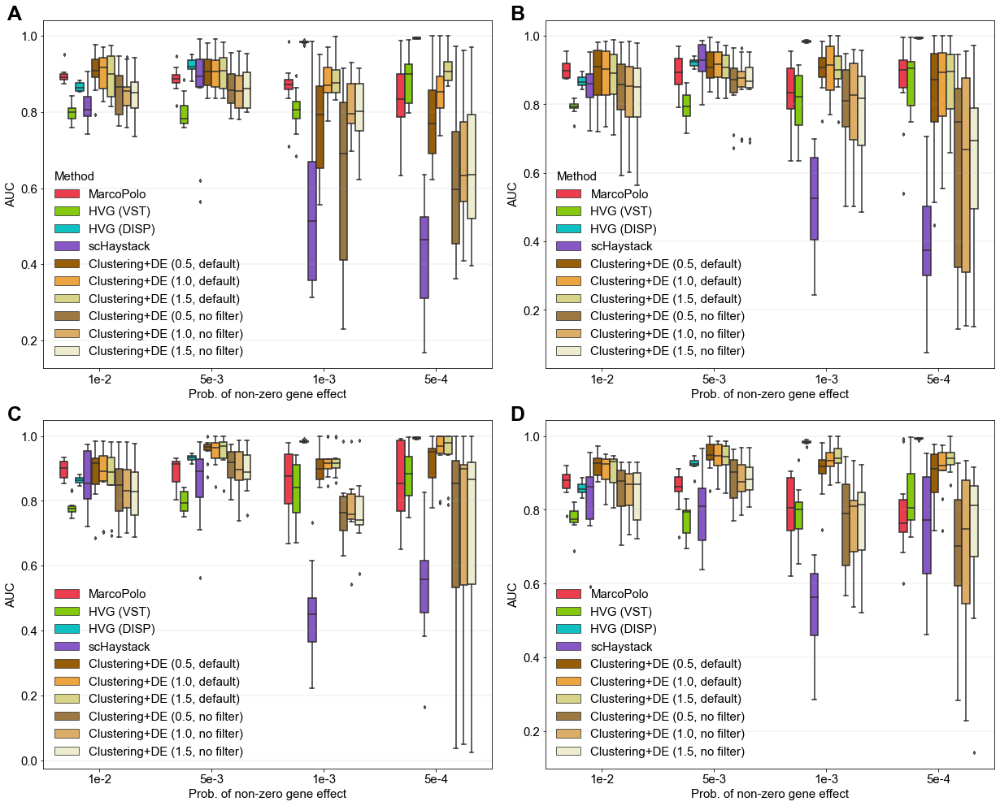

In [18]:
plt.rcParams["axes.prop_cycle"]=cycler('color',color_qual_7_3)
plt.rcParams["font.size"] = 15

fig = plt.figure(figsize=(25, 25)) 
gs=fig.add_gridspec(25,25)


fig_sub1=fig.add_subplot(gs[0:8,0:10])

sns.boxplot(x='Prob. of non-zero gene effect',y='AUC',
            order=['1e-2','5e-3','1e-3','5e-4'],
            hue='Method',
            hue_order=['MarcoPolo','HVG (VST)','HVG (DISP)','scHaystack',
                       'Clustering+DE (0.5, default)','Clustering+DE (1.0, default)','Clustering+DE (1.5, default)',
                       'Clustering+DE (0.5, no filter)','Clustering+DE (1.0, no filter)','Clustering+DE (1.5, no filter)'],            
            palette=color_qual_7_3,
            data=record_list_df_simul[      (record_list_df_simul['ncells_total']==1000)
                                     ],
            width=0.7,
            saturation=0.9,
            flierprops = dict(markerfacecolor = '0.50', markersize = 3),
            ax=fig_sub1
           )
fig_sub1.yaxis.grid(True,linewidth=0.4,alpha=0.6)
#leg=fig_sub1.legend()
fig_sub1.get_legend()._legend_box.align = "left"
#plt.legend()
fig_sub1.text(-0.08, 1.0, 'A', fontproperties=font_prop(bold=True,size=25), transform=fig_sub1.transAxes)

fig_sub1=fig.add_subplot(gs[0:0+8,11:21])

sns.boxplot(x='Prob. of non-zero gene effect',y='AUC',
            order=['1e-2','5e-3','1e-3','5e-4'],
            hue='Method',
            hue_order=['MarcoPolo','HVG (VST)','HVG (DISP)','scHaystack',
                       'Clustering+DE (0.5, default)','Clustering+DE (1.0, default)','Clustering+DE (1.5, default)',
                       'Clustering+DE (0.5, no filter)','Clustering+DE (1.0, no filter)','Clustering+DE (1.5, no filter)'],                        
            palette=color_qual_7_3,
            data=record_list_df_simul[      (record_list_df_simul['ncells_total']==2000)
                                     ],
            width=0.7,
            saturation=0.9,
            flierprops = dict(markerfacecolor = '0.50', markersize = 3),
            ax=fig_sub1
           )
fig_sub1.yaxis.grid(True,linewidth=0.4,alpha=0.6)
#leg=fig_sub1.legend()
fig_sub1.get_legend()._legend_box.align = "left"
#plt.legend()
fig_sub1.text(-0.08, 1.0, 'B', fontproperties=font_prop(bold=True,size=25), transform=fig_sub1.transAxes)



fig_sub1=fig.add_subplot(gs[9:9+8,0:10])

sns.boxplot(x='Prob. of non-zero gene effect',y='AUC',
            order=['1e-2','5e-3','1e-3','5e-4'],
            hue='Method',
            hue_order=['MarcoPolo','HVG (VST)','HVG (DISP)','scHaystack',
                       'Clustering+DE (0.5, default)','Clustering+DE (1.0, default)','Clustering+DE (1.5, default)',
                       'Clustering+DE (0.5, no filter)','Clustering+DE (1.0, no filter)','Clustering+DE (1.5, no filter)'],                        
            palette=color_qual_7_3,
            data=record_list_df_simul[      (record_list_df_simul['ncells_total']==5000)
                                     ],
            width=0.7,
            saturation=0.9,
            flierprops = dict(markerfacecolor = '0.50', markersize = 3),
            ax=fig_sub1
           )
fig_sub1.yaxis.grid(True,linewidth=0.4,alpha=0.6)
#leg=fig_sub1.legend()
fig_sub1.get_legend()._legend_box.align = "left"
fig_sub1.legend(loc="lower left")
fig_sub1.text(-0.08, 1.0, 'C', fontproperties=font_prop(bold=True,size=25), transform=fig_sub1.transAxes)


fig_sub1=fig.add_subplot(gs[9:9+8,11:21])

sns.boxplot(x='Prob. of non-zero gene effect',y='AUC',
            order=['1e-2','5e-3','1e-3','5e-4'],
            hue='Method',
            hue_order=['MarcoPolo','HVG (VST)','HVG (DISP)','scHaystack',
                       'Clustering+DE (0.5, default)','Clustering+DE (1.0, default)','Clustering+DE (1.5, default)',
                       'Clustering+DE (0.5, no filter)','Clustering+DE (1.0, no filter)','Clustering+DE (1.5, no filter)'],                        
            palette=color_qual_7_3,
            data=record_list_df_simul[      (record_list_df_simul['ncells_total']==10000)                              
                                     
                                     ],
            width=0.7,
            saturation=0.9,
            flierprops = dict(markerfacecolor = '0.50', markersize = 3),
            ax=fig_sub1
           )
fig_sub1.yaxis.grid(True,linewidth=0.4,alpha=0.6)
#leg=fig_sub1.legend()
fig_sub1.get_legend()._legend_box.align = "left"
#plt.legend()
fig_sub1.legend(loc="lower left")
fig_sub1.text(-0.08, 1.0, 'D', fontproperties=font_prop(bold=True,size=25), transform=fig_sub1.transAxes)

Text(-0.08, 1.0, 'D')

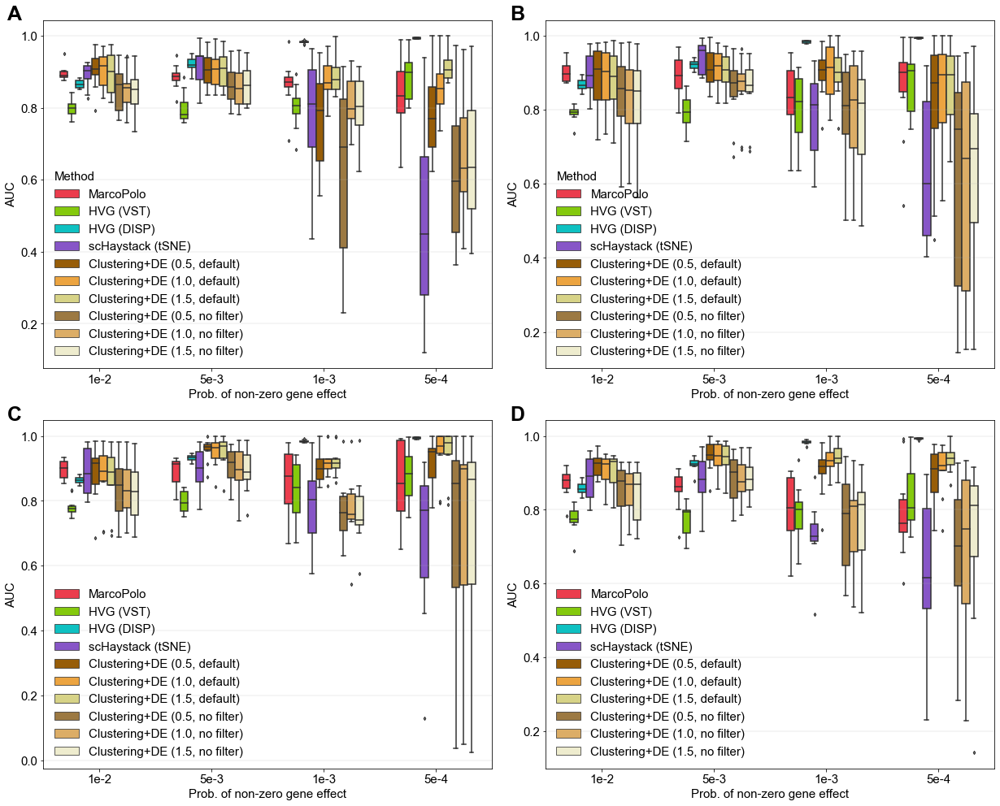

In [19]:
plt.rcParams["axes.prop_cycle"]=cycler('color',color_qual_7_3)
plt.rcParams["font.size"] = 15

fig = plt.figure(figsize=(25, 25)) 
gs=fig.add_gridspec(25,25)


fig_sub1=fig.add_subplot(gs[0:8,0:10])

sns.boxplot(x='Prob. of non-zero gene effect',y='AUC',
            order=['1e-2','5e-3','1e-3','5e-4'],
            hue='Method',
            hue_order=['MarcoPolo','HVG (VST)','HVG (DISP)','scHaystack (tSNE)',
                       'Clustering+DE (0.5, default)','Clustering+DE (1.0, default)','Clustering+DE (1.5, default)',
                       'Clustering+DE (0.5, no filter)','Clustering+DE (1.0, no filter)','Clustering+DE (1.5, no filter)'],            
            palette=color_qual_7_3,
            data=record_list_df_simul[      (record_list_df_simul['ncells_total']==1000)
                                     ],
            width=0.7,
            saturation=0.9,
            flierprops = dict(markerfacecolor = '0.50', markersize = 3),
            ax=fig_sub1
           )
fig_sub1.yaxis.grid(True,linewidth=0.4,alpha=0.6)
#leg=fig_sub1.legend()
fig_sub1.get_legend()._legend_box.align = "left"
#plt.legend()
fig_sub1.text(-0.08, 1.0, 'A', fontproperties=font_prop(bold=True,size=25), transform=fig_sub1.transAxes)

fig_sub1=fig.add_subplot(gs[0:0+8,11:21])

sns.boxplot(x='Prob. of non-zero gene effect',y='AUC',
            order=['1e-2','5e-3','1e-3','5e-4'],
            hue='Method',
            hue_order=['MarcoPolo','HVG (VST)','HVG (DISP)','scHaystack (tSNE)',
                       'Clustering+DE (0.5, default)','Clustering+DE (1.0, default)','Clustering+DE (1.5, default)',
                       'Clustering+DE (0.5, no filter)','Clustering+DE (1.0, no filter)','Clustering+DE (1.5, no filter)'],                        
            palette=color_qual_7_3,
            data=record_list_df_simul[      (record_list_df_simul['ncells_total']==2000)
                                     ],
            width=0.7,
            saturation=0.9,
            flierprops = dict(markerfacecolor = '0.50', markersize = 3),
            ax=fig_sub1
           )
fig_sub1.yaxis.grid(True,linewidth=0.4,alpha=0.6)
#leg=fig_sub1.legend()
fig_sub1.get_legend()._legend_box.align = "left"
#plt.legend()
fig_sub1.text(-0.08, 1.0, 'B', fontproperties=font_prop(bold=True,size=25), transform=fig_sub1.transAxes)



fig_sub1=fig.add_subplot(gs[9:9+8,0:10])

sns.boxplot(x='Prob. of non-zero gene effect',y='AUC',
            order=['1e-2','5e-3','1e-3','5e-4'],
            hue='Method',
            hue_order=['MarcoPolo','HVG (VST)','HVG (DISP)','scHaystack (tSNE)',
                       'Clustering+DE (0.5, default)','Clustering+DE (1.0, default)','Clustering+DE (1.5, default)',
                       'Clustering+DE (0.5, no filter)','Clustering+DE (1.0, no filter)','Clustering+DE (1.5, no filter)'],                        
            palette=color_qual_7_3,
            data=record_list_df_simul[      (record_list_df_simul['ncells_total']==5000)
                                     ],
            width=0.7,
            saturation=0.9,
            flierprops = dict(markerfacecolor = '0.50', markersize = 3),
            ax=fig_sub1
           )
fig_sub1.yaxis.grid(True,linewidth=0.4,alpha=0.6)
#leg=fig_sub1.legend()
fig_sub1.get_legend()._legend_box.align = "left"
fig_sub1.legend(loc="lower left")
fig_sub1.text(-0.08, 1.0, 'C', fontproperties=font_prop(bold=True,size=25), transform=fig_sub1.transAxes)


fig_sub1=fig.add_subplot(gs[9:9+8,11:21])

sns.boxplot(x='Prob. of non-zero gene effect',y='AUC',
            order=['1e-2','5e-3','1e-3','5e-4'],
            hue='Method',
            hue_order=['MarcoPolo','HVG (VST)','HVG (DISP)','scHaystack (tSNE)',
                       'Clustering+DE (0.5, default)','Clustering+DE (1.0, default)','Clustering+DE (1.5, default)',
                       'Clustering+DE (0.5, no filter)','Clustering+DE (1.0, no filter)','Clustering+DE (1.5, no filter)'],                        
            palette=color_qual_7_3,
            data=record_list_df_simul[      (record_list_df_simul['ncells_total']==10000)                              
                                     
                                     ],
            width=0.7,
            saturation=0.9,
            flierprops = dict(markerfacecolor = '0.50', markersize = 3),
            ax=fig_sub1
           )
fig_sub1.yaxis.grid(True,linewidth=0.4,alpha=0.6)
#leg=fig_sub1.legend()
fig_sub1.get_legend()._legend_box.align = "left"
#plt.legend()
fig_sub1.legend(loc="lower left")
fig_sub1.text(-0.08, 1.0, 'D', fontproperties=font_prop(bold=True,size=25), transform=fig_sub1.transAxes)

Text(-0.08, 1.0, 'D')

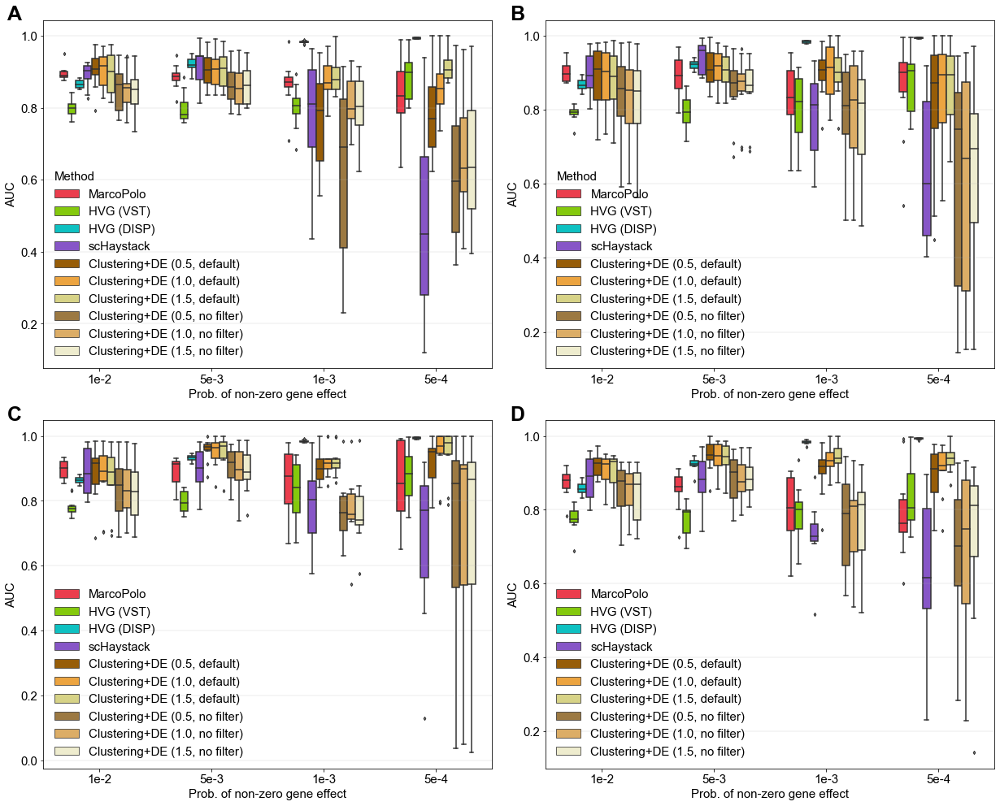

In [230]:
plt.rcParams["axes.prop_cycle"]=cycler('color',color_qual_7_3)
plt.rcParams["font.size"] = 15

fig = plt.figure(figsize=(25, 25)) 
gs=fig.add_gridspec(25,25)


fig_sub1=fig.add_subplot(gs[0:8,0:10])

sns.boxplot(x='Prob. of non-zero gene effect',y='AUC',
            order=['1e-2','5e-3','1e-3','5e-4'],
            hue='Method',
            hue_order=['MarcoPolo','HVG (VST)','HVG (DISP)','scHaystack',
                       'Clustering+DE (0.5, default)','Clustering+DE (1.0, default)','Clustering+DE (1.5, default)',
                       'Clustering+DE (0.5, no filter)','Clustering+DE (1.0, no filter)','Clustering+DE (1.5, no filter)'],            
            palette=color_qual_7_3,
            data=record_list_df_simul[      (record_list_df_simul['ncells_total']==1000)
                                     ],
            width=0.7,
            saturation=0.9,
            flierprops = dict(markerfacecolor = '0.50', markersize = 3),
            ax=fig_sub1
           )
fig_sub1.yaxis.grid(True,linewidth=0.4,alpha=0.6)
#leg=fig_sub1.legend()
fig_sub1.get_legend()._legend_box.align = "left"
#plt.legend()
fig_sub1.text(-0.08, 1.0, 'A', fontproperties=font_prop(bold=True,size=25), transform=fig_sub1.transAxes)

fig_sub1=fig.add_subplot(gs[0:0+8,11:21])

sns.boxplot(x='Prob. of non-zero gene effect',y='AUC',
            order=['1e-2','5e-3','1e-3','5e-4'],
            hue='Method',
            hue_order=['MarcoPolo','HVG (VST)','HVG (DISP)','scHaystack',
                       'Clustering+DE (0.5, default)','Clustering+DE (1.0, default)','Clustering+DE (1.5, default)',
                       'Clustering+DE (0.5, no filter)','Clustering+DE (1.0, no filter)','Clustering+DE (1.5, no filter)'],                        
            palette=color_qual_7_3,
            data=record_list_df_simul[      (record_list_df_simul['ncells_total']==2000)
                                     ],
            width=0.7,
            saturation=0.9,
            flierprops = dict(markerfacecolor = '0.50', markersize = 3),
            ax=fig_sub1
           )
fig_sub1.yaxis.grid(True,linewidth=0.4,alpha=0.6)
#leg=fig_sub1.legend()
fig_sub1.get_legend()._legend_box.align = "left"
#plt.legend()
fig_sub1.text(-0.08, 1.0, 'B', fontproperties=font_prop(bold=True,size=25), transform=fig_sub1.transAxes)



fig_sub1=fig.add_subplot(gs[9:9+8,0:10])

sns.boxplot(x='Prob. of non-zero gene effect',y='AUC',
            order=['1e-2','5e-3','1e-3','5e-4'],
            hue='Method',
            hue_order=['MarcoPolo','HVG (VST)','HVG (DISP)','scHaystack',
                       'Clustering+DE (0.5, default)','Clustering+DE (1.0, default)','Clustering+DE (1.5, default)',
                       'Clustering+DE (0.5, no filter)','Clustering+DE (1.0, no filter)','Clustering+DE (1.5, no filter)'],                        
            palette=color_qual_7_3,
            data=record_list_df_simul[      (record_list_df_simul['ncells_total']==5000)
                                     ],
            width=0.7,
            saturation=0.9,
            flierprops = dict(markerfacecolor = '0.50', markersize = 3),
            ax=fig_sub1
           )
fig_sub1.yaxis.grid(True,linewidth=0.4,alpha=0.6)
#leg=fig_sub1.legend()
fig_sub1.get_legend()._legend_box.align = "left"
fig_sub1.legend(loc="lower left")
fig_sub1.text(-0.08, 1.0, 'C', fontproperties=font_prop(bold=True,size=25), transform=fig_sub1.transAxes)


fig_sub1=fig.add_subplot(gs[9:9+8,11:21])

sns.boxplot(x='Prob. of non-zero gene effect',y='AUC',
            order=['1e-2','5e-3','1e-3','5e-4'],
            hue='Method',
            hue_order=['MarcoPolo','HVG (VST)','HVG (DISP)','scHaystack',
                       'Clustering+DE (0.5, default)','Clustering+DE (1.0, default)','Clustering+DE (1.5, default)',
                       'Clustering+DE (0.5, no filter)','Clustering+DE (1.0, no filter)','Clustering+DE (1.5, no filter)'],                        
            palette=color_qual_7_3,
            data=record_list_df_simul[      (record_list_df_simul['ncells_total']==10000)                              
                                     
                                     ],
            width=0.7,
            saturation=0.9,
            flierprops = dict(markerfacecolor = '0.50', markersize = 3),
            ax=fig_sub1
           )
fig_sub1.yaxis.grid(True,linewidth=0.4,alpha=0.6)
#leg=fig_sub1.legend()
fig_sub1.get_legend()._legend_box.align = "left"
#plt.legend()
fig_sub1.legend(loc="lower left")
fig_sub1.text(-0.08, 1.0, 'D', fontproperties=font_prop(bold=True,size=25), transform=fig_sub1.transAxes)

In [231]:
fig.savefig('pub/simul_AUC_overall_ncells.png', bbox_inches='tight')
fig.savefig('pub/simul_AUC_overall_ncells.jpg', bbox_inches='tight')
fig.savefig('pub/simul_AUC_overall_ncells.svg', bbox_inches='tight')

Text(-0.08, 1.0, 'b')

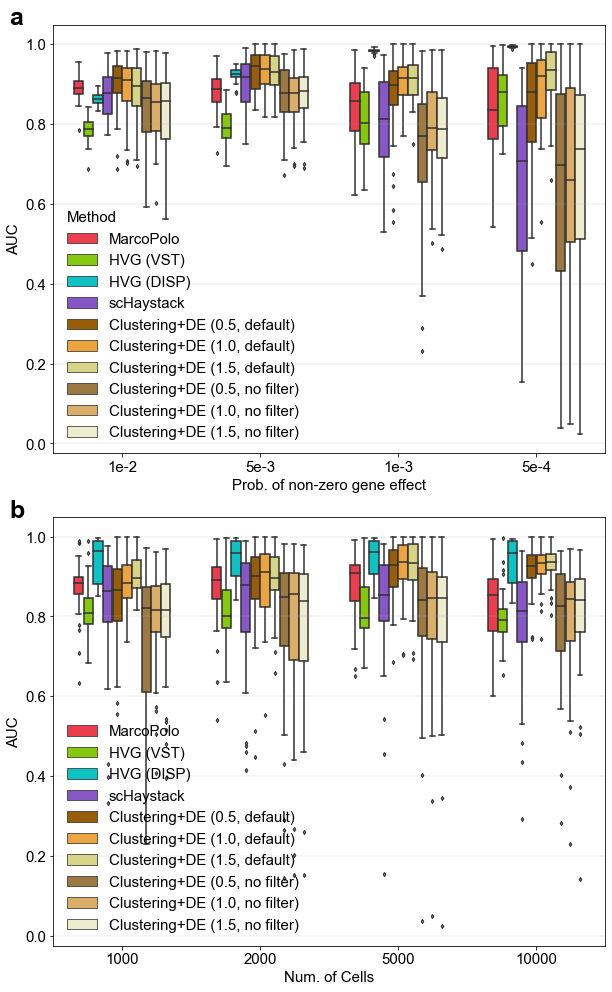

In [36]:
plt.rcParams["axes.prop_cycle"]=cycler('color',color_qual_7_3)
plt.rcParams["font.size"] = 15

fig = plt.figure(figsize=(25, 25)) 
gs=fig.add_gridspec(25,25)


fig_sub1=fig.add_subplot(gs[0:8,0:10])

sns.boxplot(x='Prob. of non-zero gene effect',y='AUC',
            order=['1e-2','5e-3','1e-3','5e-4'],
            hue='Method',
            hue_order=['MarcoPolo','HVG (VST)','HVG (DISP)','scHaystack',
                       'Clustering+DE (0.5, default)','Clustering+DE (1.0, default)','Clustering+DE (1.5, default)',
                       'Clustering+DE (0.5, no filter)','Clustering+DE (1.0, no filter)','Clustering+DE (1.5, no filter)'],            
            palette=color_qual_7_3,
            data=record_list_df_simul,
            width=0.7,
            saturation=0.9,
            flierprops = dict(markerfacecolor = '0.50', markersize = 3),
            ax=fig_sub1
           )
fig_sub1.yaxis.grid(True,linewidth=0.4,alpha=0.6)
#leg=fig_sub1.legend()
fig_sub1.get_legend()._legend_box.align = "left"
#plt.legend()
fig_sub1.text(-0.08, 1.0, 'a', fontproperties=font_prop(bold=True,size=25), transform=fig_sub1.transAxes)

fig_sub1=fig.add_subplot(gs[9:9+8,0:10])

sns.boxplot(x='Num. of Cells',y='AUC',
            hue='Method',
            order=[1000,2000,5000,10000],
            hue_order=['MarcoPolo','HVG (VST)','HVG (DISP)','scHaystack',
                       'Clustering+DE (0.5, default)','Clustering+DE (1.0, default)','Clustering+DE (1.5, default)',
                       'Clustering+DE (0.5, no filter)','Clustering+DE (1.0, no filter)','Clustering+DE (1.5, no filter)'],                        
            palette=color_qual_7_3,
            data=record_list_df_simul,
            width=0.7,
            saturation=0.9,
            flierprops = dict(markerfacecolor = '0.50', markersize = 3),
            ax=fig_sub1
           )
fig_sub1.yaxis.grid(True,linewidth=0.4,alpha=0.6)
#leg=fig_sub1.legend()
fig_sub1.get_legend()._legend_box.align = "left"
#plt.legend()
fig_sub1.legend(loc="lower left")
fig_sub1.text(-0.08, 1.0, 'b', fontproperties=font_prop(bold=True,size=25), transform=fig_sub1.transAxes)



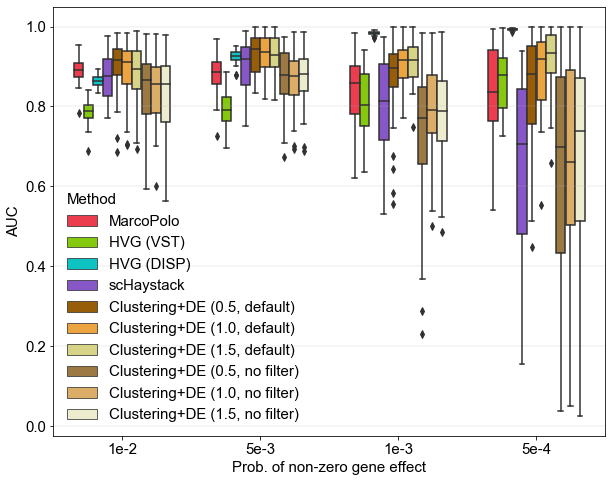

In [55]:
plt.rcParams["axes.prop_cycle"]=cycler('color',color_qual_7_3)
plt.rcParams["font.size"] = 15

fig = plt.figure(figsize=(25, 25)) 
gs=fig.add_gridspec(25,25)


fig_sub1=fig.add_subplot(gs[0:8,0:10])

sns.boxplot(x='Prob. of non-zero gene effect',y='AUC',
            order=['1e-2','5e-3','1e-3','5e-4'],
            hue='Method',
            hue_order=['MarcoPolo','HVG (VST)','HVG (DISP)','scHaystack',
                       'Clustering+DE (0.5, default)','Clustering+DE (1.0, default)','Clustering+DE (1.5, default)',
                       'Clustering+DE (0.5, no filter)','Clustering+DE (1.0, no filter)','Clustering+DE (1.5, no filter)'],            
            palette=color_qual_7_3,
            data=record_list_df_simul,
            width=0.7,
            saturation=0.9,
            ax=fig_sub1
           )
fig_sub1.yaxis.grid(True,linewidth=0.4,alpha=0.6)
#leg=fig_sub1.legend()
fig_sub1.get_legend()._legend_box.align = "left"
#plt.legend()


In [56]:
fig.savefig('pub/simul_AUC_overall.png', bbox_inches='tight')
fig.savefig('pub/simul_AUC_overall.jpg', bbox_inches='tight')
fig.savefig('pub/simul_AUC_overall.svg', bbox_inches='tight')

In [38]:
record_list_df_simul

,Prob. of non-zero gene effect,ncells_total,num_marker,num_marker_old,num_marker_intersection,Method,AUC,ARI,runtime,runtime2,Prob. of non-zero gene effect_num,Methods,Num. of Cells,Adjusted Rand Index
0,1e-2,1000,204,89,89,MarcoPolo,0.890319,0.000000,243.881035,22470.524193,0.0100,MarcoPolo,1000,0.000000
1,1e-2,1000,204,89,89,HVG (VST),0.810446,0.000000,NaN,NaN,0.0100,HVG (VST),1000,0.000000
2,1e-2,1000,204,89,89,HVG (DISP),0.871271,0.000000,NaN,NaN,0.0100,HVG (DISP),1000,0.000000
3,1e-2,1000,204,89,89,scHaystack,0.849321,0.000000,21.741828,21.741828,0.0100,scHaystack,1000,0.000000
4,1e-2,1000,204,89,89,"Clustering+DE (0.5, no filter)",0.845827,0.206282,66.183386,66.183386,0.0100,"Clustering (0.5, no filter)",1000,0.206282
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1595,5e-4,10000,11,8,8,"Clustering+DE (1.0, no filter)",0.652726,0.043683,769.865413,769.865413,0.0005,"Clustering (1.0, no filter)",10000,0.043683
1596,5e-4,10000,11,8,8,"Clustering+DE (1.5, no filter)",0.654558,0.047321,1150.823047,1150.823047,0.0005,"Clustering (1.5, no filter)",10000,0.047321
1597,5e-4,10000,11,8,8,"Clustering+DE (0.5, default)",0.907198,0.039734,57.275253,57.275253,0.0005,Clustering (0.5),10000,0.039734
1598,5e-4,10000,11,8,8,"Clustering+DE (1.0, default)",0.907076,0.043683,62.271167,62.271167,0.0005,Clustering (1.0),10000,0.043683


In [30]:
record_list_df_simul.groupby(['Prob. of non-zero gene effect','ncells_total','Method']).median().loc['5e-4',1000]

,num_marker,num_marker_old,num_marker_intersection,AUC,ARI,runtime,runtime2,Prob. of non-zero gene effect_num,Num. of Cells
Method,,,,,,,,,
"Clustering+DE (0.5, default)",11.5,7.0,7.0,0.768926,0.010017,4.583835,4.583835,0.0005,1000.0
"Clustering+DE (0.5, no filter)",11.5,7.0,7.0,0.596760,0.010017,26.577464,26.577464,0.0005,1000.0
"Clustering+DE (1.0, default)",11.5,7.0,7.0,0.852747,0.011096,4.784115,4.784115,0.0005,1000.0
"Clustering+DE (1.0, no filter)",11.5,7.0,7.0,0.632726,0.011096,48.146750,48.146750,0.0005,1000.0
"Clustering+DE (1.5, default)",11.5,7.0,7.0,0.906080,0.009152,5.311406,5.311406,0.0005,1000.0
"Clustering+DE (1.5, no filter)",11.5,7.0,7.0,0.634454,0.009152,75.454775,75.454775,0.0005,1000.0
HVG (DISP),11.5,7.0,7.0,0.994125,0.000000,NaN,NaN,0.0005,1000.0
HVG (VST),11.5,7.0,7.0,0.899325,0.000000,NaN,NaN,0.0005,1000.0
MarcoPolo,11.5,7.0,7.0,0.832884,0.000000,374.303708,42211.984554,0.0005,1000.0


In [34]:
record_list_df_simul.groupby(['Prob. of non-zero gene effect','Method']).median().loc['1e-2']

,ncells_total,num_marker,num_marker_old,num_marker_intersection,AUC,ARI,runtime,runtime2,Prob. of non-zero gene effect_num,Num. of Cells
Method,,,,,,,,,,
"Clustering+DE (0.5, default)",3500.0,191.5,129.5,128.0,0.915395,0.412492,30.870735,30.870735,0.01,3500.0
"Clustering+DE (0.5, no filter)",3500.0,191.5,129.5,128.0,0.865536,0.412492,280.845010,280.845010,0.01,3500.0
"Clustering+DE (1.0, default)",3500.0,191.5,129.5,128.0,0.911134,0.416188,35.314499,35.314499,0.01,3500.0
"Clustering+DE (1.0, no filter)",3500.0,191.5,129.5,128.0,0.855579,0.416188,367.952274,367.952274,0.01,3500.0
"Clustering+DE (1.5, default)",3500.0,191.5,129.5,128.0,0.894548,0.399417,37.958104,37.958104,0.01,3500.0
"Clustering+DE (1.5, no filter)",3500.0,191.5,129.5,128.0,0.856928,0.399417,455.019691,455.019691,0.01,3500.0
HVG (DISP),3500.0,191.5,129.5,128.0,0.863470,0.000000,NaN,NaN,0.01,3500.0
HVG (VST),3500.0,191.5,129.5,128.0,0.787445,0.000000,NaN,NaN,0.01,3500.0
MarcoPolo,3500.0,191.5,129.5,128.0,0.891122,0.000000,292.963069,19353.394363,0.01,3500.0


In [32]:
record_list_df_simul.groupby(['Prob. of non-zero gene effect','Method']).agg(iqr_func).loc['5e-4']

,ncells_total,num_marker,num_marker_old,num_marker_intersection,AUC,ARI,runtime,runtime2,Prob. of non-zero gene effect_num,Num. of Cells
Method,,,,,,,,,,
"Clustering+DE (0.5, default)",4500,4.0,5.0,4.25,0.196808,0.082424,40.646488,40.646488,0.0,4500
"Clustering+DE (0.5, no filter)",4500,4.0,5.0,4.25,0.441854,0.082424,261.722631,261.722631,0.0,4500
"Clustering+DE (1.0, default)",4500,4.0,5.0,4.25,0.146136,0.080124,41.176135,41.176135,0.0,4500
"Clustering+DE (1.0, no filter)",4500,4.0,5.0,4.25,0.387353,0.080124,439.160846,439.160846,0.0,4500
"Clustering+DE (1.5, default)",4500,4.0,5.0,4.25,0.094735,0.068391,43.119073,43.119073,0.0,4500
"Clustering+DE (1.5, no filter)",4500,4.0,5.0,4.25,0.358476,0.068391,556.000945,556.000945,0.0,4500
HVG (DISP),4500,4.0,5.0,4.25,0.002843,0.000000,NaN,NaN,0.0,4500
HVG (VST),4500,4.0,5.0,4.25,0.126212,0.000000,NaN,NaN,0.0,4500
MarcoPolo,4500,4.0,5.0,4.25,0.177131,0.000000,136.847564,13643.511921,0.0,4500


In [29]:
record_list_df_simul.groupby(['Prob. of non-zero gene effect','ncells_total','Method']).agg(iqr_func).loc['5e-4',1000]

,num_marker,num_marker_old,num_marker_intersection,AUC,ARI,runtime,runtime2,Prob. of non-zero gene effect_num,Num. of Cells
Method,,,,,,,,,
"Clustering+DE (0.5, default)",3.5,3.25,2.5,0.166976,0.034044,0.868019,0.868019,0.0,0
"Clustering+DE (0.5, no filter)",3.5,3.25,2.5,0.294097,0.034044,1.051768,1.051768,0.0,0
"Clustering+DE (1.0, default)",3.5,3.25,2.5,0.082857,0.023051,0.707865,0.707865,0.0,0
"Clustering+DE (1.0, no filter)",3.5,3.25,2.5,0.207175,0.023051,2.892213,2.892213,0.0,0
"Clustering+DE (1.5, default)",3.5,3.25,2.5,0.048382,0.017340,0.216324,0.216324,0.0,0
"Clustering+DE (1.5, no filter)",3.5,3.25,2.5,0.272592,0.017340,6.819453,6.819453,0.0,0
HVG (DISP),3.5,3.25,2.5,0.003560,0.000000,NaN,NaN,0.0,0
HVG (VST),3.5,3.25,2.5,0.102646,0.000000,NaN,NaN,0.0,0
MarcoPolo,3.5,3.25,2.5,0.114207,0.000000,15.147957,1415.459216,0.0,0


In [24]:
def iqr_func(x):

    q3, q1 = np.percentile(x, [75, 25])
    #print(x)
    iqr = q3 - q1
    #print(iqr)
    return iqr

In [25]:
record_list_df_simul.groupby(['Prob. of non-zero gene effect','Method']).agg(iqr_func).loc['5e-4']

,ncells_total,num_marker,num_marker_old,num_marker_intersection,AUC,ARI,runtime,runtime2,Prob. of non-zero gene effect_num,Num. of Cells
Method,,,,,,,,,,
"Clustering+DE (0.5, default)",4500,4.0,5.0,4.25,0.196808,0.082424,40.646488,40.646488,0.0,4500
"Clustering+DE (0.5, no filter)",4500,4.0,5.0,4.25,0.441854,0.082424,261.722631,261.722631,0.0,4500
"Clustering+DE (1.0, default)",4500,4.0,5.0,4.25,0.146136,0.080124,41.176135,41.176135,0.0,4500
"Clustering+DE (1.0, no filter)",4500,4.0,5.0,4.25,0.387353,0.080124,439.160846,439.160846,0.0,4500
"Clustering+DE (1.5, default)",4500,4.0,5.0,4.25,0.094735,0.068391,43.119073,43.119073,0.0,4500
"Clustering+DE (1.5, no filter)",4500,4.0,5.0,4.25,0.358476,0.068391,556.000945,556.000945,0.0,4500
HVG (DISP),4500,4.0,5.0,4.25,0.002843,0.000000,NaN,NaN,0.0,4500
HVG (VST),4500,4.0,5.0,4.25,0.126212,0.000000,NaN,NaN,0.0,4500
MarcoPolo,4500,4.0,5.0,4.25,0.177131,0.000000,136.847564,13643.511921,0.0,4500


In [ ]:
record_list_df_simul.groupby(['Prob. of non-zero gene effect','Method']).agg(iqr_func).loc['5e-4']

In [161]:
df_sub_median=record_list_df_simul.groupby(['Prob. of non-zero gene effect','Num. of Cells','Method']).agg(np.median)[['AUC']]
df_sub_median=df_sub_median.rename(columns={'AUC':'Median AUC'})

df_sub_iqr=record_list_df_simul.groupby(['Prob. of non-zero gene effect','Num. of Cells','Method']).agg(iqr_func)[['AUC']]
df_sub_iqr=df_sub_iqr.rename(columns={'AUC':'IQR of AUC'})

In [165]:
pd.concat([df_sub_median,df_sub_iqr],axis=1).to_csv("pub/AUC_table.tsv",sep='\t')

In [160]:
record_list_df_simul['Method']

0                            MarcoPolo
1                            HVG (VST)
2                           HVG (DISP)
3                           scHaystack
4       Clustering+DE (0.5, no filter)
                     ...              
1578    Clustering+DE (1.0, no filter)
1579    Clustering+DE (1.5, no filter)
1580      Clustering+DE (0.5, default)
1581      Clustering+DE (1.0, default)
1582      Clustering+DE (1.5, default)
Name: Method, Length: 1583, dtype: object

In [74]:
a.set_index("Unnamed: 0").loc[b.columns[1:].astype(int)]

,0
3143,0.581021
96,0.738052
1982,0.751277
2586,0.338479
3573,0.346704
...,...
1681,0.305226
4594,0.342484
110,0.845898
4020,0.334758


In [79]:
a,b

(      Unnamed: 0         0
 0           2805  0.024964
 1           4231  0.043783
 2           1538  0.018659
 3           4372  0.078255
 4           1170  0.052357
 ...          ...       ...
 1495        4713  0.043974
 1496        4065  0.036546
 1497        4288  0.038138
 1498        3197  0.118695
 1499        3646  0.115324
 
 [1500 rows x 2 columns],
    Unnamed: 0
 0           1
 1           2
 2           3
 3           4
 4           5
 5           6
 6           7
 7           8
 8           9)

In [78]:
#record_list=[]#pd.DataFrame(columns=[1],index=['1e-2','5e-3','1e-3','5e-4','1e-4'])
for ncells_total in [1000,2000,5000,10000]:
    for prop in ['1e-2','5e-3','1e-3','5e-4'][::]:
        for i in range(1,10+1):
            
            dataset_name='Simul_{}_{}_{}_filtered'.format(ncells_total,prop,i)
            
            a=pd.read_csv("datasets/extract/{}.maxdiff.500.2.tsv".format(dataset_name),sep='\t')
            b=pd.read_csv("datasets/extract/{}.markerrho.500.2.tsv".format(dataset_name),sep='\t')

            with open('datasets/extract/{}.data.row'.format(dataset_name),'r') as f: exp_data_row=[i.strip().strip('"') for i in f.read().split()]
            with open('datasets/extract/{}.data.col'.format(dataset_name),'r') as f: exp_data_col=[i.strip().strip('"') for i in f.read().split()]    

            print(ncells_total,prop,i,
                  a.set_index("Unnamed: 0").loc[b.columns[1:].astype(int)]['0'].sort_values().iloc[0],
                 len(a.set_index("Unnamed: 0").loc[b.columns[1:].astype(int)])
                 )

1000 1e-2 1 0.6307051727774924 26
1000 1e-2 2 0.6064342126844215 43
1000 1e-2 3 0.6208608261788877 61
1000 1e-2 4 0.6091495720646415 31
1000 1e-2 5 0.6326182178204987 64
1000 1e-2 6 0.6167681367346933 74
1000 1e-2 7 0.6057249454143676 23
1000 1e-2 8 0.6057249454143677 18
1000 1e-2 9 0.6023977796952309 27
1000 1e-2 10 0.605398166732443 28
1000 5e-3 1 0.7749222802534451 12
1000 5e-3 2 0.6055656151964829 33
1000 5e-3 3 0.6047885520220324 39
1000 5e-3 4 0.6112063668987088 19
1000 5e-3 5 0.6310202246940095 39
1000 5e-3 6 0.6034497348559681 45
1000 5e-3 7 0.6023560003013007 27
1000 5e-3 8 0.6022917695759737 23
1000 5e-3 9 0.6023800101054282 20
1000 5e-3 10 0.6239939017794548 17
1000 1e-3 1 0.809955607535885 5
1000 1e-3 2 0.6064654306438915 11
1000 1e-3 3 0.6091189026333302 9
1000 1e-3 4 0.6332220473562935 9
1000 1e-3 5 0.6301157493508175 9
1000 1e-3 6 0.6383209583739986 8
1000 1e-3 7 0.6803585637112719 11
1000 1e-3 8 0.6224259830766348 6
1000 1e-3 9 0.617770865044436 6
1000 1e-3 10 0.6573962

IndexError: single positional indexer is out-of-bounds

Text(-0.08, 1.0, 'b')

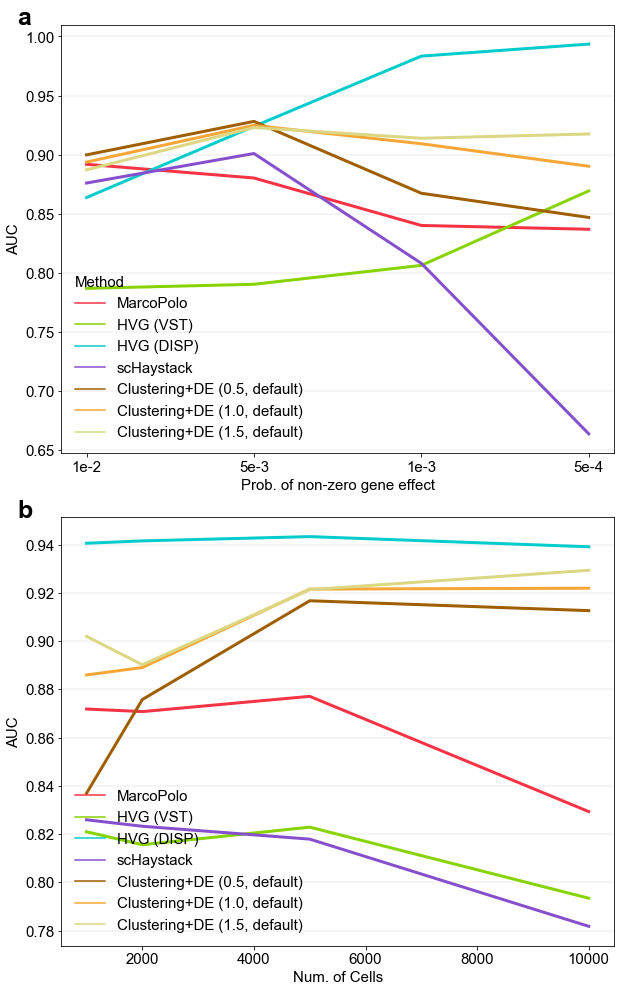

In [177]:
plt.rcParams["axes.prop_cycle"]=cycler('color',color_qual_7_3)
plt.rcParams["font.size"] = 15

fig = plt.figure(figsize=(25, 25)) 
gs=fig.add_gridspec(25,25)


fig_sub1=fig.add_subplot(gs[0:8,0:10])

sns.lineplot(x='Prob. of non-zero gene effect',y='AUC',
            hue='Method',
            hue_order=['MarcoPolo','HVG (VST)','HVG (DISP)','scHaystack',
                       'Clustering+DE (0.5, default)','Clustering+DE (1.0, default)','Clustering+DE (1.5, default)'],            
            palette=color_qual_7,
            err_style=None,
            linewidth=3,

            data=record_list_df_simul[~record_list_df_simul['Method'].str.contains('filter')],
            ax=fig_sub1
           )
"""
estimator=lambda x: np.median(x),
err_style=None,
"""
fig_sub1.yaxis.grid(True,linewidth=0.4,alpha=0.6)
#leg=fig_sub1.legend()
fig_sub1.get_legend()._legend_box.align = "left"
#plt.legend()
fig_sub1.text(-0.08, 1.0, 'a', fontproperties=font_prop(bold=True,size=25), transform=fig_sub1.transAxes)




fig_sub1=fig.add_subplot(gs[9:9+8,0:10])

sns.lineplot(x='Num. of Cells',y='AUC',
            hue='Method',
            hue_order=['MarcoPolo','HVG (VST)','HVG (DISP)','scHaystack',
                       'Clustering+DE (0.5, default)','Clustering+DE (1.0, default)','Clustering+DE (1.5, default)'],                        
            palette=color_qual_7,
             linewidth=3,
             err_style=None,
            data=record_list_df_simul[~record_list_df_simul['Method'].str.contains('filter')],
            ax=fig_sub1
           )
fig_sub1.yaxis.grid(True,linewidth=0.4,alpha=0.6)
#leg=fig_sub1.legend()
fig_sub1.get_legend()._legend_box.align = "left"
#plt.legend()
fig_sub1.legend(loc="lower left")
fig_sub1.text(-0.08, 1.0, 'b', fontproperties=font_prop(bold=True,size=25), transform=fig_sub1.transAxes)



# runtime

In [110]:
record_list_df_simul_MarcoPolo_cpu=record_list_df_simul[record_list_df_simul['Method']=='MarcoPolo']
record_list_df_simul_MarcoPolo_cpu['runtime']=record_list_df_simul_MarcoPolo_cpu['runtime2']
record_list_df_simul_MarcoPolo_cpu['Method']='MarcoPolo (CPU)'

record_list_df_simul_MarcoPolo_gpu=record_list_df_simul[record_list_df_simul['Method']=='MarcoPolo']
record_list_df_simul_MarcoPolo_gpu['Method']='MarcoPolo (GPU)'

record_list_df_simul_else=record_list_df_simul[~(record_list_df_simul['Method']=='MarcoPolo')]

/home/ch6845/tools/miniconda3/envs/MarcoPolo/lib/python3.7/site-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/home/ch6845/tools/miniconda3/envs/MarcoPolo/lib/python3.7/site-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  This is separate from the ipykernel package so we can avoid doing imports until
/home/ch6845/tools/miniconda3/envs/MarcoPolo/lib/python3.7/site-packages/ipykernel_launcher.py:6: SettingWithCopyWarning: 
A value is trying to

In [154]:
record_list_df_simul_runtime=pd.concat([record_list_df_simul_MarcoPolo_cpu,
                                       record_list_df_simul_MarcoPolo_gpu,
                                       record_list_df_simul_else])
record_list_df_simul_runtime['Mean Runtime (hours)']=record_list_df_simul_runtime['runtime']/(60*60)

record_list_df_simul_runtime['Method']=record_list_df_simul_runtime['Method'].str.replace('1.0, ','')\
.str.replace('0.5, ','')\
.str.replace('1.5, ','')

/home/ch6845/tools/miniconda3/envs/MarcoPolo/lib/python3.7/site-packages/ipykernel_launcher.py:6: FutureWarning: The default value of regex will change from True to False in a future version.
  
/home/ch6845/tools/miniconda3/envs/MarcoPolo/lib/python3.7/site-packages/ipykernel_launcher.py:7: FutureWarning: The default value of regex will change from True to False in a future version.
  import sys
/home/ch6845/tools/miniconda3/envs/MarcoPolo/lib/python3.7/site-packages/ipykernel_launcher.py:8: FutureWarning: The default value of regex will change from True to False in a future version.
  


In [112]:
record_list_df_simul.shape,record_list_df_simul_runtime.shape,record_list_df_simul_MarcoPolo_cpu.shape

((1600, 13), (1760, 13), (160, 13))

In [87]:
record_list_df_simul_runtime.columns

Index(['Prob. of non-zero gene effect', 'ncells_total', 'num_marker',
       'num_marker_old', 'num_marker_intersection', 'Method', 'AUC', 'ARI',
       'runtime', 'runtime2', 'Prob. of non-zero gene effect_num', 'Methods',
       'Num. of Cells', 'Mean Runtime (minutes)', 'Mean Runtime (hours)'],
      dtype='object')

In [88]:
runtime_table=record_list_df_simul_runtime.groupby(["Method","ncells_total"]).mean()['runtime'].reset_index().pivot(index='Method',columns="ncells_total")

In [240]:
runtime_table_to_save=(runtime_table.loc[['MarcoPolo (GPU)', 'MarcoPolo (CPU)',
                    'scHaystack',
                   'Clustering+DE (0.5, default)', 'Clustering+DE (0.5, no filter)',
                   'Clustering+DE (1.0, default)', 'Clustering+DE (1.0, no filter)',
                   'Clustering+DE (1.5, default)', 'Clustering+DE (1.5, no filter)']]/(60*60))
runtime_table_to_save.columns=[1000,2000,5000,10000]

In [241]:
runtime_table_to_save.to_csv('pub/runtime.tsv',sep='\t')

In [242]:
runtime_table_to_save

,1000,2000,5000,10000
Method,,,,
MarcoPolo (GPU),0.094828,0.101623,0.119468,0.153332
MarcoPolo (CPU),8.317363,7.690157,9.534186,10.418759
scHaystack,0.003246,0.006021,0.014010,0.029266
"Clustering+DE (0.5, default)",0.001772,0.003666,0.010011,0.021647
"Clustering+DE (0.5, no filter)",0.012744,0.030965,0.099752,0.241650
"Clustering+DE (1.0, default)",0.001930,0.004159,0.011802,0.026603
"Clustering+DE (1.0, no filter)",0.018228,0.042744,0.146299,0.341267
"Clustering+DE (1.5, default)",0.002202,0.004661,0.013412,0.029945
"Clustering+DE (1.5, no filter)",0.023679,0.055068,0.179876,0.428796


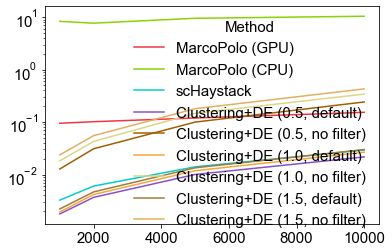

In [99]:
runtime_table_to_save.T.plot()

#plt.xscale('log')
plt.yscale('log')

In [79]:
runtime_table_to_save

,1000,2000,5000,10000
Method,,,,
MarcoPolo (GPU),5.689687,6.097405,7.168062,9.199938
MarcoPolo (CPU),499.041757,461.409407,572.051137,625.125532
scHaystack,0.194778,0.361236,0.840574,1.755947
"Clustering+DE (0.5, default)",0.106317,0.219984,0.600639,1.298830
"Clustering+DE (0.5, no filter)",0.764638,1.857881,5.985143,14.498994
"Clustering+DE (1.0, default)",0.115792,0.249552,0.708129,1.596201
"Clustering+DE (1.0, no filter)",1.093681,2.564654,8.777956,20.476006
"Clustering+DE (1.5, default)",0.132128,0.279634,0.804723,1.796685
"Clustering+DE (1.5, no filter)",1.420759,3.304057,10.792571,25.727774


In [105]:
record_list_df_simul_runtime

,Prob. of non-zero gene effect,ncells_total,num_marker,num_marker_old,num_marker_intersection,Method,AUC,ARI,runtime,runtime2,Prob. of non-zero gene effect_num,Methods,Num. of Cells,Mean Runtime (minutes),Mean Runtime (hours)
0,1e-2,1000,204,89,89,MarcoPolo (CPU),0.890319,0.000000,22470.524193,22470.524193,0.0100,MarcoPolo,1000,374.508737,6.241812
10,1e-2,1000,185,125,125,MarcoPolo (CPU),0.882532,0.000000,20346.473171,20346.473171,0.0100,MarcoPolo,1000,339.107886,5.651798
20,1e-2,1000,191,123,122,MarcoPolo (CPU),0.896580,0.000000,21503.274238,21503.274238,0.0100,MarcoPolo,1000,358.387904,5.973132
30,1e-2,1000,196,95,94,MarcoPolo (CPU),0.875020,0.000000,21375.553278,21375.553278,0.0100,MarcoPolo,1000,356.259221,5.937654
40,1e-2,1000,187,127,126,MarcoPolo (CPU),0.890189,0.000000,20425.172623,20425.172623,0.0100,MarcoPolo,1000,340.419544,5.673659
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1595,5e-4,10000,11,8,8,"Clustering+DE (1.0, no filter)",0.652726,0.043683,769.865413,769.865413,0.0005,"Clustering (1.0, no filter)",10000,12.831090,0.213852
1596,5e-4,10000,11,8,8,"Clustering+DE (1.5, no filter)",0.654558,0.047321,1150.823047,1150.823047,0.0005,"Clustering (1.5, no filter)",10000,19.180384,0.319673
1597,5e-4,10000,11,8,8,"Clustering+DE (0.5, default)",0.907198,0.039734,57.275253,57.275253,0.0005,Clustering (0.5),10000,0.954588,0.015910
1598,5e-4,10000,11,8,8,"Clustering+DE (1.0, default)",0.907076,0.043683,62.271167,62.271167,0.0005,Clustering (1.0),10000,1.037853,0.017298


In [89]:
runtime_table

runtime                              \
ncells_total                           1000          2000          5000    
Method                                                                     
Clustering+DE (0.5, default)        6.379009     13.199043     36.038343   
Clustering+DE (0.5, no filter)     45.878270    111.472866    359.108553   
Clustering+DE (1.0, default)        6.947527     14.973111     42.487763   
Clustering+DE (1.0, no filter)     65.620880    153.879259    526.677374   
Clustering+DE (1.5, default)        7.927681     16.778040     48.283357   
Clustering+DE (1.5, no filter)     85.245544    198.243438    647.554278   
HVG (DISP)                               NaN           NaN           NaN   
HVG (VST)                                NaN           NaN           NaN   
MarcoPolo (CPU)                 29942.505434  27684.564402  34323.068245   
MarcoPolo (GPU)                   341.381205    365.844324    430.083723   
scHaystack                         11.686663     21.674165     50.434424   

                                              
ncells_total                           10000  
Method                                        
Clustering+DE (0.5, default)       77.929771  
Clustering+DE (0.5, no filter)    869.939620  
Clustering+DE (1.0, default)       95.772085  
Clustering+DE (1.0, no filter)   1228.560368  
Clustering+DE (1.5, default)      107.801071  
Clustering+DE (1.5, no filter)   1543.666434  
HVG (DISP)                               NaN  
HVG (VST)                                NaN  
MarcoPolo (CPU)                 37507.531899  
MarcoPolo (GPU)                   551.996255  
scHaystack                        105.356807

0                 MarcoPolo (CPU)
10                MarcoPolo (CPU)
20                MarcoPolo (CPU)
30                MarcoPolo (CPU)
40                MarcoPolo (CPU)
                  ...            
1595    Clustering+DE (no filter)
1596    Clustering+DE (no filter)
1597      Clustering+DE (default)
1598      Clustering+DE (default)
1599      Clustering+DE (default)
Name: Method, Length: 1760, dtype: object

MarcoPolo (CPU)
MarcoPolo (GPU)
scHaystack
Clustering+DE (default)
Clustering+DE (no filter)


/home/ch6845/tools/miniconda3/envs/MarcoPolo/lib/python3.7/site-packages/ipykernel_launcher.py:59: UserWarning: FixedFormatter should only be used together with FixedLocator


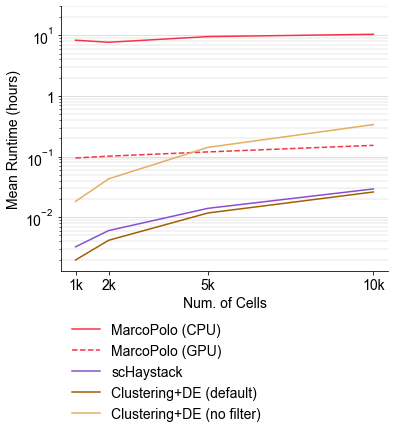

In [291]:
plt.rcParams["axes.prop_cycle"]=cycler('color',color_qual_7_3)
plt.rcParams["font.size"] = 14

fig = plt.figure(figsize=(25, 25)) 
gs=fig.add_gridspec(25,25)
#'Clustering+DE (0.5, no filter)','Clustering+DE (1.0, no filter)','Clustering+DE (1.5, no filter)'],            

fig_sub1=fig.add_subplot(gs[0:5,0:6])

for idx, method in enumerate(['MarcoPolo (CPU)',
                       'MarcoPolo (GPU)',
                       'scHaystack',
                       'Clustering+DE (default)',
                       'Clustering+DE (no filter)']):
    print(method)
    record_list_df_simul_runtime_select=record_list_df_simul_runtime[record_list_df_simul_runtime['Method']==method]
    
    record_list_df_simul_runtime_select.groupby('Num. of Cells').mean()['Mean Runtime (hours)'].plot(
        ax=fig_sub1,
        c=pd.Series(color_qual_7_3).iloc[[0,0,3,4,8]].tolist()[idx],
        label=method,
        style='--' if method=='MarcoPolo (GPU)' else '-',
    )
"""
estimator=lambda x: np.median(x),
err_style=None,
"""
fig_sub1.yaxis.grid(True,linewidth=0.4,alpha=0.6)
#leg=fig_sub1.legend(bbox_to_anchor=(0.5, -0.02, 0.5, 0.5))
leg=fig_sub1.legend(bbox_to_anchor=(0.15, -0.65, 0.5, 0.5))
#fig_sub1.get_legend()._legend_box.align = "left"
#plt.legend()
#fig_sub1.text(-0.08, 1.0, 'a', fontproperties=font_prop(bold=True,size=25), transform=fig_sub1.transAxes)

fig_sub1.set_yscale('log')
fig_sub1.set_ylabel('Mean Runtime (hours)')
fig_sub1.set_ylim([0.0013, 30])


fig_sub1.set_xticks([1000,2000,5000,10000])     
fig_sub1.set_xticklabels(['1k','2k','5k','10k'])



#fig_sub1.set_yticks(np.arange(0,1,0.1),minor=True)
fig_sub1.yaxis.grid(True,which='minor',linewidth=0.4,alpha=0.7,zorder=-10)

#fig_sub1.set_yticks(np.arange(0,1,0.1),minor=True)
fig_sub1.yaxis.grid(True,which='major',linewidth=0.8,alpha=0.5,zorder=-10)

fig_sub1.spines['right'].set_visible(False)
fig_sub1.spines['top'].set_visible(False)  


#fig_sub1.set_yticklabels(yticklabels)
#yticklabels=fig_sub1.get_yticklabels()
#print(yticklabels)
#yticklabels[4].set_text(yticklabels[4].get_text().replace('10^{0}','1'))
fig_sub1.set_yticklabels(yticklabels)
#print(fig_sub1.get_yticklabels())
fig.savefig('pub/runtime.png', bbox_inches='tight')
fig.savefig('pub/runtime.jpg', bbox_inches='tight')
fig.savefig('pub/runtime.svg', bbox_inches='tight')

In [290]:
#print(fig_sub1.get_yticklabels())
yticklabels=fig_sub1.get_yticklabels()
#print(yticklabels)
yticklabels[4].set_text(yticklabels[4].get_text().replace('10^{0}','1'))
#fig_sub1.set_yticklabels(yticklabels)

In [289]:
fig_sub1.get_yticklabels()

[Text(0, 0.0001, '$\\mathdefault{10^{-4}}$'),
 Text(0, 0.001, '$\\mathdefault{10^{-3}}$'),
 Text(0, 0.01, '$\\mathdefault{10^{-2}}$'),
 Text(0, 0.1, '$\\mathdefault{10^{-1}}$'),
 Text(0, 1.0, '$\\mathdefault{10^{0}}$'),
 Text(0, 10.0, '$\\mathdefault{10^{1}}$'),
 Text(0, 100.0, '$\\mathdefault{10^{2}}$'),
 Text(0, 1000.0, '$\\mathdefault{10^{3}}$')]

In [182]:
record_list_df_simul_runtime_select.groupby('Num. of Cells').mean().columns

Index(['ncells_total', 'num_marker', 'num_marker_old',
       'num_marker_intersection', 'AUC', 'ARI', 'runtime', 'runtime2',
       'Prob. of non-zero gene effect_num', 'Mean Runtime (hours)', 'style'],
      dtype='object')

Num. of Cells
1000     0.001968
2000     0.004162
5000     0.011742
10000    0.026065
Name: Mean Runtime (hours), dtype: float64

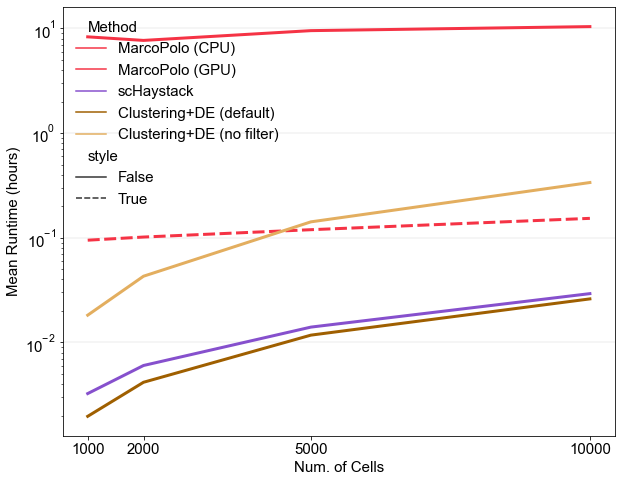

In [172]:
plt.rcParams["axes.prop_cycle"]=cycler('color',color_qual_7_3)
plt.rcParams["font.size"] = 15

fig = plt.figure(figsize=(25, 25)) 
gs=fig.add_gridspec(25,25)
#'Clustering+DE (0.5, no filter)','Clustering+DE (1.0, no filter)','Clustering+DE (1.5, no filter)'],            

fig_sub1=fig.add_subplot(gs[0:8,0:10])

record_list_df_simul_runtime['style']=record_list_df_simul_runtime["Method"].str.contains('GPU')


sns.lineplot(x='Num. of Cells',
             y='Mean Runtime (hours)',
             hue='Method',
            hue_order=['MarcoPolo (CPU)',
                       'MarcoPolo (GPU)',
                       'scHaystack',
                       'Clustering+DE (default)',
                       'Clustering+DE (no filter)'],             
            palette=pd.Series(color_qual_7_3).iloc[[0,0,3,
                                                    4,8]].tolist(),
            err_style=None,
            linewidth=3,
            style='style',
            data=record_list_df_simul_runtime,
            ax=fig_sub1)
"""
estimator=lambda x: np.median(x),
err_style=None,
"""
fig_sub1.yaxis.grid(True,linewidth=0.4,alpha=0.6)
#leg=fig_sub1.legend()
fig_sub1.get_legend()._legend_box.align = "left"
#plt.legend()
#fig_sub1.text(-0.08, 1.0, 'a', fontproperties=font_prop(bold=True,size=25), transform=fig_sub1.transAxes)

fig_sub1.set_yscale('log')

fig_sub1.set_xticks([1000,2000,5000,10000]) 


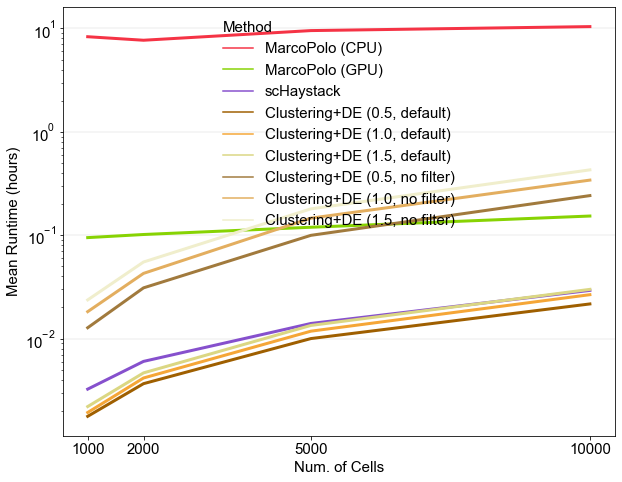

In [144]:
plt.rcParams["axes.prop_cycle"]=cycler('color',color_qual_7_3)
plt.rcParams["font.size"] = 15

fig = plt.figure(figsize=(25, 25)) 
gs=fig.add_gridspec(25,25)
#'Clustering+DE (0.5, no filter)','Clustering+DE (1.0, no filter)','Clustering+DE (1.5, no filter)'],            

fig_sub1=fig.add_subplot(gs[0:8,0:10])

sns.lineplot(x='Num. of Cells',
             y='Mean Runtime (hours)',
             hue='Method',
            hue_order=['MarcoPolo (CPU)',
                       'MarcoPolo (GPU)',
                       'scHaystack',
                       'Clustering+DE (0.5, default)',                       
                       'Clustering+DE (1.0, default)',
                       'Clustering+DE (1.5, default)',                       
                       'Clustering+DE (0.5, no filter)',
                       'Clustering+DE (1.0, no filter)',
                       'Clustering+DE (1.5, no filter)'],
            palette=pd.Series(color_qual_7_3).iloc[[0,1,
                                                    3,
                                                    4,5,6,
                                                    7,8,9]].tolist(),
            err_style=None,
            linewidth=3,
            data=record_list_df_simul_runtime,
            ax=fig_sub1)
"""
estimator=lambda x: np.median(x),
err_style=None,
"""
fig_sub1.yaxis.grid(True,linewidth=0.4,alpha=0.6)
#leg=fig_sub1.legend()
fig_sub1.get_legend()._legend_box.align = "left"
#plt.legend()
#fig_sub1.text(-0.08, 1.0, 'a', fontproperties=font_prop(bold=True,size=25), transform=fig_sub1.transAxes)

fig_sub1.set_yscale('log')

fig_sub1.set_xticks([1000,2000,5000,10000]) 


In [133]:
color_qual_7_3[[0,3,5,8]]

TypeError: list indices must be integers or slices, not list

In [103]:
runtime_table_to_save

,1000,2000,5000,10000
Method,,,,
MarcoPolo (GPU),0.094828,0.101623,0.119468,0.153332
MarcoPolo (CPU),8.317363,7.690157,9.534186,10.418759
scHaystack,0.003246,0.006021,0.014010,0.029266
"Clustering+DE (0.5, default)",0.001772,0.003666,0.010011,0.021647
"Clustering+DE (0.5, no filter)",0.012744,0.030965,0.099752,0.241650
"Clustering+DE (1.0, default)",0.001930,0.004159,0.011802,0.026603
"Clustering+DE (1.0, no filter)",0.018228,0.042744,0.146299,0.341267
"Clustering+DE (1.5, default)",0.002202,0.004661,0.013412,0.029945
"Clustering+DE (1.5, no filter)",0.023679,0.055068,0.179876,0.428796


ValueError: The following variable cannot be assigned with wide-form data: `hue`

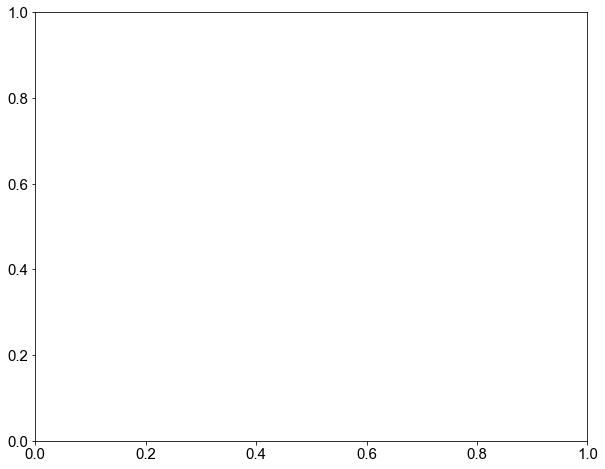

In [101]:
plt.rcParams["axes.prop_cycle"]=cycler('color',color_qual_7_3)
plt.rcParams["font.size"] = 15

fig = plt.figure(figsize=(25, 25)) 
gs=fig.add_gridspec(25,25)
#'Clustering+DE (0.5, no filter)','Clustering+DE (1.0, no filter)','Clustering+DE (1.5, no filter)'],            

fig_sub1=fig.add_subplot(gs[0:8,0:10])

sns.lineplot(x='Num. of Cells',y='Mean Runtime (minutes)',
            hue='Method',
            hue_order=['MarcoPolo (CPU)',
                       'MarcoPolo (GPU)'
                       'scHaystack',
                       'Clustering+DE (0.5, default)',
                       'Clustering+DE (0.5, no filter)',
                       'Clustering+DE (1.0, default)',
                       'Clustering+DE (1.0, no filter)',
                       'Clustering+DE (1.5, default)',
                      'Clustering+DE (1.5, no filter)'],
                      
            palette=color_qual_7_3[:8],
             
            err_style=None,
            linewidth=3,

            data=runtime_table_to_save,
            ax=fig_sub1
           )
"""
estimator=lambda x: np.median(x),
err_style=None,
"""
fig_sub1.yaxis.grid(True,linewidth=0.4,alpha=0.6)
#leg=fig_sub1.legend()
fig_sub1.get_legend()._legend_box.align = "left"
#plt.legend()
#fig_sub1.text(-0.08, 1.0, 'a', fontproperties=font_prop(bold=True,size=25), transform=fig_sub1.transAxes)

fig_sub1.set_yscale('log')

fig_sub1.set_xticks([1000,2000,5000,10000]) 


In [178]:
record_list_df_simul

,Prob. of non-zero gene effect,ncells_total,num_marker,Method,AUC,ARI,runtime,Prob. of non-zero gene effect_num,Methods,Adjusted Rand Index,num. of cells,Num. of Cells,Area under the curve
0,1e-2,1000,204,MarcoPolo,0.890319,0.000000,243.881035,0.0100,MarcoPolo,0.000000,1000,1000,0.890319
1,1e-2,1000,204,HVG (VST),0.810446,0.000000,NaN,0.0100,HVG (VST),0.000000,1000,1000,0.810446
2,1e-2,1000,204,HVG (DISP),0.871271,0.000000,NaN,0.0100,HVG (DISP),0.000000,1000,1000,0.871271
3,1e-2,1000,204,scHaystack,0.849321,0.000000,21.741828,0.0100,scHaystack,0.000000,1000,1000,0.849321
4,1e-2,1000,204,"Clustering+DE (0.5, no filter)",0.845827,0.206282,66.183386,0.0100,"Clustering (0.5, no filter)",0.206282,1000,1000,0.845827
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1578,5e-4,10000,11,"Clustering+DE (1.0, no filter)",0.652726,0.043683,854.286654,0.0005,"Clustering (1.0, no filter)",0.043683,10000,10000,0.652726
1579,5e-4,10000,11,"Clustering+DE (1.5, no filter)",0.654558,0.047321,1223.471687,0.0005,"Clustering (1.5, no filter)",0.047321,10000,10000,0.654558
1580,5e-4,10000,11,"Clustering+DE (0.5, default)",0.907198,0.039734,70.620215,0.0005,Clustering (0.5),0.039734,10000,10000,0.907198
1581,5e-4,10000,11,"Clustering+DE (1.0, default)",0.907076,0.043683,82.380275,0.0005,Clustering (1.0),0.043683,10000,10000,0.907076


Text(-0.08, 1.0, 'b')

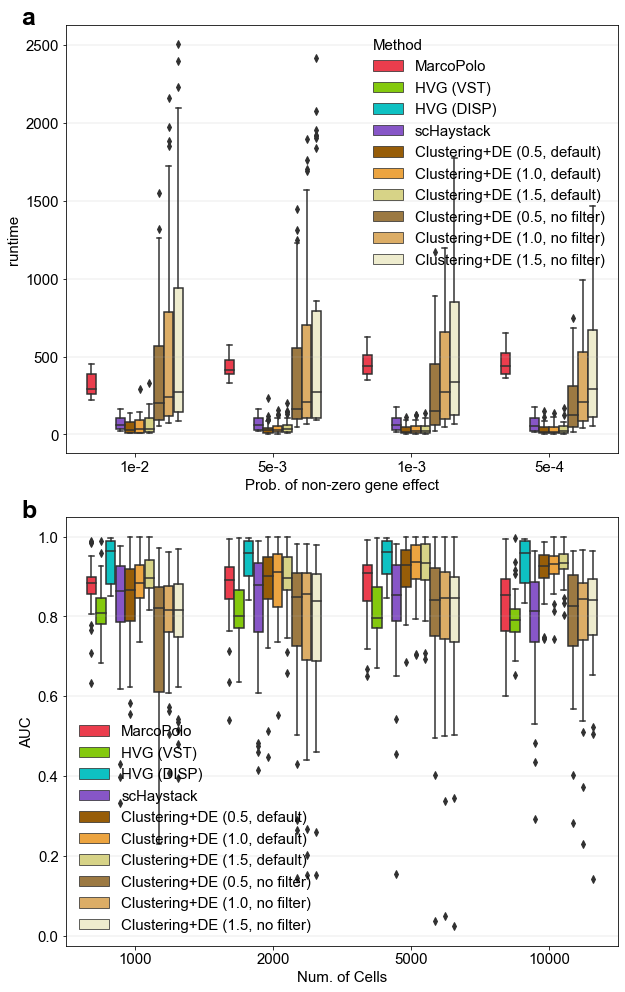

In [148]:
plt.rcParams["axes.prop_cycle"]=cycler('color',color_qual_7_3)
plt.rcParams["font.size"] = 15

fig = plt.figure(figsize=(25, 25)) 
gs=fig.add_gridspec(25,25)


fig_sub1=fig.add_subplot(gs[0:8,0:10])

sns.boxplot(x='Prob. of non-zero gene effect',y='runtime',
            order=['1e-2','5e-3','1e-3','5e-4'],
            hue='Method',
            hue_order=['MarcoPolo','HVG (VST)','HVG (DISP)','scHaystack',
                       'Clustering+DE (0.5, default)','Clustering+DE (1.0, default)','Clustering+DE (1.5, default)',
                       'Clustering+DE (0.5, no filter)','Clustering+DE (1.0, no filter)','Clustering+DE (1.5, no filter)'],            
            palette=color_qual_7_3,
            data=record_list_df_simul,
            width=0.7,
            saturation=0.9,
            ax=fig_sub1
           )
fig_sub1.yaxis.grid(True,linewidth=0.4,alpha=0.6)
#leg=fig_sub1.legend()
fig_sub1.get_legend()._legend_box.align = "left"
#plt.legend()
fig_sub1.text(-0.08, 1.0, 'a', fontproperties=font_prop(bold=True,size=25), transform=fig_sub1.transAxes)

fig_sub1=fig.add_subplot(gs[9:9+8,0:10])

sns.boxplot(x='Num. of Cells',y='AUC',
            hue='Method',
            order=[1000,2000,5000,10000],
            hue_order=['MarcoPolo','HVG (VST)','HVG (DISP)','scHaystack',
                       'Clustering+DE (0.5, default)','Clustering+DE (1.0, default)','Clustering+DE (1.5, default)',
                       'Clustering+DE (0.5, no filter)','Clustering+DE (1.0, no filter)','Clustering+DE (1.5, no filter)'],                        
            palette=color_qual_7_3,
            data=record_list_df_simul,
            width=0.7,
            saturation=0.9,
            ax=fig_sub1
           )
fig_sub1.yaxis.grid(True,linewidth=0.4,alpha=0.6)
#leg=fig_sub1.legend()
fig_sub1.get_legend()._legend_box.align = "left"
#plt.legend()
fig_sub1.legend(loc="lower left")
fig_sub1.text(-0.08, 1.0, 'b', fontproperties=font_prop(bold=True,size=25), transform=fig_sub1.transAxes)



# simul data plot

In [313]:
def plot_clustering_tsne(ax,prop,ncells=1000,legend=False):
    
    
    tsne=pd.read_csv('datasets/extract/Simul_{}_{}_1_filtered.tsne.vst.2000.tsv'.format(ncells,prop),sep='\t')
    exp_data_meta=pd.read_csv('datasets/extract/Simul_{}_{}_1_filtered.metadatacol.tsv'.format(ncells,prop),sep='\t')
    label=pd.read_csv('datasets/extract/Simul_{}_{}_1_filtered.clustering.1_0.label.tsv'.format(ncells,prop),sep='\t')
    #datasets/extract/Zhengmix4eq_filtered.clustering.1_0.label.tsv
    #print(label['seurat_clusters'].unique())
    print(exp_data_meta['phenoid'].unique())
    sns.scatterplot(x=tsne["tSNE_1"], y=tsne["tSNE_2"],
                    hue=exp_data_meta['phenoid'].rename('population'), #label['seurat_clusters'],
                    ax=ax,alpha=0.7,edgecolor="None",
                    palette=sns.color_palette("bright",9)[:len(exp_data_meta['phenoid'].unique())],
                    s=10)
    

    
    #ari_list=[adjusted_rand_score(pd.read_csv('datasets/extract/Simul_{}_{}_{}_filtered.clustering.1_0.label.tsv'.format(ncells,prop,i),sep='\t')['seurat_clusters'],
    #                    pd.read_csv('datasets/extract/Simul_{}_{}_{}_filtered.metadatacol.tsv'.format(ncells,prop,i),sep='\t')['phenoid']
    #                    ) for i in range(1,10+1)]
    #print(np.mean(ari_list))
    
    
    ax.set_title('{}'.format(prop),fontproperties=font_prop(bold=False,size=18))
    

    ax.set_xlabel('tSNE1',fontproperties=font_prop(bold=False,size=15))
    ax.set_ylabel('tSNE2',fontproperties=font_prop(bold=False,size=15))
    
    
    ax.tick_params (axis = 'x', labelsize =15)
    ax.tick_params (axis = 'y', labelsize =15)
    if legend:
        leg=ax.legend(loc='lower left',
                      title='population',
                      bbox_to_anchor=(-0.65, -0.43),
                      ncol=10,
                      handletextpad=0.2,
                      columnspacing=0.5,
                      framealpha=0.15,
                      handlelength=0.5,
                    )
        
        #,fontsize=15)
        #leg.get_frame().set_framealpha(1)
        leg.get_frame().set_edgecolor((0,0,0,0))
        #leg.get_frame().set_linewidth(0.1)
        #plt.rcParams['legend.edgecolor']='1.0'
        #plt.rcParams['legend.framealpha']=0
        pass
    else:
        
        ax.get_legend().remove()
    

[1 2 3 4 5 6 7 8 9]
[1 2 3 4 5 6 7 8 9]
[1 2 3 4 5 6 7 8 9]
[1 2 3 4 5 6 7 8 9]
[1 2 3 4 5 6 7 8 9]
[1 2 3 4 5 6 7 8 9]
[1 2 3 4 5 6 7 8 9]


No handles with labels found to put in legend.


[1 2 3 4 5 6 7 8 9]
[1 2 3 4 5 6 7 8 9]
[1 2 3 4 5 6 7 8 9]
[1 2 3 4 5 6 7 8 9]
[1 2 3 4 5 6 7 8 9]


No handles with labels found to put in legend.


[1 2 3 4 5 6 7 8 9]
[1 2 3 4 5 6 7 8 9]
[1 2 3 4 5 6 7 8 9]


No handles with labels found to put in legend.


[1 2 3 4 5 6 7 8 9]


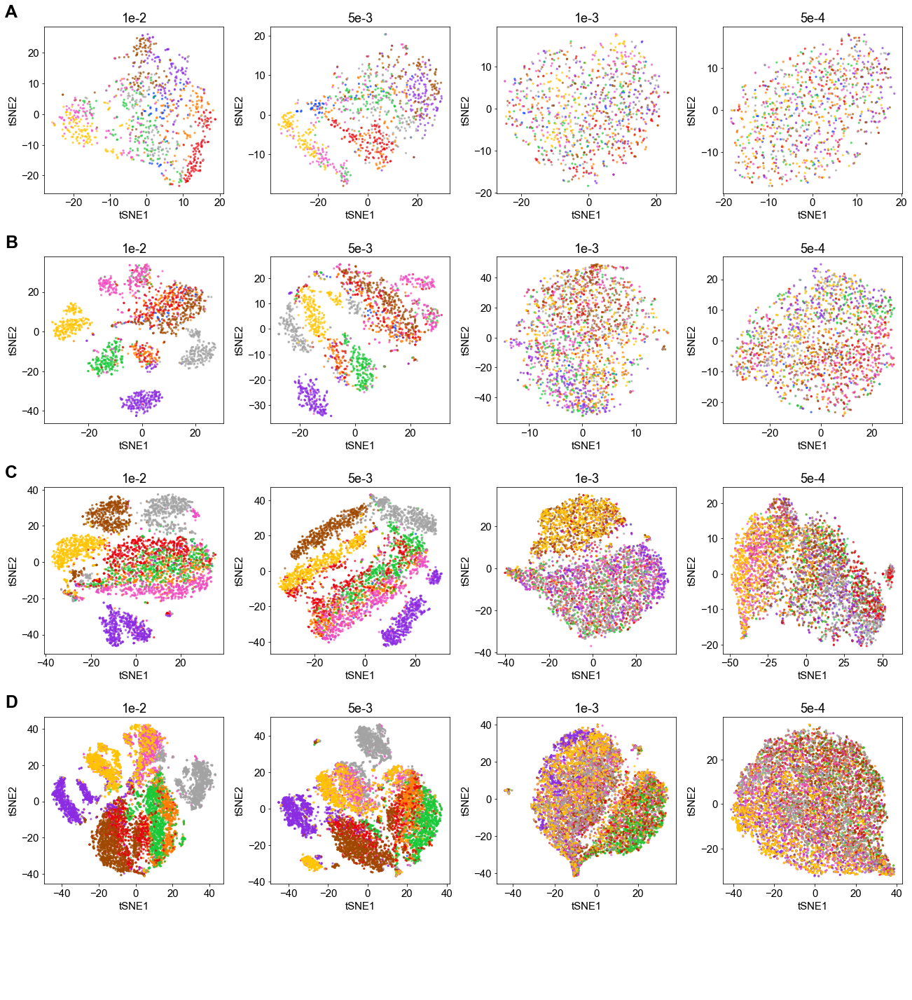

In [37]:
record_list_df_simul['Area under the curve']=record_list_df_simul['AUC']
plt.rcParams["axes.prop_cycle"]=cycler('color',color_qual_7)


fig = plt.figure(figsize=(25, 25)) 
gs=fig.add_gridspec(25,25)

plt.rcParams["font.size"] = 15

fig_sub1=fig.add_subplot(gs[0:5,0:20])
fig_sub1.axis('off')

fig_sub1_1 = fig_sub1.inset_axes([0.0,0.6,0.23,0.9])
fig_sub1_2 = fig_sub1.inset_axes([0.25+0.04,0.6,0.23,0.9])

fig_sub1_3 = fig_sub1.inset_axes([0.5+0.08,0.6,0.23,0.9])
fig_sub1_4 = fig_sub1.inset_axes([0.75+0.12,0.6,0.23,0.9])

plot_clustering_tsne(fig_sub1_1,'1e-2',1000)
plot_clustering_tsne(fig_sub1_2,'5e-3',1000)
plot_clustering_tsne(fig_sub1_3,'1e-3',1000)
plot_clustering_tsne(fig_sub1_4,'5e-4',1000,legend=False)

fig_sub1.text(-0.05, 1.55, 'A', fontproperties=font_prop(bold=True,size=25), transform=fig_sub1.transAxes)




fig_sub1=fig.add_subplot(gs[5+1:10+1,0:20])
fig_sub1.axis('off')

fig_sub1_1 = fig_sub1.inset_axes([0.0,0.6,0.23,0.9])
fig_sub1_2 = fig_sub1.inset_axes([0.25+0.04,0.6,0.23,0.9])

fig_sub1_3 = fig_sub1.inset_axes([0.5+0.08,0.6,0.23,0.9])
fig_sub1_4 = fig_sub1.inset_axes([0.75+0.12,0.6,0.23,0.9])

plot_clustering_tsne(fig_sub1_1,'1e-2',2000)
plot_clustering_tsne(fig_sub1_2,'5e-3',2000)
plot_clustering_tsne(fig_sub1_3,'1e-3',2000)
plot_clustering_tsne(fig_sub1_4,'5e-4',2000,legend=False)

fig_sub1.text(-0.05, 1.55, 'B', fontproperties=font_prop(bold=True,size=25), transform=fig_sub1.transAxes)
#fig_sub1.set_title('Simulation Datasets')

fig_sub1.legend().remove()




fig_sub1=fig.add_subplot(gs[10+2:15+2,0:20])
fig_sub1.axis('off')

fig_sub1_1 = fig_sub1.inset_axes([0.0,0.6,0.23,0.9])
fig_sub1_2 = fig_sub1.inset_axes([0.25+0.04,0.6,0.23,0.9])

fig_sub1_3 = fig_sub1.inset_axes([0.5+0.08,0.6,0.23,0.9])
fig_sub1_4 = fig_sub1.inset_axes([0.75+0.12,0.6,0.23,0.9])

plot_clustering_tsne(fig_sub1_1,'1e-2',5000)
plot_clustering_tsne(fig_sub1_2,'5e-3',5000)
plot_clustering_tsne(fig_sub1_3,'1e-3',5000)
plot_clustering_tsne(fig_sub1_4,'5e-4',5000,legend=False)

fig_sub1.text(-0.05, 1.55, 'C', fontproperties=font_prop(bold=True,size=25), transform=fig_sub1.transAxes)
#fig_sub1.set_title('Simulation Datasets')

fig_sub1.legend().remove()





fig_sub1=fig.add_subplot(gs[15+3:20+3,0:20])
fig_sub1.axis('off')

fig_sub1_1 = fig_sub1.inset_axes([0.0,0.6,0.23,0.9])
fig_sub1_2 = fig_sub1.inset_axes([0.25+0.04,0.6,0.23,0.9])

fig_sub1_3 = fig_sub1.inset_axes([0.5+0.08,0.6,0.23,0.9])
fig_sub1_4 = fig_sub1.inset_axes([0.75+0.12,0.6,0.23,0.9])

plot_clustering_tsne(fig_sub1_1,'1e-2',10000)
plot_clustering_tsne(fig_sub1_2,'5e-3',10000)
plot_clustering_tsne(fig_sub1_3,'1e-3',10000)
plot_clustering_tsne(fig_sub1_4,'5e-4',10000,legend=False)

fig_sub1.text(-0.05, 1.55, 'D', fontproperties=font_prop(bold=True,size=25), transform=fig_sub1.transAxes)
#fig_sub1.set_title('Simulation Datasets')

fig_sub1.legend().remove()

In [38]:
fig.savefig('pub/simul_tsne_all.png', bbox_inches='tight')
fig.savefig('pub/simul_tsne_all.jpg', bbox_inches='tight')
fig.savefig('pub/simul_tsne_all.svg', bbox_inches='tight')

# distribution

In [ ]:
def plot_clustering_tsne(ax,prop,ncells=1000,legend=False):
    
    
    tsne=pd.read_csv('datasets/extract/Simul_{}_{}_1_filtered.tsne.vst.2000.tsv'.format(ncells,prop),sep='\t')
    exp_data_meta=pd.read_csv('datasets/extract/Simul_{}_{}_1_filtered.metadatacol.tsv'.format(ncells,prop),sep='\t')
    label=pd.read_csv('datasets/extract/Simul_{}_{}_1_filtered.clustering.1_0.label.tsv'.format(ncells,prop),sep='\t')
    #datasets/extract/Zhengmix4eq_filtered.clustering.1_0.label.tsv
    #print(label['seurat_clusters'].unique())
    print(exp_data_meta['phenoid'].unique())
    sns.scatterplot(x=tsne["tSNE_1"], y=tsne["tSNE_2"],
                    hue=exp_data_meta['phenoid'].rename('population'), #label['seurat_clusters'],
                    ax=ax,alpha=0.7,edgecolor="None",
                    palette=sns.color_palette("bright",9)[:len(exp_data_meta['phenoid'].unique())],
                    s=10)
    

    
    #ari_list=[adjusted_rand_score(pd.read_csv('datasets/extract/Simul_{}_{}_{}_filtered.clustering.1_0.label.tsv'.format(ncells,prop,i),sep='\t')['seurat_clusters'],
    #                    pd.read_csv('datasets/extract/Simul_{}_{}_{}_filtered.metadatacol.tsv'.format(ncells,prop,i),sep='\t')['phenoid']
    #                    ) for i in range(1,10+1)]
    #print(np.mean(ari_list))
    
    
    ax.set_title('{}'.format(prop),fontproperties=font_prop(bold=False,size=18))
    

    ax.set_xlabel('tSNE1',fontproperties=font_prop(bold=False,size=15))
    ax.set_ylabel('tSNE2',fontproperties=font_prop(bold=False,size=15))
    
    
    ax.tick_params (axis = 'x', labelsize =15)
    ax.tick_params (axis = 'y', labelsize =15)
    if legend:
        leg=ax.legend(loc='lower left',
                      title='population',
                      bbox_to_anchor=(-0.65, -0.43),
                      ncol=10,
                      handletextpad=0.2,
                      columnspacing=0.5,
                      framealpha=0.15,
                      handlelength=0.5,
                    )
        
        #,fontsize=15)
        #leg.get_frame().set_framealpha(1)
        leg.get_frame().set_edgecolor((0,0,0,0))
        #leg.get_frame().set_linewidth(0.1)
        #plt.rcParams['legend.edgecolor']='1.0'
        #plt.rcParams['legend.framealpha']=0
        pass
    else:
        
        ax.get_legend().remove()
    

In [100]:
print(1)

1


In [ ]:
#record_list=[]#pd.DataFrame(columns=[1],index=['1e-2','5e-3','1e-3','5e-4','1e-4'])
for ncells_total in [1000,2000,5000,10000]:
    for prop in ['1e-2','5e-3','1e-3','5e-4'][::]:
        for i in range(1,10+1):
            
            dataset_name='Simul_{}_{}_{}_filtered'.format(ncells_total,prop,i)
            exp_data=mmread('datasets/extract/{}.data.counts.mm'.format(dataset_name)).toarray().astype(float)
            exp_data_s=pd.read_csv('datasets/extract/{}.size_factor.tsv'.format(dataset_name),sep='\t',header=None)[0].values.astype(float)
            with open('datasets/extract/{}.data.col'.format(dataset_name),'r') as f: exp_data_col=[i.strip().strip('"') for i in f.read().split()]
            with open('datasets/extract/{}.data.row'.format(dataset_name),'r') as f: exp_data_row=[i.strip().strip('"') for i in f.read().split()]
            assert exp_data.shape==(len(exp_data_row),len(exp_data_col))
            assert len(set(exp_data_row))==len(exp_data_row)
            assert len(set(exp_data_col))==len(exp_data_col)     
            exp_data_meta=pd.read_csv('datasets/extract/{}.metadatacol.tsv'.format(dataset_name),sep='\t')
            
            marker=load_marker('{}'.format(dataset_name),method='EVF')
            
            vmr_marker=(exp_data_marker.var(axis=1)/exp_data_marker.mean(axis=1))
            exp_data_nonmarker=exp_data[[exp_data_row.index(m) for m in set(exp_data_row).difference(marker)]]

vmr_marker=(exp_data_marker.var(axis=1)/exp_data_marker.mean(axis=1)).mean()
vmr_nonmarker=(exp_data_nonmarker.var(axis=1)/exp_data_nonmarker.mean(axis=1)).mean()
vmr_all=(exp_data.var(axis=1)/exp_data.mean(axis=1)).mean()            
            

In [ ]:
            
            a=pd.read_csv("datasets/extract/{}.maxdiff.500.2.tsv".format(dataset_name),sep='\t')
            b=pd.read_csv("datasets/extract/{}.markerrho.500.2.tsv".format(dataset_name),sep='\t')

            with open('datasets/extract/{}.data.row'.format(dataset_name),'r') as f: exp_data_row=[i.strip().strip('"') for i in f.read().split()]
            with open('datasets/extract/{}.data.col'.format(dataset_name),'r') as f: exp_data_col=[i.strip().strip('"') for i in f.read().split()]    

            print(ncells_total,prop,i,
                  a.set_index("Unnamed: 0").loc[b.columns[1:].astype(int)]['0'].sort_values().iloc[0],
                 len(a.set_index("Unnamed: 0").loc[b.columns[1:].astype(int)])
                 )

In [339]:
#prop='1e-2';
prop='5e-4';
ncells=10000
idx=1
is_marker=True

In [340]:
dataset_name='Simul_{}_{}_1_filtered'.format(ncells,prop)

tsne=pd.read_csv('datasets/extract/{}.tsne.vst.2000.tsv'.format(dataset_name),sep='\t')
exp_data=mmread('datasets/extract/{}.data.counts.mm'.format(dataset_name)).toarray().astype(float)
exp_data_s=pd.read_csv('datasets/extract/{}.size_factor.tsv'.format(dataset_name),sep='\t',header=None)[0].values.astype(float)
with open('datasets/extract/{}.data.col'.format(dataset_name),'r') as f: exp_data_col=[i.strip().strip('"') for i in f.read().split()]
with open('datasets/extract/{}.data.row'.format(dataset_name),'r') as f: exp_data_row=[i.strip().strip('"') for i in f.read().split()]
assert exp_data.shape==(len(exp_data_row),len(exp_data_col))
assert len(set(exp_data_row))==len(exp_data_row)
assert len(set(exp_data_col))==len(exp_data_col)
exp_data_meta=pd.read_csv('datasets/extract/{}.metadatacol.tsv'.format(dataset_name),sep='\t')
#label=pd.read_csv('datasets/extract/Simul_{}_{}_1_filtered.clustering.1_0.label.tsv'.format(ncells,prop),sep='\t')

bin_max=1e+6

marker=load_marker('{}'.format(dataset_name),method='EVF')

lfc=4
num_genes=500
markerrho=pd.read_csv('datasets/extract/{}.markerrho.{}.{}.tsv'.format(dataset_name,num_genes,lfc),index_col=0,sep='\t')
#marker_old=load_marker(dataset_name,method='truelabel_maxdiff', num_genes=500, lfc=2)  

In [342]:
markerrho

,3677,3472,2111
1,1,1,1
2,1,1,1
3,1,1,1
4,1,1,1
5,1,0,0
6,1,1,1
7,1,1,1
8,0,1,1
9,1,1,1


In [296]:
exp_data_marker=exp_data[[exp_data_row.index(m) for m in markerrho.columns]]

In [297]:
vmr_marker=(exp_data_marker.var(axis=1)/exp_data_marker.mean(axis=1))

In [328]:
for phenoid in exp_data_meta['phenoid'].unique():
    exp_data_select=exp_data[[exp_data_row.index('4735')]]
    #print(exp_data_select.shape)
    exp_data_select_phenoid=exp_data_select[:,(exp_data_meta['phenoid']==phenoid)]
    print(phenoid,\
          np.var(exp_data_select_phenoid)/np.mean(exp_data_select_phenoid))

1 19.752271442035816
2 23.704987725376984
3 29.690556168885873
4 45.17250661640418
5 26.155245978150962
6 51.324081822526395
7 4.639094437026142
8 8.196257997391873
9 7.1531533597343335


In [333]:
for phenoid in exp_data_meta['phenoid'].unique():
    exp_data_select=exp_data[[exp_data_row.index('1879')]]
    #print(exp_data_select.shape)
    exp_data_select_phenoid=exp_data_select[:,(exp_data_meta['phenoid']==phenoid)]
    print(phenoid,\
          np.var(exp_data_select_phenoid)/np.mean(exp_data_select_phenoid))

1 2042.8410625946015
2 1945.9999380551556
3 1247.2084699155866
4 476.24562403658894
5 217.1458065968475
6 205.4144346753104
7 284.1537913104897
8 1625.058122712864
9 211.853979550664


In [335]:
'1879' in markerrho.columns

False

In [331]:
exp_data_row

['2910',
 '4643',
 '1879',
 '4443',
 '3757',
 '887',
 '3722',
 '3107',
 '3125',
 '3090',
 '2238',
 '1741',
 '3909',
 '1393',
 '3630',
 '4691',
 '215',
 '4525',
 '2895',
 '2253',
 '3232',
 '4407',
 '3045',
 '1556',
 '115',
 '3025',
 '82',
 '3376',
 '2900',
 '2536',
 '4159',
 '2559',
 '2954',
 '1938',
 '4508',
 '4350',
 '2283',
 '1366',
 '3881',
 '2069',
 '4644',
 '4851',
 '4088',
 '1560',
 '3172',
 '1369',
 '3981',
 '1589',
 '2434',
 '4355',
 '67',
 '2728',
 '461',
 '327',
 '2620',
 '3509',
 '619',
 '671',
 '4361',
 '4239',
 '911',
 '735',
 '1422',
 '1967',
 '4174',
 '3426',
 '1437',
 '1246',
 '223',
 '4420',
 '4927',
 '3934',
 '1398',
 '3415',
 '4108',
 '4531',
 '96',
 '1982',
 '2842',
 '1939',
 '125',
 '4735',
 '73',
 '4636',
 '4503',
 '4742',
 '392',
 '1249',
 '1166',
 '3270',
 '2705',
 '3251',
 '4765',
 '3573',
 '1280',
 '132',
 '3098',
 '2887',
 '2813',
 '2266',
 '3252',
 '1331',
 '4899',
 '2679',
 '2972',
 '1638',
 '2641',
 '3753',
 '4344',
 '3066',
 '2222',
 '2233',
 '678',
 '482

In [321]:
np.var(exp_data_select_phenoid)/np.mean(exp_data_select_phenoid)

(1, 50)

In [307]:
markerrho

,2910,4735,4636,4503,3252,4899,678,2788,4808,1171,...,2582,267,317,2064,2523,536,110,285,3307,942
1,1,1,1,1,1,1,1,1,1,1,...,1,1,1,1,1,1,1,0,1,0
2,1,1,1,1,1,1,1,1,1,1,...,1,1,1,1,1,1,1,0,1,0
3,1,1,1,1,1,1,1,1,1,1,...,1,1,1,1,1,1,1,1,1,0
4,1,1,1,1,1,1,1,1,1,1,...,1,1,1,1,1,1,1,1,1,0
5,1,1,0,1,1,1,0,1,0,0,...,1,0,0,1,1,0,0,1,0,0
6,1,1,1,1,1,1,1,1,1,1,...,1,1,1,1,1,1,1,1,1,0
7,1,1,1,1,1,1,1,1,1,1,...,1,1,1,1,1,1,1,1,1,0
8,0,0,1,0,0,0,1,0,1,1,...,0,1,1,0,0,1,1,1,1,1
9,1,1,1,1,1,1,1,1,1,1,...,1,1,1,1,1,1,1,1,1,0


In [ ]:
exp_data_nonmarker=exp_data[[exp_data_row.index(m) for m in set(exp_data_row).difference(marker)]]

vmr_marker=(exp_data_marker.var(axis=1)/exp_data_marker.mean(axis=1)).mean()
vmr_nonmarker=(exp_data_nonmarker.var(axis=1)/exp_data_nonmarker.mean(axis=1)).mean()
vmr_all=(exp_data.var(axis=1)/exp_data.mean(axis=1)).mean()

(array([36.,  7., 10.,  4.,  1.,  1.,  2.,  0.,  1.,  2.]),
 array([  2.57733505,  20.8824763 ,  39.18761754,  57.49275879,
         75.79790004,  94.10304129, 112.40818254, 130.71332379,
        149.01846504, 167.32360629, 185.62874754]),
 <BarContainer object of 10 artists>)

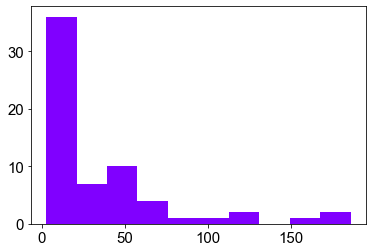

In [327]:
plt.hist(vmr_marker[1:])

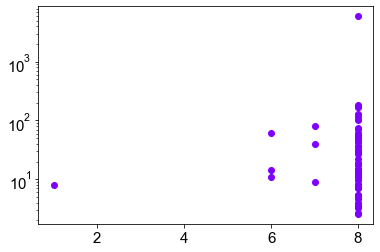

In [303]:
fig=plt.figure()
ax=fig.add_subplot()

ax.scatter(markerrho.sum(axis=0), vmr_marker)
ax.set_yscale('log')

In [305]:
vmr_marker

array([5.92912193e+03, 7.53350621e+01, 1.16203940e+02, 6.15851199e+01,
       3.72017160e+01, 2.18330439e+01, 4.48086636e+01, 1.08946471e+01,
       1.51118070e+01, 3.61979885e+01, 7.09606147e+00, 4.29701223e+01,
       4.95338248e+01, 1.85628748e+02, 7.78580927e+00, 1.72507315e+02,
       1.66638088e+02, 4.04599583e+01, 3.74799101e+00, 1.07711344e+01,
       1.82841386e+01, 1.71723292e+01, 1.03697249e+02, 3.11343323e+01,
       1.29602030e+01, 1.29933016e+02, 9.63166209e+00, 8.26773057e+00,
       5.45448236e+01, 4.98569533e+01, 1.20272615e+01, 7.69036679e+00,
       7.27446917e+01, 2.89699300e+01, 5.69118691e+01, 5.30010577e+01,
       5.44404091e+00, 3.92907057e+00, 8.08568524e+01, 3.29659203e+00,
       3.57641039e+00, 3.58973397e+00, 1.43657515e+01, 1.85800051e+01,
       1.24524270e+01, 1.48339862e+01, 1.40901011e+01, 1.37861203e+01,
       2.69713793e+00, 1.79784987e+01, 6.03101182e+01, 2.57733505e+00,
       1.02669729e+01, 8.11201429e+00, 2.70503285e+01, 5.64459493e+01,
      

In [277]:
markerrho.sum(axis=0).value_counts()

8    58
6     3
7     3
1     1
dtype: int64

In [280]:
markerrho.sum(axis=0).value_counts()

8    33
7     9
6     3
1     1
dtype: int64

In [283]:
markerrho.sum(axis=0).value_counts()

8    8
7    3
dtype: int64

In [286]:
markerrho.sum(axis=0).value_counts()

8    3
dtype: int64

In [338]:
markerrho

,3677,3472,2111
1,1,1,1
2,1,1,1
3,1,1,1
4,1,1,1
5,1,0,0
6,1,1,1
7,1,1,1
8,0,1,1
9,1,1,1


In [158]:
markerrho.sum(axis=0).mean()/markerrho.shape[0],\
(pd.concat([markerrho.sum(axis=0),markerrho.shape[0]-markerrho.sum(axis=0)],axis=1).min(axis=1)).mean()/markerrho.shape[0]

(0.8615384615384616, 0.1264957264957265)

In [161]:
markerrho.sum(axis=0).mean()/markerrho.shape[0],\
(pd.concat([markerrho.sum(axis=0),markerrho.shape[0]-markerrho.sum(axis=0)],axis=1).min(axis=1)).mean()/markerrho.shape[0]

(0.8888888888888888, 0.1111111111111111)

In [141]:
markerrho.shape[0]

9

0.1473429951690821

In [79]:
tsne=pd.read_csv('datasets/extract/Simul_{}_{}_1_filtered.tsne.vst.2000.tsv'.format(ncells,prop),sep='\t')
exp_data=mmread('datasets/extract/Simul_{}_{}_1_filtered.data.counts.mm'.format(ncells,prop)).toarray().astype(float)
exp_data_s=pd.read_csv('datasets/extract/Simul_{}_{}_1_filtered.size_factor.tsv'.format(ncells,prop),sep='\t',header=None)[0].values.astype(float)
with open('datasets/extract/Simul_{}_{}_1_filtered.data.col'.format(ncells,prop),'r') as f: exp_data_col=[i.strip().strip('"') for i in f.read().split()]
with open('datasets/extract/Simul_{}_{}_1_filtered.data.row'.format(ncells,prop),'r') as f: exp_data_row=[i.strip().strip('"') for i in f.read().split()]
assert exp_data.shape==(len(exp_data_row),len(exp_data_col))
assert len(set(exp_data_row))==len(exp_data_row)
assert len(set(exp_data_col))==len(exp_data_col)
exp_data_meta=pd.read_csv('datasets/extract/Simul_{}_{}_1_filtered.metadatacol.tsv'.format(ncells,prop),sep='\t')
#label=pd.read_csv('datasets/extract/Simul_{}_{}_1_filtered.clustering.1_0.label.tsv'.format(ncells,prop),sep='\t')

bin_max=1e+6

marker=load_marker('Simul_{}_{}_1_filtered'.format(ncells,prop),method='EVF')

if is_marker:
    gene_name=marker[idx]
else:
    gene_name=list(set(exp_data_row).difference(marker))[idx]

#print(marker)
#print(exp_data_row)

#.value_counts().sort_values()[1:].index:
for idx,phenoid in enumerate(exp_data_meta['phenoid'].unique()):
    #data_on=(exp_data[exp_data_row.index(gene_name)]/exp_data_s)[gamma_argmax_list[exp_data_row.index(gene_name)]==0]    
    #data_on=(exp_data[exp_data_row.index(gene_name)]/exp_data_s)
    data_on=(exp_data[exp_data_row.index(gene_name)])
    data_on_select=data_on[exp_data_meta['phenoid']==phenoid]
    break

In [80]:
prop='1e-2';
ncells=10000
idx=1
is_marker=True

In [81]:
tsne=pd.read_csv('datasets/extract/Simul_{}_{}_1_filtered.tsne.vst.2000.tsv'.format(ncells,prop),sep='\t')
exp_data=mmread('datasets/extract/Simul_{}_{}_1_filtered.data.counts.mm'.format(ncells,prop)).toarray().astype(float)
exp_data_s=pd.read_csv('datasets/extract/Simul_{}_{}_1_filtered.size_factor.tsv'.format(ncells,prop),sep='\t',header=None)[0].values.astype(float)
with open('datasets/extract/Simul_{}_{}_1_filtered.data.col'.format(ncells,prop),'r') as f: exp_data_col=[i.strip().strip('"') for i in f.read().split()]
with open('datasets/extract/Simul_{}_{}_1_filtered.data.row'.format(ncells,prop),'r') as f: exp_data_row=[i.strip().strip('"') for i in f.read().split()]
assert exp_data.shape==(len(exp_data_row),len(exp_data_col))
assert len(set(exp_data_row))==len(exp_data_row)
assert len(set(exp_data_col))==len(exp_data_col)
exp_data_meta=pd.read_csv('datasets/extract/Simul_{}_{}_1_filtered.metadatacol.tsv'.format(ncells,prop),sep='\t')
#label=pd.read_csv('datasets/extract/Simul_{}_{}_1_filtered.clustering.1_0.label.tsv'.format(ncells,prop),sep='\t')

bin_max=1e+6

marker=load_marker('Simul_{}_{}_1_filtered'.format(ncells,prop),method='EVF')

if is_marker:
    gene_name=marker[idx]
else:
    gene_name=list(set(exp_data_row).difference(marker))[idx]

#print(marker)
#print(exp_data_row)

#.value_counts().sort_values()[1:].index:
for idx,phenoid in enumerate(exp_data_meta['phenoid'].unique()):
    #data_on=(exp_data[exp_data_row.index(gene_name)]/exp_data_s)[gamma_argmax_list[exp_data_row.index(gene_name)]==0]    
    #data_on=(exp_data[exp_data_row.index(gene_name)]/exp_data_s)
    data_on=(exp_data[exp_data_row.index(gene_name)])
    data_on_select2=data_on[exp_data_meta['phenoid']==phenoid]
    break

In [91]:
prop='1e-2';
ncells=10000
idx=4
is_marker=False

In [92]:
tsne=pd.read_csv('datasets/extract/Simul_{}_{}_1_filtered.tsne.vst.2000.tsv'.format(ncells,prop),sep='\t')
exp_data=mmread('datasets/extract/Simul_{}_{}_1_filtered.data.counts.mm'.format(ncells,prop)).toarray().astype(float)
exp_data_s=pd.read_csv('datasets/extract/Simul_{}_{}_1_filtered.size_factor.tsv'.format(ncells,prop),sep='\t',header=None)[0].values.astype(float)
with open('datasets/extract/Simul_{}_{}_1_filtered.data.col'.format(ncells,prop),'r') as f: exp_data_col=[i.strip().strip('"') for i in f.read().split()]
with open('datasets/extract/Simul_{}_{}_1_filtered.data.row'.format(ncells,prop),'r') as f: exp_data_row=[i.strip().strip('"') for i in f.read().split()]
assert exp_data.shape==(len(exp_data_row),len(exp_data_col))
assert len(set(exp_data_row))==len(exp_data_row)
assert len(set(exp_data_col))==len(exp_data_col)
exp_data_meta=pd.read_csv('datasets/extract/Simul_{}_{}_1_filtered.metadatacol.tsv'.format(ncells,prop),sep='\t')
#label=pd.read_csv('datasets/extract/Simul_{}_{}_1_filtered.clustering.1_0.label.tsv'.format(ncells,prop),sep='\t')

bin_max=1e+6

marker=load_marker('Simul_{}_{}_1_filtered'.format(ncells,prop),method='EVF')

if is_marker:
    gene_name=marker[idx]
else:
    gene_name=list(set(exp_data_row).difference(marker))[idx]

#print(marker)
#print(exp_data_row)

#.value_counts().sort_values()[1:].index:
for idx,phenoid in enumerate(exp_data_meta['phenoid'].unique()):
    #data_on=(exp_data[exp_data_row.index(gene_name)]/exp_data_s)[gamma_argmax_list[exp_data_row.index(gene_name)]==0]    
    #data_on=(exp_data[exp_data_row.index(gene_name)]/exp_data_s)
    data_on=(exp_data[exp_data_row.index(gene_name)])
    data_on_select3=data_on[exp_data_meta['phenoid']==phenoid]
    break

In [84]:
bins_=np.arange(0, 150, 2)

(73.22693489392832, 27.34)

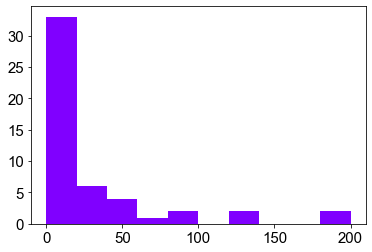

In [94]:
plt.hist(data_on_select)#, bins=bins_)
np.var(data_on_select)/np.mean(data_on_select),np.mean(data_on_select)

(33.839215686274514, 10.2)

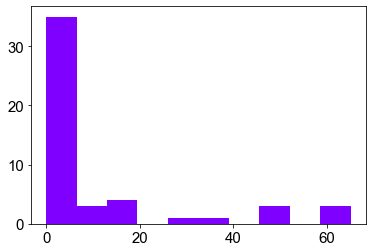

In [96]:
plt.hist(data_on_select2)#, bins=bins_)
np.var(data_on_select2)/np.mean(data_on_select2),np.mean(data_on_select2)

(1.842222222222222, 2.88)

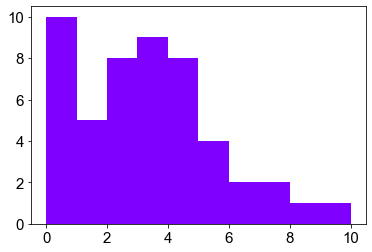

In [98]:
plt.hist(data_on_select3)#, bins=bins_)
np.var(data_on_select3)/np.mean(data_on_select3),np.mean(data_on_select3)

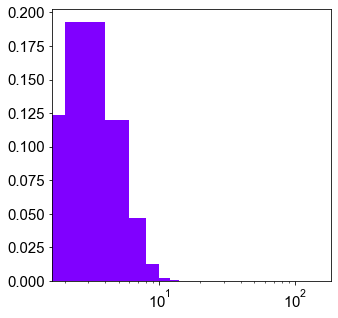

In [55]:
fig = plt.figure(figsize=(5, 5)) 
ax=fig.add_subplot()

plt.rcParams["font.size"] = 15

bins=np.arange(0, 150, 2)
ax.hist(data_on, bins=bins, density=True)
#ax.set_xscale('log')
ax.set_xscale('log')
#ax.hist(data_on)

In [242]:
prop='1e-2'

In [409]:
ncells

10000

In [412]:
result_temp=[]
for ncells in [1000,2000,5000,10000]:
    for prop in ['1e-2','5e-3','1e-3','5e-4']:
        for idx in range(1,10+1):
            dataset_name='Simul_{}_{}_{}_filtered'.format(ncells,prop,idx)
            print(dataset_name)
            
            tsne=pd.read_csv('datasets/extract/{}.tsne.vst.2000.tsv'.format(dataset_name),sep='\t')
            exp_data=mmread('datasets/extract/{}.data.counts.mm'.format(dataset_name)).toarray().astype(float)
            exp_data_s=pd.read_csv('datasets/extract/{}.size_factor.tsv'.format(dataset_name),sep='\t',header=None)[0].values.astype(float)
            with open('datasets/extract/{}.data.col'.format(dataset_name),'r') as f: exp_data_col=[i.strip().strip('"') for i in f.read().split()]
            with open('datasets/extract/{}.data.row'.format(dataset_name),'r') as f: exp_data_row=[i.strip().strip('"') for i in f.read().split()]
            assert exp_data.shape==(len(exp_data_row),len(exp_data_col))
            assert len(set(exp_data_row))==len(exp_data_row)
            assert len(set(exp_data_col))==len(exp_data_col)
            exp_data_meta=pd.read_csv('datasets/extract/{}.metadatacol.tsv'.format(dataset_name),sep='\t')
            #label=pd.read_csv('datasets/extract/Simul_{}_{}_1_filtered.clustering.1_0.label.tsv'.format(ncells,prop),sep='\t')

            bin_max=1e+6

            marker=load_marker(dataset_name, method='EVF')
            #data_on=(exp_data[exp_data_row.index(gene_name)]) 
            exp_data_marker=exp_data[[exp_data_row.index(m) for m in set(exp_data_row).intersection(marker)]]
            exp_data_nonmarker=exp_data[[exp_data_row.index(m) for m in set(exp_data_row).difference(marker)]]

            vmr_marker=(exp_data_marker.var(axis=1)/exp_data_marker.mean(axis=1)).mean()
            vmr_nonmarker=(exp_data_nonmarker.var(axis=1)/exp_data_nonmarker.mean(axis=1)).mean()
            vmr_all=(exp_data.var(axis=1)/exp_data.mean(axis=1)).mean()
            result_temp.append([ncells, prop, idx, vmr_marker, vmr_nonmarker, vmr_all])

Simul_1000_1e-2_1_filtered
Simul_1000_1e-2_2_filtered
Simul_1000_1e-2_3_filtered
Simul_1000_1e-2_4_filtered
Simul_1000_1e-2_5_filtered
Simul_1000_1e-2_6_filtered
Simul_1000_1e-2_7_filtered
Simul_1000_1e-2_8_filtered
Simul_1000_1e-2_9_filtered
Simul_1000_1e-2_10_filtered
Simul_1000_5e-3_1_filtered
Simul_1000_5e-3_2_filtered
Simul_1000_5e-3_3_filtered
Simul_1000_5e-3_4_filtered
Simul_1000_5e-3_5_filtered
Simul_1000_5e-3_6_filtered
Simul_1000_5e-3_7_filtered
Simul_1000_5e-3_8_filtered
Simul_1000_5e-3_9_filtered
Simul_1000_5e-3_10_filtered
Simul_1000_1e-3_1_filtered
Simul_1000_1e-3_2_filtered
Simul_1000_1e-3_3_filtered
Simul_1000_1e-3_4_filtered
Simul_1000_1e-3_5_filtered
Simul_1000_1e-3_6_filtered
Simul_1000_1e-3_7_filtered
Simul_1000_1e-3_8_filtered
Simul_1000_1e-3_9_filtered
Simul_1000_1e-3_10_filtered
Simul_1000_5e-4_1_filtered
Simul_1000_5e-4_2_filtered
Simul_1000_5e-4_3_filtered
Simul_1000_5e-4_4_filtered
Simul_1000_5e-4_5_filtered
Simul_1000_5e-4_6_filtered
Simul_1000_5e-4_7_filtere

In [413]:
result_vmr_df=pd.DataFrame(result_temp, columns=['Num. of Cells', 'prop', 'idx', 'variance-to-mean ratio (markers)', 'variance-to-mean ratio (non-markers)', 'variance-to-mean ratio (all)'])
result_vmr_df['variance-to-mean ratio (markers)/variance-to-mean ratio (non-markers)']=result_vmr_df['variance-to-mean ratio (markers)']/result_vmr_df['variance-to-mean ratio (non-markers)']

In [408]:
result_vmr_df.groupby('prop').mean().sort_values('prop')\
[["variance-to-mean ratio (markers)", "variance-to-mean ratio (non-markers)", "variance-to-mean ratio (markers)/variance-to-mean ratio (non-markers)"]]\
.to_csv("pub/vmr_simul.csv")

In [424]:
result_vmr_df['Prop']=result_vmr_df['prop'].astype(float)

In [426]:
result_vmr_df.groupby(['Num. of Cells','Prop']).mean()\
[["variance-to-mean ratio (markers)", "variance-to-mean ratio (non-markers)", "variance-to-mean ratio (markers)/variance-to-mean ratio (non-markers)"]]\
.to_csv("pub/vmr_simul.csv")

In [417]:
result_vmr_df.groupby(['prop','Num. of Cells']).mean().loc[['1e-2','5e-3','1e-3','5e-4']]\
[["variance-to-mean ratio (markers)", "variance-to-mean ratio (non-markers)", "variance-to-mean ratio (markers)/variance-to-mean ratio (non-markers)"]]\
.to_csv("pub/vmr_simul.csv")

In [261]:
pd.read_csv('datasets/extract/{}.nDiffEVF.tsv'.format(dataset_name),sep='\t',index_col=0)

,0
1,
2,0
3,0
4,0
5,0
6,0
...,...
4996,0
4997,0
4998,0


In [262]:
a=pd.read_csv('datasets/extract/{}.nDiffEVF.tsv'.format(dataset_name),sep='\t',index_col=0)

In [266]:
a['0'].value_counts()

0    4985
1      14
Name: 0, dtype: int64

In [260]:
result_temp_df

,prop,idx,vmr_marker,vmr_nonmarker,vmr_all,marker_nonmarker_ratio
0,1e-2,1,69.964525,6.977004,15.375340,10.027875
1,1e-2,2,22.435658,8.534022,10.257825,2.628967
2,1e-2,3,62.049706,5.918656,13.215692,10.483749
3,1e-2,4,38.221342,6.181741,10.432328,6.182941
4,1e-2,5,27.652851,8.579480,10.906432,3.223138
5,1e-2,6,42.260737,6.634148,11.218102,6.370183
6,1e-2,7,42.078056,6.646608,10.992865,6.330757
7,1e-2,8,31.105436,7.557811,11.121351,4.115667
8,1e-2,9,28.461280,5.878800,9.130678,4.841341
9,1e-2,10,31.752071,7.845312,10.682247,4.047267


In [251]:
prop='5e-4'

In [238]:
dataset_name='Simul_{}_{}_{}_filtered'.format(ncells,prop,idx)

tsne=pd.read_csv('datasets/extract/{}.tsne.vst.2000.tsv'.format(dataset_name),sep='\t')
exp_data=mmread('datasets/extract/{}.data.counts.mm'.format(dataset_name)).toarray().astype(float)
exp_data_s=pd.read_csv('datasets/extract/{}.size_factor.tsv'.format(dataset_name),sep='\t',header=None)[0].values.astype(float)
with open('datasets/extract/{}.data.col'.format(dataset_name),'r') as f: exp_data_col=[i.strip().strip('"') for i in f.read().split()]
with open('datasets/extract/{}.data.row'.format(dataset_name),'r') as f: exp_data_row=[i.strip().strip('"') for i in f.read().split()]
assert exp_data.shape==(len(exp_data_row),len(exp_data_col))
assert len(set(exp_data_row))==len(exp_data_row)
assert len(set(exp_data_col))==len(exp_data_col)
exp_data_meta=pd.read_csv('datasets/extract/{}.metadatacol.tsv'.format(dataset_name),sep='\t')
#label=pd.read_csv('datasets/extract/Simul_{}_{}_1_filtered.clustering.1_0.label.tsv'.format(ncells,prop),sep='\t')

bin_max=1e+6

marker=load_marker(dataset_name, method='EVF')
#data_on=(exp_data[exp_data_row.index(gene_name)]) 
exp_data_marker=exp_data[[exp_data_row.index(m) for m in set(exp_data_row).intersection(marker)]]
exp_data_nonmarker=exp_data[[exp_data_row.index(m) for m in set(exp_data_row).difference(marker)]]

(exp_data_marker.var(axis=1)/exp_data_marker.mean(axis=1)).mean(),\
(exp_data_nonmarker.var(axis=1)/exp_data_nonmarker.mean(axis=1)).mean(),\
(exp_data.var(axis=1)/exp_data.mean(axis=1)).mean()

(111.59712302781513, 3.67736789624015, 4.396832930450651)

In [456]:
def calculate_dispersion(prop, ncells=1000, is_marker=True):
    tsne=pd.read_csv('datasets/extract/Simul_{}_{}_1_filtered.tsne.vst.2000.tsv'.format(ncells,prop),sep='\t')
    exp_data=mmread('datasets/extract/Simul_{}_{}_1_filtered.data.counts.mm'.format(ncells,prop)).toarray().astype(float)
    exp_data_s=pd.read_csv('datasets/extract/Simul_{}_{}_1_filtered.size_factor.tsv'.format(ncells,prop),sep='\t',header=None)[0].values.astype(float)
    with open('datasets/extract/Simul_{}_{}_1_filtered.data.col'.format(ncells,prop),'r') as f: exp_data_col=[i.strip().strip('"') for i in f.read().split()]
    with open('datasets/extract/Simul_{}_{}_1_filtered.data.row'.format(ncells,prop),'r') as f: exp_data_row=[i.strip().strip('"') for i in f.read().split()]
    assert exp_data.shape==(len(exp_data_row),len(exp_data_col))
    assert len(set(exp_data_row))==len(exp_data_row)
    assert len(set(exp_data_col))==len(exp_data_col)
    exp_data_meta=pd.read_csv('datasets/extract/Simul_{}_{}_1_filtered.metadatacol.tsv'.format(ncells,prop),sep='\t')
    #label=pd.read_csv('datasets/extract/Simul_{}_{}_1_filtered.clustering.1_0.label.tsv'.format(ncells,prop),sep='\t')

    bin_max=1e+6


    marker=load_marker('Simul_{}_{}_1_filtered'.format(ncells,prop),method='EVF')
    

    data_on=(exp_data[exp_data_row.index(gene_name)]) 

10000

In [28]:
def plot_distribution(ax, prop, ncells=1000, idx=0, is_marker=True, legend=False):
    tsne=pd.read_csv('datasets/extract/Simul_{}_{}_1_filtered.tsne.vst.2000.tsv'.format(ncells,prop),sep='\t')
    exp_data=mmread('datasets/extract/Simul_{}_{}_1_filtered.data.counts.mm'.format(ncells,prop)).toarray().astype(float)
    exp_data_s=pd.read_csv('datasets/extract/Simul_{}_{}_1_filtered.size_factor.tsv'.format(ncells,prop),sep='\t',header=None)[0].values.astype(float)
    with open('datasets/extract/Simul_{}_{}_1_filtered.data.col'.format(ncells,prop),'r') as f: exp_data_col=[i.strip().strip('"') for i in f.read().split()]
    with open('datasets/extract/Simul_{}_{}_1_filtered.data.row'.format(ncells,prop),'r') as f: exp_data_row=[i.strip().strip('"') for i in f.read().split()]
    assert exp_data.shape==(len(exp_data_row),len(exp_data_col))
    assert len(set(exp_data_row))==len(exp_data_row)
    assert len(set(exp_data_col))==len(exp_data_col)
    exp_data_meta=pd.read_csv('datasets/extract/Simul_{}_{}_1_filtered.metadatacol.tsv'.format(ncells,prop),sep='\t')
    #label=pd.read_csv('datasets/extract/Simul_{}_{}_1_filtered.clustering.1_0.label.tsv'.format(ncells,prop),sep='\t')

    bin_max=1e+6


    marker=load_marker('Simul_{}_{}_1_filtered'.format(ncells,prop),method='EVF')
    
    if is_marker:
        gene_name=marker[idx]
    else:
        gene_name=list(set(exp_data_row).difference(marker))[idx]
    
    #print(marker)
    #print(exp_data_row)
    bins_=np.arange(0, 150, 2)

    """
    data_on=(exp_data[exp_data_row.index(gene_name)])    
    bins, edges = np.histogram(data_on, bins=bins, density=False)
    left, right = edges[:-1],edges[1:]
    X = np.array([left,right]).T.flatten()
    Y = np.array([bins,bins]).T.flatten()     
    ax.plot(X,Y, color=[1,0,0,1])
    """
    #.value_counts().sort_values()[1:].index:
    for idx,phenoid in enumerate(exp_data_meta['phenoid'].unique()):
        
        #data_on=(exp_data[exp_data_row.index(gene_name)]/exp_data_s)[gamma_argmax_list[exp_data_row.index(gene_name)]==0]    
        #data_on=(exp_data[exp_data_row.index(gene_name)]/exp_data_s)
        data_on=(exp_data[exp_data_row.index(gene_name)])
        data_on=data_on[exp_data_meta['phenoid']==phenoid]
        #print(np.var(data_on)/np.mean(data_on))
        #bins=[np.power(1.5,i) for i in range(16)
        """
        ax.hist(data_on,
              alpha=0.2,
              ec = "skyblue",
              color=[1,1,1,0],
              bins=bins,
              label='On') 
        """
        
        #bins=np.clip(bins,a_min=0,a_max=exp_data.max())
        #bins=[np.power(1.2,i) for i in range(int(np.log(bin_max)/np.log(1.2)))]

        bins, edges = np.histogram(data_on, bins=bins_, density=False)
        left, right = edges[:-1],edges[1:]
        X = np.array([left,right]).T.flatten()
        Y = np.array([bins,bins]).T.flatten()        
        ax.plot(X,Y, color=[list(plt.cm.rainbow([i])[0]) for i in np.linspace(0,1,10)][idx])
        
    
    
    handles_on, labels_on=ax.get_legend_handles_labels()
    #legt=fig_sub2.legend(markerscale=0.0) 
    #[rec.set_height(5) for rec in leg.get_patches()]    
    
    ax.set_xscale('log')
    #fig_sub2.set_yscale('log')
    
    ax.set_title('{}, VMR: {:.1f}'.format(prop, np.var(data_on)/np.mean(data_on) ))
    
        
    ax.set_xlabel('Expression Count (Cell Size Factor Corrected)')
    ax.set_ylabel('Cell Frequency')
    
    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)      
    

In [29]:
ncells=10000; prop='1e-3'
exp_data_meta=pd.read_csv('datasets/extract/Simul_{}_{}_1_filtered.metadatacol.tsv'.format(ncells,prop),sep='\t')

No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


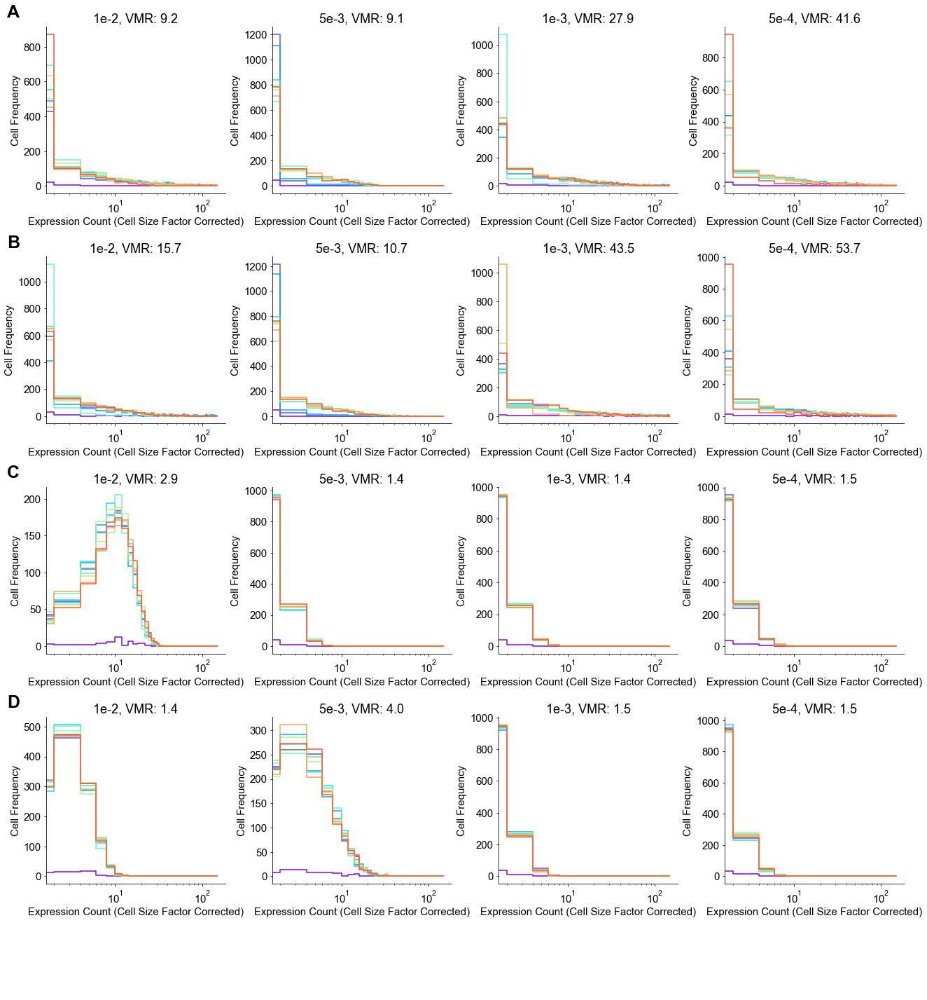

In [30]:
#record_list_df_simul['Area under the curve']=record_list_df_simul['AUC']
#plt.rcParams["axes.prop_cycle"]=cycler('color',color_qual_7)
#plt.rcParams["axes.prop_cycle"]=cycler('color',[list(plt.cm.rainbow([i])[0]) for i in np.linspace(0,1,10)])


fig = plt.figure(figsize=(25, 25)) 
gs=fig.add_gridspec(25,25)

plt.rcParams["font.size"] = 15

fig_sub1=fig.add_subplot(gs[0:5,0:20])
fig_sub1.axis('off')

fig_sub1_1 = fig_sub1.inset_axes([0.0,0.6,0.23,0.9])
fig_sub1_2 = fig_sub1.inset_axes([0.25+0.04,0.6,0.23,0.9])

fig_sub1_3 = fig_sub1.inset_axes([0.5+0.08,0.6,0.23,0.9])
fig_sub1_4 = fig_sub1.inset_axes([0.75+0.12,0.6,0.23,0.9])

#plot_clustering_tsne(fig_sub1_1,'1e-2',1000)
plot_distribution(fig_sub1_1, prop='1e-2', ncells=10000, is_marker=True, idx=0)
plot_distribution(fig_sub1_2, prop='5e-3', ncells=10000, is_marker=True, idx=0)
plot_distribution(fig_sub1_3, prop='1e-3', ncells=10000, is_marker=True, idx=1)
plot_distribution(fig_sub1_4, prop='5e-4', ncells=10000, is_marker=True, idx=2)

fig_sub1.text(-0.05, 1.55, 'A', fontproperties=font_prop(bold=True,size=25), transform=fig_sub1.transAxes)




fig_sub1=fig.add_subplot(gs[5+1:10+1,0:20])
fig_sub1.axis('off')

fig_sub1_1 = fig_sub1.inset_axes([0.0,0.6,0.23,0.9])
fig_sub1_2 = fig_sub1.inset_axes([0.25+0.04,0.6,0.23,0.9])

fig_sub1_3 = fig_sub1.inset_axes([0.5+0.08,0.6,0.23,0.9])
fig_sub1_4 = fig_sub1.inset_axes([0.75+0.12,0.6,0.23,0.9])

plot_distribution(fig_sub1_1, prop='1e-2', ncells=10000, is_marker=True, idx=1)
plot_distribution(fig_sub1_2, prop='5e-3', ncells=10000, is_marker=True, idx=1)
plot_distribution(fig_sub1_3, prop='1e-3', ncells=10000, is_marker=True, idx=2)
plot_distribution(fig_sub1_4, prop='5e-4', ncells=10000, is_marker=True, idx=3)

fig_sub1.text(-0.05, 1.55, 'B', fontproperties=font_prop(bold=True,size=25), transform=fig_sub1.transAxes)
#fig_sub1.set_title('Simulation Datasets')

fig_sub1.legend().remove()




fig_sub1=fig.add_subplot(gs[10+2:15+2,0:20])
fig_sub1.axis('off')

fig_sub1_1 = fig_sub1.inset_axes([0.0,0.6,0.23,0.9])
fig_sub1_2 = fig_sub1.inset_axes([0.25+0.04,0.6,0.23,0.9])

fig_sub1_3 = fig_sub1.inset_axes([0.5+0.08,0.6,0.23,0.9])
fig_sub1_4 = fig_sub1.inset_axes([0.75+0.12,0.6,0.23,0.9])

plot_distribution(fig_sub1_1, prop='1e-2', ncells=10000, is_marker=False, idx=0)
plot_distribution(fig_sub1_2, prop='5e-3', ncells=10000, is_marker=False, idx=0)
plot_distribution(fig_sub1_3, prop='1e-3', ncells=10000, is_marker=False, idx=0)
plot_distribution(fig_sub1_4, prop='5e-4', ncells=10000, is_marker=False, idx=0)

fig_sub1.text(-0.05, 1.55, 'C', fontproperties=font_prop(bold=True,size=25), transform=fig_sub1.transAxes)
#fig_sub1.set_title('Simulation Datasets')

fig_sub1.legend().remove()





fig_sub1=fig.add_subplot(gs[15+3:20+3,0:20])
fig_sub1.axis('off')

fig_sub1_1 = fig_sub1.inset_axes([0.0,0.6,0.23,0.9])
fig_sub1_2 = fig_sub1.inset_axes([0.25+0.04,0.6,0.23,0.9])

fig_sub1_3 = fig_sub1.inset_axes([0.5+0.08,0.6,0.23,0.9])
fig_sub1_4 = fig_sub1.inset_axes([0.75+0.12,0.6,0.23,0.9])

plot_distribution(fig_sub1_1, prop='1e-2', ncells=10000, is_marker=False, idx=1)
plot_distribution(fig_sub1_2, prop='5e-3', ncells=10000, is_marker=False, idx=1)
plot_distribution(fig_sub1_3, prop='1e-3', ncells=10000, is_marker=False, idx=1)
plot_distribution(fig_sub1_4, prop='5e-4', ncells=10000, is_marker=False, idx=1)

fig_sub1.text(-0.05, 1.55, 'D', fontproperties=font_prop(bold=True,size=25), transform=fig_sub1.transAxes)
#fig_sub1.set_title('Simulation Datasets')

fig_sub1.legend().remove()

In [69]:
def plot_distribution(ax, prop, ncells=1000, idx=0, is_marker=True, legend=False):
    tsne=pd.read_csv('datasets/extract/Simul_{}_{}_1_filtered.tsne.vst.2000.tsv'.format(ncells,prop),sep='\t')
    exp_data=mmread('datasets/extract/Simul_{}_{}_1_filtered.data.counts.mm'.format(ncells,prop)).toarray().astype(float)
    exp_data_s=pd.read_csv('datasets/extract/Simul_{}_{}_1_filtered.size_factor.tsv'.format(ncells,prop),sep='\t',header=None)[0].values.astype(float)
    with open('datasets/extract/Simul_{}_{}_1_filtered.data.col'.format(ncells,prop),'r') as f: exp_data_col=[i.strip().strip('"') for i in f.read().split()]
    with open('datasets/extract/Simul_{}_{}_1_filtered.data.row'.format(ncells,prop),'r') as f: exp_data_row=[i.strip().strip('"') for i in f.read().split()]
    assert exp_data.shape==(len(exp_data_row),len(exp_data_col))
    assert len(set(exp_data_row))==len(exp_data_row)
    assert len(set(exp_data_col))==len(exp_data_col)
    exp_data_meta=pd.read_csv('datasets/extract/Simul_{}_{}_1_filtered.metadatacol.tsv'.format(ncells,prop),sep='\t')
    #label=pd.read_csv('datasets/extract/Simul_{}_{}_1_filtered.clustering.1_0.label.tsv'.format(ncells,prop),sep='\t')

    bin_max=1e+6


    marker=load_marker('Simul_{}_{}_1_filtered'.format(ncells,prop),method='EVF')
    
    if is_marker:
        gene_name=marker[idx]
    else:
        gene_name=list(set(exp_data_row).difference(marker))[idx]
    
    #print(marker)
    #print(exp_data_row)

    #.value_counts().sort_values()[1:].index:
    vmr_list=[]
    for idx,phenoid in enumerate(exp_data_meta['phenoid'].unique()):
        #data_on=(exp_data[exp_data_row.index(gene_name)]/exp_data_s)[gamma_argmax_list[exp_data_row.index(gene_name)]==0]    
        #data_on=(exp_data[exp_data_row.index(gene_name)]/exp_data_s)
        data_on=(exp_data[exp_data_row.index(gene_name)])
        data_on_select=data_on[exp_data_meta['phenoid']==phenoid]
        #print(np.var(data_on)/np.mean(data_on))
        #bins=[np.power(1.5,i) for i in range(16)]
        vmr_list.append(np.var(data_on_select)/np.mean(data_on_select))
        
        bins_=np.arange(0, 150, 2)
        """
        ax.hist(data_on,
              alpha=0.2,
              ec = "skyblue",
              color=[1,1,1,0],
              bins=bins,
              label='On') 
        """
        
        #bins=np.clip(bins,a_min=0,a_max=exp_data.max())
        #bins=[np.power(1.2,i) for i in range(int(np.log(bin_max)/np.log(1.2)))]

        bins, edges = np.histogram(data_on_select, bins=bins_, density=True)
        left, right = edges[:-1],edges[1:]
        X = np.array([left,right]).T.flatten()
        Y = np.array([bins,bins]).T.flatten()        
        ax.plot(X,Y, color=[list(plt.cm.rainbow([i])[0]) for i in np.linspace(0,1,10)][idx])
    
    
    
    handles_on, labels_on=ax.get_legend_handles_labels()
    #legt=fig_sub2.legend(markerscale=0.0) 
    #[rec.set_height(5) for rec in leg.get_patches()]    
    
    ax.set_xscale('log')
    #fig_sub2.set_yscale('log')
    
    ax.set_title('{}, VMR: {:.1f}'.format(prop, np.var(data_on)/np.mean(data_on))+'\n'+'\n'.join(['{:.1f}'.format(vmr) for vmr in vmr_list]) )
    
        
    ax.set_xlabel('Expression Count (Cell Size Factor Corrected)')
    ax.set_ylabel('Cell Frequency')
    
    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)      
    

No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


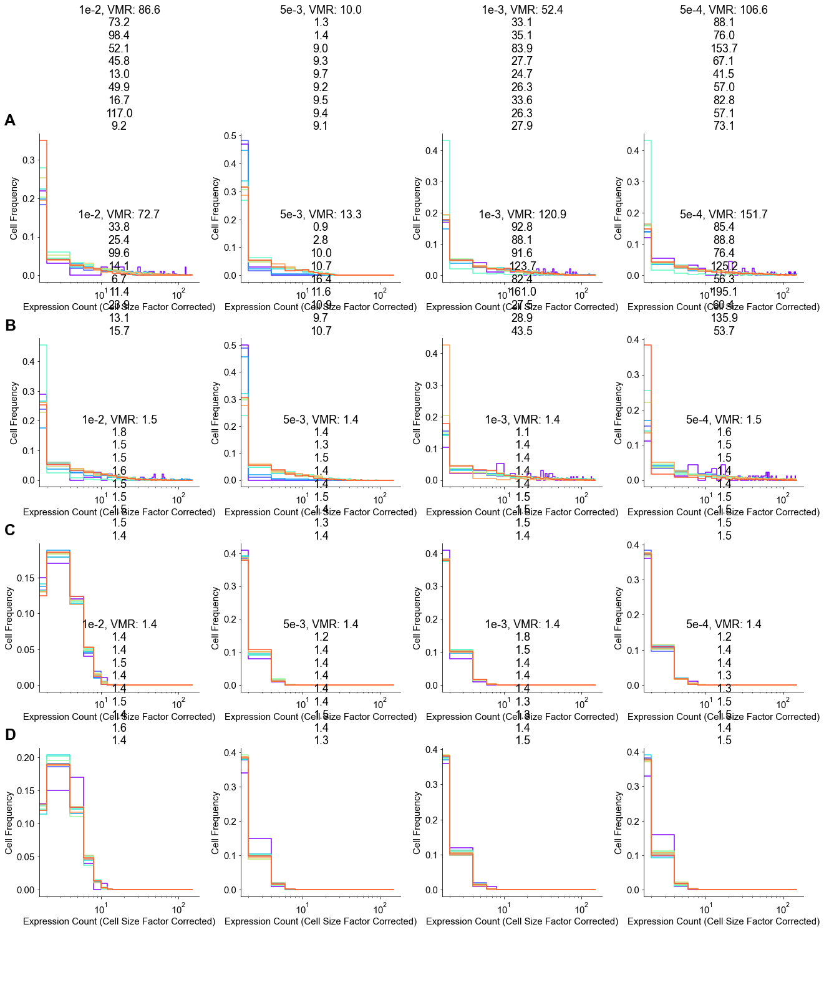

In [70]:
#plt.rcParams["axes.prop_cycle"]=cycler('color',color_qual_7)
#plt.rcParams["axes.prop_cycle"]=cycler('color',[list(plt.cm.rainbow([i])[0]) for i in np.linspace(0,1,10)])


fig = plt.figure(figsize=(25, 25)) 
gs=fig.add_gridspec(25,25)

plt.rcParams["font.size"] = 15

fig_sub1=fig.add_subplot(gs[0:5,0:20])
fig_sub1.axis('off')

fig_sub1_1 = fig_sub1.inset_axes([0.0,0.6,0.23,0.9])
fig_sub1_2 = fig_sub1.inset_axes([0.25+0.04,0.6,0.23,0.9])

fig_sub1_3 = fig_sub1.inset_axes([0.5+0.08,0.6,0.23,0.9])
fig_sub1_4 = fig_sub1.inset_axes([0.75+0.12,0.6,0.23,0.9])

#plot_clustering_tsne(fig_sub1_1,'1e-2',1000)
plot_distribution(fig_sub1_1, prop='1e-2', ncells=10000, is_marker=True, idx=0)
plot_distribution(fig_sub1_2, prop='5e-3', ncells=10000, is_marker=True, idx=0)
plot_distribution(fig_sub1_3, prop='1e-3', ncells=10000, is_marker=True, idx=1)
plot_distribution(fig_sub1_4, prop='5e-4', ncells=10000, is_marker=True, idx=4)

fig_sub1.text(-0.05, 1.55, 'A', fontproperties=font_prop(bold=True,size=25), transform=fig_sub1.transAxes)




fig_sub1=fig.add_subplot(gs[5+1:10+1,0:20])
fig_sub1.axis('off')

fig_sub1_1 = fig_sub1.inset_axes([0.0,0.6,0.23,0.9])
fig_sub1_2 = fig_sub1.inset_axes([0.25+0.04,0.6,0.23,0.9])

fig_sub1_3 = fig_sub1.inset_axes([0.5+0.08,0.6,0.23,0.9])
fig_sub1_4 = fig_sub1.inset_axes([0.75+0.12,0.6,0.23,0.9])

plot_distribution(fig_sub1_1, prop='1e-2', ncells=10000, is_marker=True, idx=1)
plot_distribution(fig_sub1_2, prop='5e-3', ncells=10000, is_marker=True, idx=1)
plot_distribution(fig_sub1_3, prop='1e-3', ncells=10000, is_marker=True, idx=2)
plot_distribution(fig_sub1_4, prop='5e-4', ncells=10000, is_marker=True, idx=3)

fig_sub1.text(-0.05, 1.55, 'B', fontproperties=font_prop(bold=True,size=25), transform=fig_sub1.transAxes)
#fig_sub1.set_title('Simulation Datasets')

fig_sub1.legend().remove()




fig_sub1=fig.add_subplot(gs[10+2:15+2,0:20])
fig_sub1.axis('off')

fig_sub1_1 = fig_sub1.inset_axes([0.0,0.6,0.23,0.9])
fig_sub1_2 = fig_sub1.inset_axes([0.25+0.04,0.6,0.23,0.9])

fig_sub1_3 = fig_sub1.inset_axes([0.5+0.08,0.6,0.23,0.9])
fig_sub1_4 = fig_sub1.inset_axes([0.75+0.12,0.6,0.23,0.9])

plot_distribution(fig_sub1_1, prop='1e-2', ncells=10000, is_marker=False, idx=4)
plot_distribution(fig_sub1_2, prop='5e-3', ncells=10000, is_marker=False, idx=0)
plot_distribution(fig_sub1_3, prop='1e-3', ncells=10000, is_marker=False, idx=0)
plot_distribution(fig_sub1_4, prop='5e-4', ncells=10000, is_marker=False, idx=0)

fig_sub1.text(-0.05, 1.55, 'C', fontproperties=font_prop(bold=True,size=25), transform=fig_sub1.transAxes)
#fig_sub1.set_title('Simulation Datasets')

fig_sub1.legend().remove()





fig_sub1=fig.add_subplot(gs[15+3:20+3,0:20])
fig_sub1.axis('off')

fig_sub1_1 = fig_sub1.inset_axes([0.0,0.6,0.23,0.9])
fig_sub1_2 = fig_sub1.inset_axes([0.25+0.04,0.6,0.23,0.9])

fig_sub1_3 = fig_sub1.inset_axes([0.5+0.08,0.6,0.23,0.9])
fig_sub1_4 = fig_sub1.inset_axes([0.75+0.12,0.6,0.23,0.9])

plot_distribution(fig_sub1_1, prop='1e-2', ncells=10000, is_marker=False, idx=1)
plot_distribution(fig_sub1_2, prop='5e-3', ncells=10000, is_marker=False, idx=4)
plot_distribution(fig_sub1_3, prop='1e-3', ncells=10000, is_marker=False, idx=1)
plot_distribution(fig_sub1_4, prop='5e-4', ncells=10000, is_marker=False, idx=1)

fig_sub1.text(-0.05, 1.55, 'D', fontproperties=font_prop(bold=True,size=25), transform=fig_sub1.transAxes)
#fig_sub1.set_title('Simulation Datasets')

fig_sub1.legend().remove()

In [65]:
def plot_distribution(ax, prop, ncells=1000, idx=0, is_marker=True, legend=False):
    tsne=pd.read_csv('datasets/extract/Simul_{}_{}_1_filtered.tsne.vst.2000.tsv'.format(ncells,prop),sep='\t')
    exp_data=mmread('datasets/extract/Simul_{}_{}_1_filtered.data.counts.mm'.format(ncells,prop)).toarray().astype(float)
    exp_data_s=pd.read_csv('datasets/extract/Simul_{}_{}_1_filtered.size_factor.tsv'.format(ncells,prop),sep='\t',header=None)[0].values.astype(float)
    with open('datasets/extract/Simul_{}_{}_1_filtered.data.col'.format(ncells,prop),'r') as f: exp_data_col=[i.strip().strip('"') for i in f.read().split()]
    with open('datasets/extract/Simul_{}_{}_1_filtered.data.row'.format(ncells,prop),'r') as f: exp_data_row=[i.strip().strip('"') for i in f.read().split()]
    assert exp_data.shape==(len(exp_data_row),len(exp_data_col))
    assert len(set(exp_data_row))==len(exp_data_row)
    assert len(set(exp_data_col))==len(exp_data_col)
    exp_data_meta=pd.read_csv('datasets/extract/Simul_{}_{}_1_filtered.metadatacol.tsv'.format(ncells,prop),sep='\t')
    #label=pd.read_csv('datasets/extract/Simul_{}_{}_1_filtered.clustering.1_0.label.tsv'.format(ncells,prop),sep='\t')

    bin_max=1e+6


    marker=load_marker('Simul_{}_{}_1_filtered'.format(ncells,prop),method='EVF')
    
    if is_marker:
        gene_name=marker[idx]
    else:
        gene_name=list(set(exp_data_row).difference(marker))[idx]
    
    #print(marker)
    #print(exp_data_row)
    bins_=np.arange(0, 150, 2)

    data_on=(exp_data[exp_data_row.index(gene_name)])    
    bins, edges = np.histogram(data_on, bins=bins_, density=False)
    left, right = edges[:-1],edges[1:]
    X = np.array([left,right]).T.flatten()
    Y = np.array([bins,bins]).T.flatten()     
    ax.plot(X,Y, color=[1,0,0,1])
    
    #.value_counts().sort_values()[1:].index:
    for idx,phenoid in enumerate(exp_data_meta['phenoid'].unique()):
        break
        #data_on=(exp_data[exp_data_row.index(gene_name)]/exp_data_s)[gamma_argmax_list[exp_data_row.index(gene_name)]==0]    
        #data_on=(exp_data[exp_data_row.index(gene_name)]/exp_data_s)
        data_on=(exp_data[exp_data_row.index(gene_name)])
        #data_on=data_on[exp_data_meta['phenoid']==phenoid]
        #print(np.var(data_on)/np.mean(data_on))
        #bins=[np.power(1.5,i) for i in range(16)
        """
        ax.hist(data_on,
              alpha=0.2,
              ec = "skyblue",
              color=[1,1,1,0],
              bins=bins,
              label='On') 
        """
        
        #bins=np.clip(bins,a_min=0,a_max=exp_data.max())
        #bins=[np.power(1.2,i) for i in range(int(np.log(bin_max)/np.log(1.2)))]

        bins, edges = np.histogram(data_on, bins=bins, density=False)
        left, right = edges[:-1],edges[1:]
        X = np.array([left,right]).T.flatten()
        Y = np.array([bins,bins]).T.flatten()        
        #ax.plot(X,Y, color=[list(plt.cm.rainbow([i])[0]) for i in np.linspace(0,1,10)][idx])
        
    
    
    handles_on, labels_on=ax.get_legend_handles_labels()
    #legt=fig_sub2.legend(markerscale=0.0) 
    #[rec.set_height(5) for rec in leg.get_patches()]    
    
    ax.set_xscale('log')
    #fig_sub2.set_yscale('log')
    
    ax.set_title('{}, VMR: {:.1f}'.format(prop, np.var(data_on)/np.mean(data_on) ))
    
        
    ax.set_xlabel('Expression Count (Cell Size Factor Corrected)')
    ax.set_ylabel('Cell Frequency')
    
    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)      
    

No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


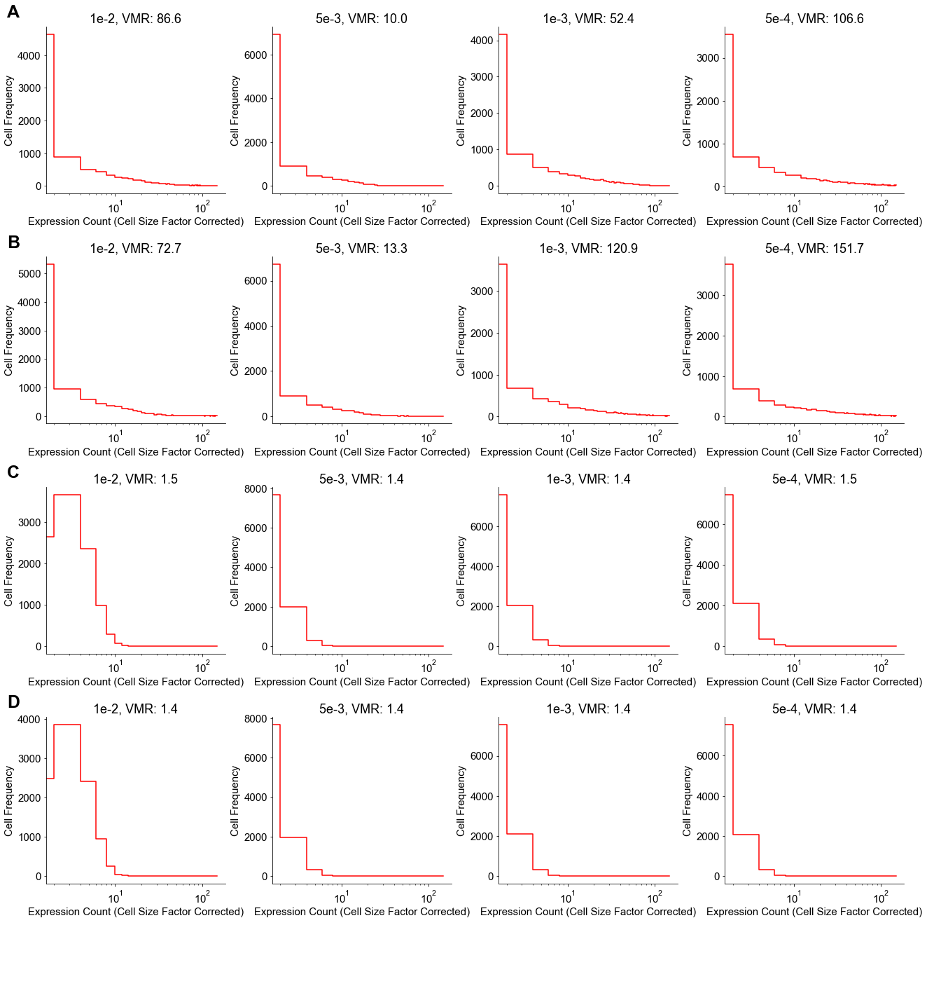

In [66]:
#plt.rcParams["axes.prop_cycle"]=cycler('color',color_qual_7)
#plt.rcParams["axes.prop_cycle"]=cycler('color',[list(plt.cm.rainbow([i])[0]) for i in np.linspace(0,1,10)])


fig = plt.figure(figsize=(25, 25)) 
gs=fig.add_gridspec(25,25)

plt.rcParams["font.size"] = 15

fig_sub1=fig.add_subplot(gs[0:5,0:20])
fig_sub1.axis('off')

fig_sub1_1 = fig_sub1.inset_axes([0.0,0.6,0.23,0.9])
fig_sub1_2 = fig_sub1.inset_axes([0.25+0.04,0.6,0.23,0.9])

fig_sub1_3 = fig_sub1.inset_axes([0.5+0.08,0.6,0.23,0.9])
fig_sub1_4 = fig_sub1.inset_axes([0.75+0.12,0.6,0.23,0.9])

#plot_clustering_tsne(fig_sub1_1,'1e-2',1000)
plot_distribution(fig_sub1_1, prop='1e-2', ncells=10000, is_marker=True, idx=0)
plot_distribution(fig_sub1_2, prop='5e-3', ncells=10000, is_marker=True, idx=0)
plot_distribution(fig_sub1_3, prop='1e-3', ncells=10000, is_marker=True, idx=1)
plot_distribution(fig_sub1_4, prop='5e-4', ncells=10000, is_marker=True, idx=4)

fig_sub1.text(-0.05, 1.55, 'A', fontproperties=font_prop(bold=True,size=25), transform=fig_sub1.transAxes)




fig_sub1=fig.add_subplot(gs[5+1:10+1,0:20])
fig_sub1.axis('off')

fig_sub1_1 = fig_sub1.inset_axes([0.0,0.6,0.23,0.9])
fig_sub1_2 = fig_sub1.inset_axes([0.25+0.04,0.6,0.23,0.9])

fig_sub1_3 = fig_sub1.inset_axes([0.5+0.08,0.6,0.23,0.9])
fig_sub1_4 = fig_sub1.inset_axes([0.75+0.12,0.6,0.23,0.9])

plot_distribution(fig_sub1_1, prop='1e-2', ncells=10000, is_marker=True, idx=1)
plot_distribution(fig_sub1_2, prop='5e-3', ncells=10000, is_marker=True, idx=1)
plot_distribution(fig_sub1_3, prop='1e-3', ncells=10000, is_marker=True, idx=2)
plot_distribution(fig_sub1_4, prop='5e-4', ncells=10000, is_marker=True, idx=3)

fig_sub1.text(-0.05, 1.55, 'B', fontproperties=font_prop(bold=True,size=25), transform=fig_sub1.transAxes)
#fig_sub1.set_title('Simulation Datasets')

fig_sub1.legend().remove()




fig_sub1=fig.add_subplot(gs[10+2:15+2,0:20])
fig_sub1.axis('off')

fig_sub1_1 = fig_sub1.inset_axes([0.0,0.6,0.23,0.9])
fig_sub1_2 = fig_sub1.inset_axes([0.25+0.04,0.6,0.23,0.9])

fig_sub1_3 = fig_sub1.inset_axes([0.5+0.08,0.6,0.23,0.9])
fig_sub1_4 = fig_sub1.inset_axes([0.75+0.12,0.6,0.23,0.9])

plot_distribution(fig_sub1_1, prop='1e-2', ncells=10000, is_marker=False, idx=4)
plot_distribution(fig_sub1_2, prop='5e-3', ncells=10000, is_marker=False, idx=0)
plot_distribution(fig_sub1_3, prop='1e-3', ncells=10000, is_marker=False, idx=0)
plot_distribution(fig_sub1_4, prop='5e-4', ncells=10000, is_marker=False, idx=0)

fig_sub1.text(-0.05, 1.55, 'C', fontproperties=font_prop(bold=True,size=25), transform=fig_sub1.transAxes)
#fig_sub1.set_title('Simulation Datasets')

fig_sub1.legend().remove()





fig_sub1=fig.add_subplot(gs[15+3:20+3,0:20])
fig_sub1.axis('off')

fig_sub1_1 = fig_sub1.inset_axes([0.0,0.6,0.23,0.9])
fig_sub1_2 = fig_sub1.inset_axes([0.25+0.04,0.6,0.23,0.9])

fig_sub1_3 = fig_sub1.inset_axes([0.5+0.08,0.6,0.23,0.9])
fig_sub1_4 = fig_sub1.inset_axes([0.75+0.12,0.6,0.23,0.9])

plot_distribution(fig_sub1_1, prop='1e-2', ncells=10000, is_marker=False, idx=1)
plot_distribution(fig_sub1_2, prop='5e-3', ncells=10000, is_marker=False, idx=4)
plot_distribution(fig_sub1_3, prop='1e-3', ncells=10000, is_marker=False, idx=1)
plot_distribution(fig_sub1_4, prop='5e-4', ncells=10000, is_marker=False, idx=1)

fig_sub1.text(-0.05, 1.55, 'D', fontproperties=font_prop(bold=True,size=25), transform=fig_sub1.transAxes)
#fig_sub1.set_title('Simulation Datasets')

fig_sub1.legend().remove()

Text(-0.05, 1.55, 'A')

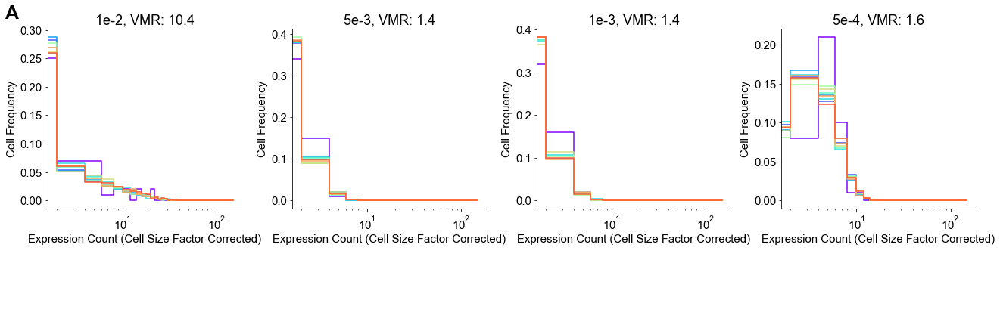

In [61]:
#record_list_df_simul['Area under the curve']=record_list_df_simul['AUC']
#plt.rcParams["axes.prop_cycle"]=cycler('color',color_qual_7)
plt.rcParams["axes.prop_cycle"]=cycler('color',[list(plt.cm.rainbow([i])[0]) for i in np.linspace(0,1,10)])


fig = plt.figure(figsize=(25, 25)) 
gs=fig.add_gridspec(25,25)

plt.rcParams["font.size"] = 15

fig_sub1=fig.add_subplot(gs[0:5,0:20])
fig_sub1.axis('off')

fig_sub1_1 = fig_sub1.inset_axes([0.0,0.6,0.23,0.9])
fig_sub1_2 = fig_sub1.inset_axes([0.25+0.04,0.6,0.23,0.9])

fig_sub1_3 = fig_sub1.inset_axes([0.5+0.08,0.6,0.23,0.9])
fig_sub1_4 = fig_sub1.inset_axes([0.75+0.12,0.6,0.23,0.9])

#plot_clustering_tsne(fig_sub1_1,'1e-2',1000)
plot_distribution(fig_sub1_1, prop='1e-2', ncells=10000, is_marker=False, idx=3)
plot_distribution(fig_sub1_2, prop='5e-3', ncells=10000, is_marker=False, idx=4)
plot_distribution(fig_sub1_3, prop='1e-3', ncells=10000, is_marker=False, idx=3)
plot_distribution(fig_sub1_4, prop='5e-4', ncells=10000, is_marker=False, idx=3)

fig_sub1.text(-0.05, 1.55, 'A', fontproperties=font_prop(bold=True,size=25), transform=fig_sub1.transAxes)

In [ ]:
plt.rcParams["font.size"] = 15

fig = plt.figure(figsize=(5+1+4+1+5+1+4+1,5+2+5+2+5+1))
gs=fig.add_gridspec(5+2+5+2+5+1,5+1+4+1+5+1+4+1)

for idx,(_,gene_select) in enumerate(unique_genes.items()):
    dataset_name=gene_select['dataset_name']
    gene_name=gene_select['name']
    gene_symbol=gene_select['Symbol']
    phenoid=gene_select['phenoid']
    rank=gene_select['rank']
    bin_max=gene_select['bin_max']
    
    
    exp_data_meta_transformed=exp_data_meta_dict[dataset_name]
    exp_data=exp_data_dict[dataset_name]
    exp_data_row=exp_data_row_dict[dataset_name]
    exp_data_s=exp_data_s_dict[dataset_name]
    gamma_argmax_list=gamma_argmax_dict[dataset_name]
    
    if idx==0:
        idx1,idx2=0,0
    elif idx==1:
        idx1,idx2=0,11
    elif idx==2:
        idx1,idx2=7,0
    elif idx==3:
        idx1,idx2=7,11
    elif idx==4:
        idx1,idx2=14,0
    elif idx==5:
        idx1,idx2=14,11        
    #down,right
    fig_sub1=fig.add_subplot(gs[idx1:idx1+4,idx2:idx2+4])
    fig_sub2=fig.add_subplot(gs[idx1:idx1+4,idx2+5:idx2+5+4])
    
    # 5 7
    
    
    
    plot_value=exp_data_meta_transformed['phenoid']
    plot_value_unique=plot_value.unique().tolist()
    plot_value_int=list(map(lambda x: plot_value_unique.index(x),plot_value))       
    
    
    palette=np.array([
        [234,216,256,256], 
        
        [175,256,205,256],
        
        [240,162,130,256],         

        
        [256,214,130,256],
        
        #[100,100,256,256],

        [130,190,256,256],
        

        [150,200,130,256],   
        
        [190,240,256,256],       
        
        [256,230,130,256],
        
        [256,140,240,256],
        

    ])/256    
    
    #palette[:,-1]=0.2

    if dataset_name=='Kohinbulk_filtered':
        #palette = np.array(sns.color_palette('husl',9))#,len(plot_value_unique)+2))#[2::])
        pass
        #husl
        #palette[9][0]=0.5
        #palette*=0.9
        #palette=palette[[1,9,3,5,6,7,2,8]]
        # palplot을 통해 저장한 팔레트를 불러온다.
        #ns.palplot(palette)       

    elif dataset_name=='HumanLiver_filtered':
        pass
        #palette = np.array(sns.color_palette("Paired",len(plot_value_unique)+2)[2::])
        #palette[8]*=0.8
        #palette*=0.9
        #palette=palette[[0,2,4,6,8,10,3,1,5,7,9]]
        # palplot을 통해 저장한 팔레트를 불러온다.
        #sns.palplot(palette)

    elif dataset_name=='Zhengmix8eq_filtered':
        pass
        #palette = np.array(sns.color_palette("bright"))#,len(plot_value_unique)+2))#[2::])
        #palette[8]*=0.8
        #palette*=0.9
        #palette=palette[[1,9,5,3,2,8,6,7]]
        # palplot을 통해 저장한 팔레트를 불러온다.
        #sns.palplot(palette)       
    
    
    #s=30
    sns.scatterplot(x="TSNE_1", y="TSNE_2",hue=list(map(celltype_mapper,plot_value.values)), data=exp_data_meta_transformed,
                    palette=palette,
                    ax=fig_sub1,alpha=1,edgecolor="None",
                    s=20
                   )
    
    
    gene_select_on=gamma_argmax_list[exp_data_row.index(gene_select['name'])]==0
    #gene_select_on=exp_data_dict[dataset_name][exp_data_row.index(gene_select['name'])]>1
    
    
    sns.scatterplot(x="TSNE_1", y="TSNE_2",data=exp_data_meta_transformed.loc[gene_select_on],
                    ax=fig_sub1,
                    edgecolor=[1,0,0,1],
                    facecolors="None",
                    linewidth=2.2,
                    #alpha=0.5 if dataset_name in ['HumanLiver_filtered'] else 1,
                    s=30
                   )
    
    gene_select_off=gamma_argmax_list[exp_data_row.index(gene_select['name'])]==1
    #gene_select_on=exp_data_dict[dataset_name][exp_data_row.index(gene_select['name'])]>1
    
    """
    sns.scatterplot(x="TSNE_1", y="TSNE_2",data=exp_data_meta_transformed.loc[gene_select_off],
                    ax=fig_sub1,
                    edgecolor='grey',
                    facecolors="None",
                    linewidths=1,
                    alpha=0.5 if dataset_name in ['HumanLiver_filtered'] else 1,
                    s=s
                   )    
    """
    
    
    #              )
    #fig_sub1.title.set_text('{} - {}'.format(gene_symbol,celltype_mapper(phenoid)))
    #fig_sub1.title.se
    
    
    fig_sub1.set_title(label='   {} ({} out of {:,})'.format(gene_symbol,rank,len(exp_data_row)),
                       pad=0.2,
                       loc='left')
    
    fig_sub1.set_xlabel('tSNE1')
    fig_sub1.set_ylabel('tSNE2',labelpad=-5)
    
    fig_sub1.spines['right'].set_visible(False)
    fig_sub1.spines['top'].set_visible(False)
    
    
    
    if idx==0 or idx==2 or idx==4:
        fig_sub1.text(-0.3, 1.18, ['A ','B ','C '][int(idx/2)],
                      fontproperties=font_prop(bold=True,size=20), transform=fig_sub1.transAxes)
        fig_sub1.text(-0.2, 1.18,
                      '{}'.format(dataset_name_mapper(dataset_name,'full')),
                      fontproperties=font_prop(bold=False,size=20), transform=fig_sub1.transAxes)
        
        """
        fig_sub1.text(-0.1, 1.15,
                      '{}. {}'.format('abcd'[idx],''),

                      fontproperties=font_prop(bold=True,size=45), transform=fig_sub1.transAxes)
        fig_sub1.text(-0., 1.15,
                      '{}'.format(dataset_name_mapper(dataset_name)),

                      fontproperties=font_prop(bold=False,size=45), transform=fig_sub1.transAxes)        
        """
        
        leg=fig_sub1.legend(loc='upper left',
                    #bbox_to_anchor=(0.45,-0.1),
                    bbox_to_anchor=(-0.2, -0.23),
                    ncol=4 if idx!=2 else 5,
                    markerscale=2.5)        
    else:
        fig_sub1.legend().remove()

        
    data_on=(exp_data[exp_data_row.index(gene_name)]/exp_data_s)[gamma_argmax_list[exp_data_row.index(gene_name)]==0]    
    bins=[np.power(1.5,i) for i in range(37)]
    #bins=np.clip(bins,a_min=0,a_max=exp_data.max())
    bins=[np.power(1.2,i) for i in range(int(np.log(bin_max)/np.log(1.2)))]
    fig_sub2.hist(data_on,
                  alpha=0.8,
                  bins=bins,
                  color=[1,0,0,1],
                  label='On'
                  )
    
    handles_on, labels_on=fig_sub2.get_legend_handles_labels()
    #legt=fig_sub2.legend(markerscale=0.0) 
    #[rec.set_height(5) for rec in leg.get_patches()]    
    
    fig_sub2.set_xscale('log')
    #fig_sub2.set_yscale('log')
    
        
    fig_sub2.set_xlabel('Expression Count (Cell Size Factor Corrected)')
    fig_sub2.set_ylabel('Cell Frequency')
    
    fig_sub2.spines['right'].set_visible(False)
    fig_sub2.spines['top'].set_visible(False)      
    

    
    data_off=(exp_data[exp_data_row.index(gene_name)]/exp_data_s)[gamma_argmax_list[exp_data_row.index(gene_name)]==1]
    
    #fig_sub2 = fig_sub2.twinx()
    hist_bin=fig_sub2.hist(data_off,
                 alpha=0.5,
                 bins=bins,
                 color='grey',
                 label='Off'                           
                 )
    
    
    #leg=fig_sub2.legend(markerscale=0.0) 
    handles_off, labels_off=fig_sub2.get_legend_handles_labels()
    #[rec.set_height(5) for rec in leg.get_patches()]
    
    median_cut=np.median(exp_data[exp_data_row.index(gene_name)])
    fig_sub2.axvline(x=median_cut)
    #print(sorted(exp_data[exp_data_row.index(gene_name)]))
    #print(median_cut)
    """
    print(np.max(data_off))
    X = np.array([int(i) for i in hist_bin[1]])
    Y = poisson.pmf(X,np.mean(data_off))
    range_chek=(X>np.min(data_off)) & (X<np.max(data_off))
    X=X[range_chek]
    Y=Y[range_chek]
    
    fig_sub2.plot(X, len(data_off)*Y, linewidth=10)
    """
    
    
    #fig_sub2.set_xscale('log')
    #fig_sub2.set_yscale('log')
    
        
    #fig_sub2.set_xlabel('Expression Count (cell size factor corrected)')
    #fig_sub2.set_ylabel('Cell Frequency (Off)',labelpad=10)
    
    #fig_sub2.spines['right'].set_visible(False)
    #fig_sub2.spines['top'].set_visible(False)  
    
    if idx%2==1:
        leg=fig_sub2.legend(handles_off, labels_off,bbox_to_anchor=(0.35, -0.2))
        [rec.set_height(5) for rec in leg.get_patches()]
        
        
        
        

# parameter sensitivity

[1 2 3 4 5 6 7 8 9]
[1 2 3 4 5 6 7 8 9]
[1 2 3 4 5 6 7 8 9]
[1 2 3 4 5 6 7 8 9]


Text(-0.05, 1.55, 'a')

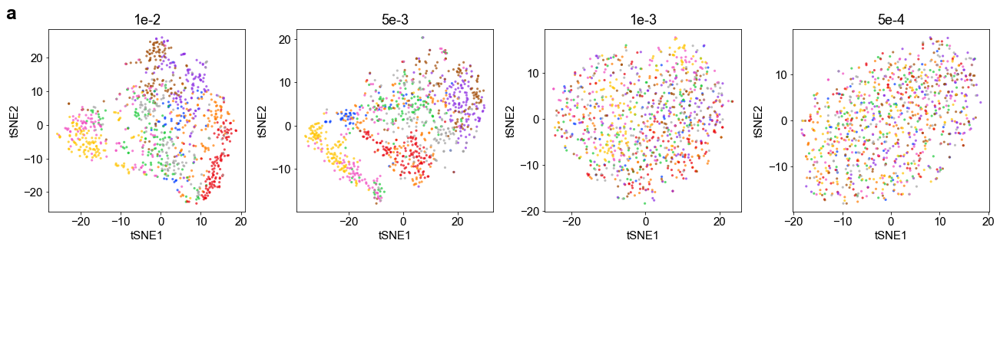

In [39]:
record_list_df_simul['Area under the curve']=record_list_df_simul['AUC']
plt.rcParams["axes.prop_cycle"]=cycler('color',color_qual_7)


fig = plt.figure(figsize=(25, 25)) 
gs=fig.add_gridspec(25,25)

plt.rcParams["font.size"] = 15

fig_sub1=fig.add_subplot(gs[0:5,0:20])
fig_sub1.axis('off')

fig_sub1_1 = fig_sub1.inset_axes([0.0,0.6,0.23,0.9])
fig_sub1_2 = fig_sub1.inset_axes([0.25+0.04,0.6,0.23,0.9])

fig_sub1_3 = fig_sub1.inset_axes([0.5+0.08,0.6,0.23,0.9])
fig_sub1_4 = fig_sub1.inset_axes([0.75+0.12,0.6,0.23,0.9])

plot_clustering_tsne(fig_sub1_1,'1e-2',1000)
plot_clustering_tsne(fig_sub1_2,'5e-3',1000)
plot_clustering_tsne(fig_sub1_3,'1e-3',1000)
plot_clustering_tsne(fig_sub1_4,'5e-4',1000,legend=False)

fig_sub1.text(-0.05, 1.55, 'a', fontproperties=font_prop(bold=True,size=25), transform=fig_sub1.transAxes)


In [157]:
hyper_minor_size_max_percent_df

,50,60,70,80,90
0,523,0,1,1,1
1,2,3,4,4,4
2,4,5,6,6,6
3,1377,1377,1377,1377,1377
4,516,520,522,526,527
...,...,...,...,...,...
1495,84,85,86,89,92
1496,265,267,271,276,279
1497,399,401,405,410,413
1498,374,376,380,385,388


In [257]:
with open('datasets/extract/{}.data.row'.format(dataset_name),'r') as f: exp_data_row=[i.strip().strip('"') for i in f.read().split()]


#marker=load_marker(dataset_name,method='truelabel_maxdiff',num_genes=500,lfc=2)          
marker=load_marker(dataset_name,method='EVF')       

DE_bool=list(map(lambda x: x in marker, exp_data_row))

In [259]:
sorted(exp_data_row)

['1000',
 '1002',
 '1009',
 '101',
 '1025',
 '1036',
 '1043',
 '1045',
 '1050',
 '1051',
 '1053',
 '1054',
 '1055',
 '1064',
 '1065',
 '1066',
 '1073',
 '1075',
 '1076',
 '1078',
 '1082',
 '1083',
 '1084',
 '109',
 '1098',
 '11',
 '110',
 '1101',
 '1104',
 '1106',
 '1107',
 '1113',
 '1114',
 '1119',
 '1122',
 '1125',
 '1126',
 '1132',
 '1141',
 '1143',
 '1147',
 '1148',
 '115',
 '1157',
 '1158',
 '1164',
 '1166',
 '1168',
 '117',
 '1171',
 '1178',
 '1182',
 '1186',
 '1193',
 '12',
 '120',
 '1202',
 '1203',
 '1204',
 '1205',
 '1208',
 '1210',
 '1212',
 '1213',
 '1221',
 '1225',
 '1226',
 '1227',
 '1229',
 '123',
 '1232',
 '1234',
 '1235',
 '1237',
 '124',
 '1243',
 '1246',
 '1249',
 '125',
 '1252',
 '1254',
 '1265',
 '1268',
 '1271',
 '1273',
 '1274',
 '1279',
 '128',
 '1280',
 '1283',
 '1285',
 '1288',
 '129',
 '1293',
 '1295',
 '1297',
 '1298',
 '1299',
 '1303',
 '1304',
 '1306',
 '1307',
 '131',
 '1314',
 '1316',
 '1317',
 '132',
 '1321',
 '1322',
 '1323',
 '1324',
 '1328',
 '133',
 

In [113]:
marker

array(['Phgdh', 'Emb', 'Gsr', 'Hhex', 'Mpo', 'Myo1f', 'Nop58', 'Srm',
       'Gusb', 'Fes', 'Lyl1', 'Anxa7', 'Gnaq', 'Alad', 'Fcgr2b', 'Ebi3',
       'Dscr3', 'Atad2', 'Eif2b1', 'Slc15a4', 'Ptplb', 'Snx9', 'Tbc1d10b',
       'Dok2', 'Ano6', 'Chchd4', 'Brd1', 'Med20', 'Fam136a', 'BC028528',
       'Prps2', 'Pxmp3', 'Zfyve27', 'Ppp1r12c', 'Tmem216', 'Prr5', 'Cst7',
       'Polb', 'Syce2', 'Acss1', 'Csrnp1', 'Slc35e1', 'Alg8', 'Gimap7',
       'Cenpm', 'D930014E17Rik', 'Repin1', 'Nipsnap1', 'Dgcr14', 'Lrrc14',
       'Apobr', 'Tsr1', 'Ctsg', 'Lat', 'Tec', 'Sgpl1', 'Arih2', 'Hspa2',
       'Tmem57', 'Rbm4b', 'Dennd2d', 'Ube2t', 'Lass4', 'Opa3', 'Ammecr1l',
       'Katnb1', 'Fam76a', 'Trim37', 'Tnfrsf26', 'Rptor', 'Rmnd5a',
       'Akr1e1', 'Zbed3', 'Ms4a3', 'Adck1', 'Mctp1', 'Galnt6', 'Cd320',
       'Gpn2', 'Cplx2', 'Myl10', 'Aptx', 'Elovl6', 'Pear1', 'Cdk16',
       'Wdr41', 'Ung', 'Atpbd4', 'Tbc1d5', 'Tmem201', 'Ydjc',
       'A530064D06Rik', 'Taf5', '1110012L19Rik', 'Nek2', 'Znhit6', '

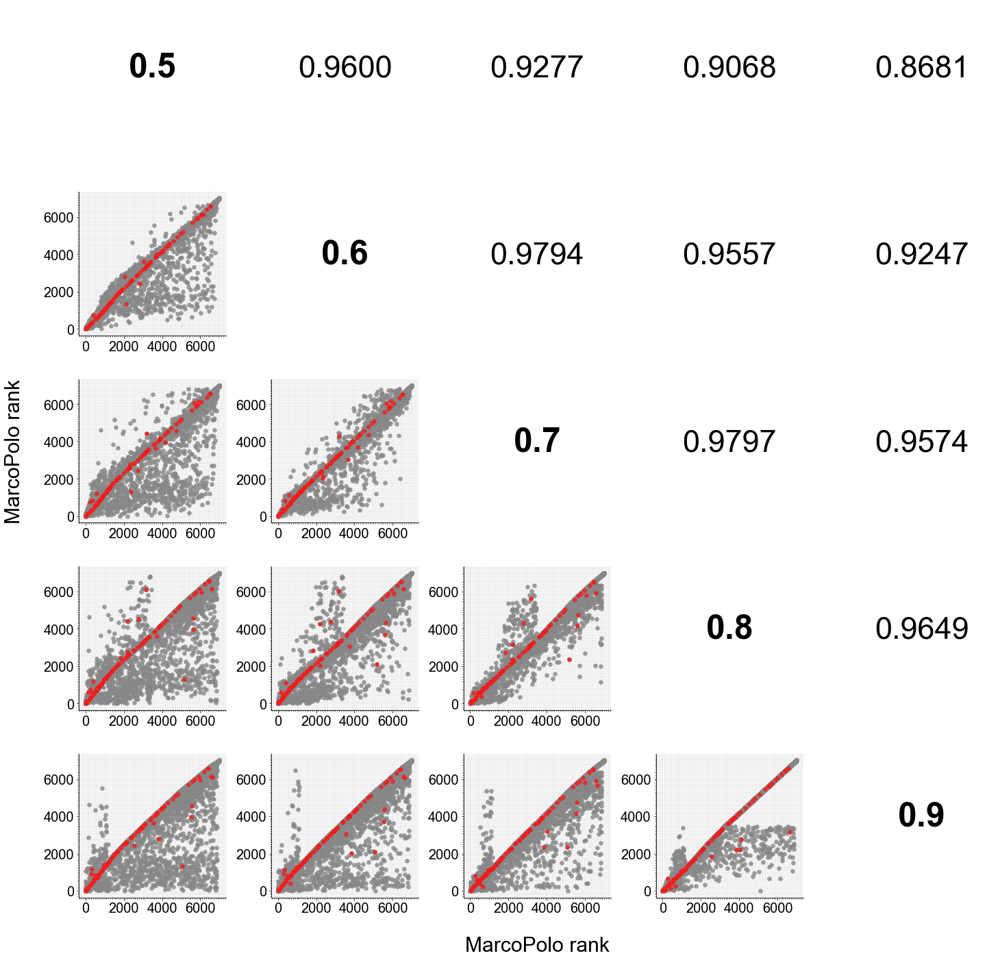

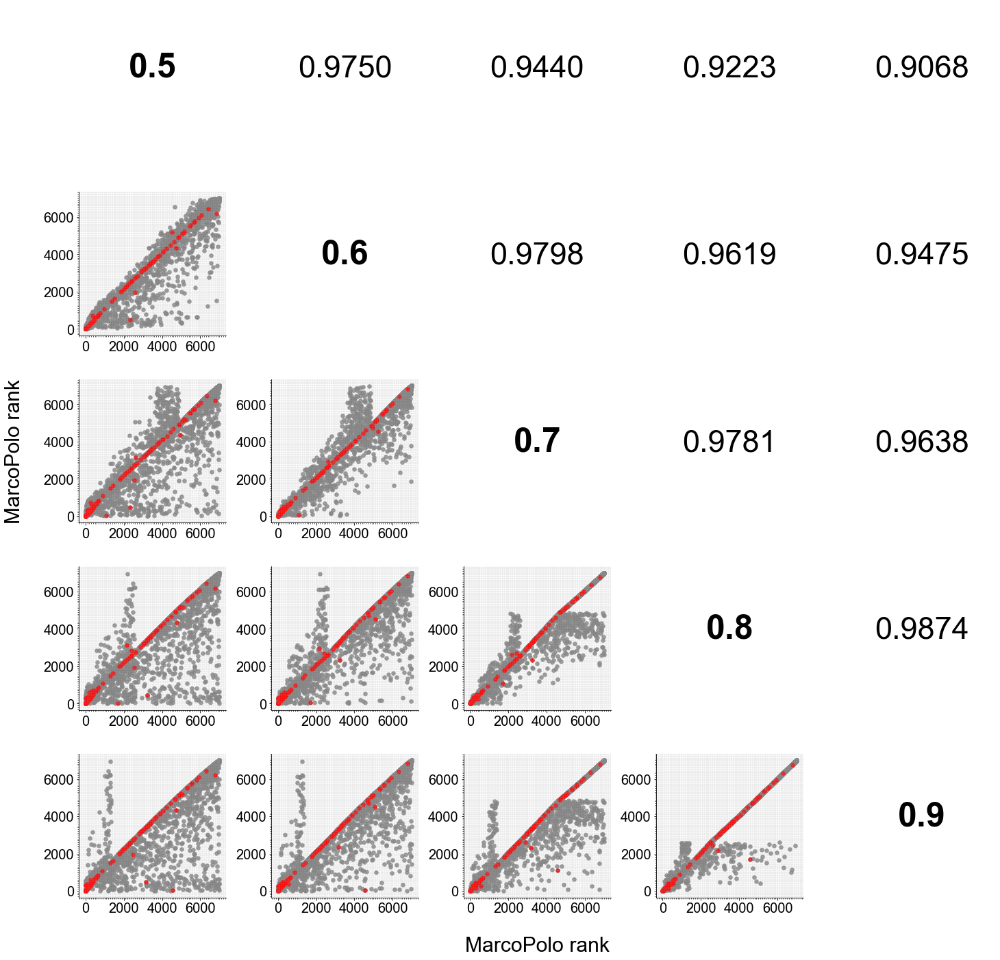

In [119]:
from scipy import stats
from matplotlib.ticker import (MultipleLocator, AutoMinorLocator)


for dataset_name in ['TabulaMarrow_filtered','TabulaLung_filtered']:
    path='datasets/extract/{}'.format(dataset_name)
    
    with open('datasets/extract/{}.data.row'.format(dataset_name),'r') as f: exp_data_row=[i.strip().strip('"') for i in f.read().split()]
    
    marker=load_marker(dataset_name,method='truelabel_maxdiff',num_genes=100,lfc=2)
    marker=load_marker(dataset_name,method='cellmarker_panglao',num_genes=100,lfc=2)

    voting_thres_range=[0.5,0.6,0.7,0.8,0.9]

    hyper_voting_thres=[]
    for voting_thres in voting_thres_range:
        result=pd.read_csv(path+'.hyperparamter.voting_thres.{}.MarcoPolo.2.rank.tsv'.format(str(voting_thres).replace('.','_')),sep='\t',index_col=0)
        hyper_voting_thres.append(result['MarcoPolo_rank'].tolist())
    hyper_voting_thres_df=pd.DataFrame(hyper_voting_thres,index=voting_thres_range).T


    param_range=voting_thres_range
    param_df=hyper_voting_thres_df


    plt.rcParams["font.size"] = 20

    fig = plt.figure(figsize=(25, 25)) 
    gs=fig.add_gridspec(25,25)


    for i in param_range:
        for j in param_range:
            if i<j:
                fig_sub1=fig.add_subplot(gs[5*param_range.index(i) : 5*(param_range.index(i))+4,
                                            5*param_range.index(j) : 5*(param_range.index(j))+4])   
                r_result=stats.spearmanr(param_df[i], param_df[j])
                fig_sub1.text(x=0.5, y=0.5, s='{:.4f}'.format(r_result[0]),size=45,
                             horizontalalignment='center',
                             )
                fig_sub1.axis('off')

            elif i==j:
                fig_sub1=fig.add_subplot(gs[5*param_range.index(i) : 5*(param_range.index(i))+4,
                                            5*param_range.index(j) : 5*(param_range.index(j))+4])   
                fig_sub1.text(x=0.5, y=0.5, s=str(i),
                              fontproperties=font_prop(bold=True,size=50),
                              horizontalalignment='center',
                             )
                fig_sub1.axis('off')
            else:
                fig_sub1=fig.add_subplot(gs[5*param_range.index(i) : 5*(param_range.index(i))+4,
                                            5*param_range.index(j) : 5*(param_range.index(j))+4])

                #param_df.plot.scatter(x=i ,y=j, ax=fig_sub1, s=30, alpha=0.8, color='grey')

                fig_sub1.scatter(x=param_df[i],
                                 y=param_df[j],
                                 s=30,
                                 color='grey',
                                 alpha=0.8
                                )
            
                fig_sub1.scatter(x=param_df[[i in marker for i in exp_data_row]][i],
                                 y=param_df[[i in marker for i in exp_data_row]][j],
                                 s=30,
                                 color='red',
                                 alpha=0.8
                                )
            
                #fig_sub1.set_yscale('log')
                fig_sub1.set_xlabel('')
                fig_sub1.set_ylabel('')

                fig_sub1.xaxis.set_major_locator(MultipleLocator(2000))
                fig_sub1.yaxis.set_major_locator(MultipleLocator(2000))

                fig_sub1.yaxis.set_minor_locator(MultipleLocator(100))
                fig_sub1.yaxis.grid(True, which='minor',linewidth=0.4,alpha=0.6)
                fig_sub1.yaxis.grid(True, which='major',linewidth=0.4,alpha=0.6)            

                fig_sub1.xaxis.set_minor_locator(MultipleLocator(100))
                fig_sub1.xaxis.grid(True, which='minor',linewidth=0.4,alpha=0.6)            
                fig_sub1.xaxis.grid(True, which='major',linewidth=0.4,alpha=0.6)   

                fig_sub1.spines['right'].set_visible(False)
                fig_sub1.spines['top'].set_visible(False)            

    fig_sub=fig.add_subplot(gs[0:24,0:24])            
    fig_sub.axis('off')
    #fig_sub.set_xlabel('MarcoPolo rank')   
    #fig_sub.set_ylabel('MarcoPolo rank')  
    fig_sub.text(x=0.5, y=-0.06, s="MarcoPolo rank",
                  fontproperties=font_prop(bold=False,size=30),
                  horizontalalignment='center',
                )

    fig_sub.text(x=-0.07, y=0.5, s="MarcoPolo rank",
                  fontproperties=font_prop(bold=False,size=30),
                  horizontalalignment='center',
                 verticalalignment='center',
                 rotation=90
                )

    fig.savefig('pub/simul_sensitivity_voting_{}.png'.format(dataset_name), bbox_inches='tight')
    fig.savefig('pub/simul_sensitivity_voting_{}.jpg'.format(dataset_name), bbox_inches='tight')
    fig.savefig('pub/simul_sensitivity_voting_{}.svg'.format(dataset_name), bbox_inches='tight')

In [ ]:
                fig_sub1.scatter(x=param_df[i],
                                 y=param_df[j],
                                 s=30,
                                 color='grey',
                                 alpha=0.8
                                )
            
                fig_sub1.scatter(x=param_df[[i in marker for i in exp_data_row]][i],
                                 y=param_df[[i in marker for i in exp_data_row]][j],

In [117]:
len(exp_data_row)

1500

In [115]:
param_df[[i in marker for i in exp_data_row]]

ValueError: Item wrong length 1500 instead of 7002.

In [118]:
param_df

,0.5,0.6,0.7,0.8,0.9
0,7000,7000,7000,7000,7000
1,6994,6994,6994,6994,6994
2,6990,6990,6990,6990,6990
3,6898,6898,6898,6898,6898
4,6997,6997,6997,6997,6997
...,...,...,...,...,...
6997,5372,5260,5220,5109,4999
6998,3873,3706,3605,3626,3420
6999,355,355,344,300,282
7000,3081,2901,2785,2798,2619


Text(-0.07, 0.5, 'MarcoPolo rank')

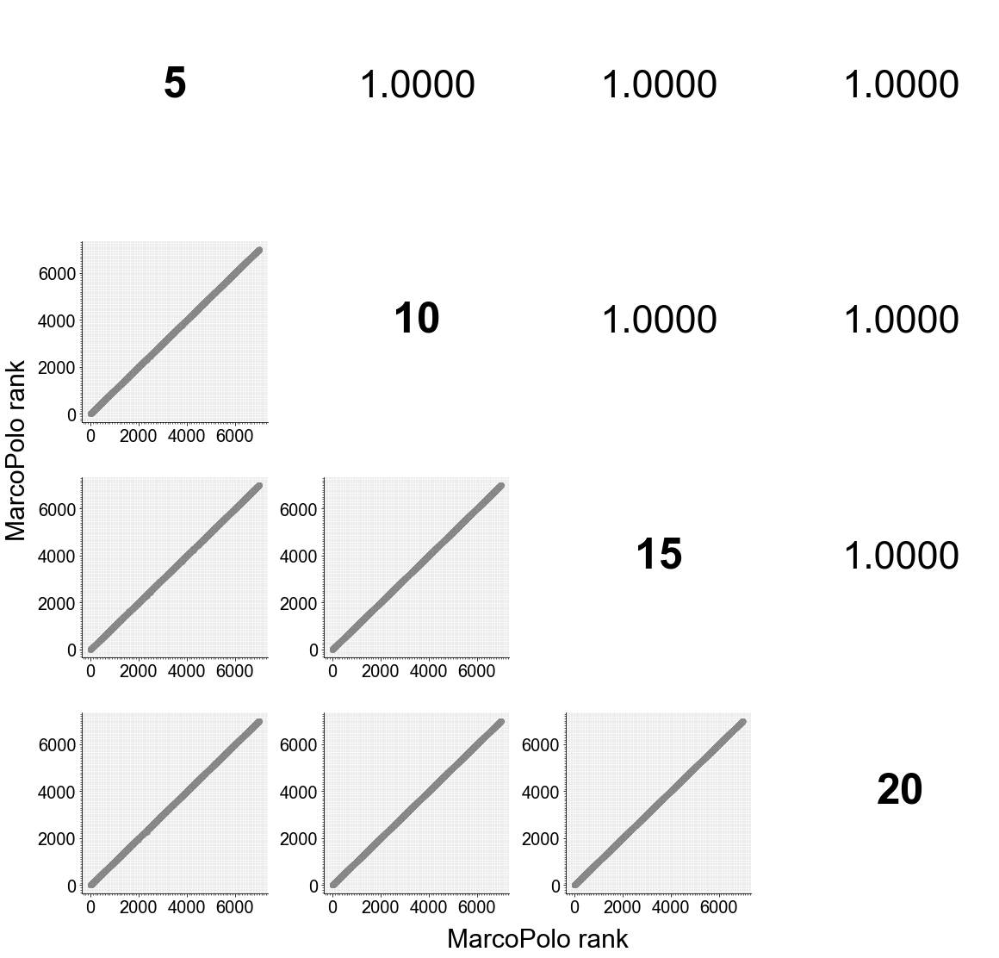

In [106]:
from scipy import stats
from matplotlib.ticker import (MultipleLocator, AutoMinorLocator)


dataset_name='TabulaMarrow_filtered'
path='datasets/extract/{}'.format(dataset_name)

#marker=load_marker(dataset_name,method='EVF')

norm_thres_range=[5,10,15,20]

hyper_norm_thres=[]
for norm_thres in norm_thres_range:
    result=pd.read_csv(path+'.hyperparamter.norm_thres.{}.MarcoPolo.2.rank.tsv'.format(str(norm_thres).replace('.','_')),sep='\t',index_col=0)
    hyper_norm_thres.append(result['MarcoPolo_rank'].tolist())
       
hyper_norm_thres_df=pd.DataFrame(hyper_norm_thres,index=norm_thres_range).T

param_range=norm_thres_range
param_df=hyper_norm_thres_df


plt.rcParams["font.size"] = 20

fig = plt.figure(figsize=(25, 25)) 
gs=fig.add_gridspec(25,25)

                         

for i in param_range:
    for j in param_range:
        if i<j:
            fig_sub1=fig.add_subplot(gs[5*param_range.index(i) : 5*(param_range.index(i))+4,
                                        5*param_range.index(j) : 5*(param_range.index(j))+4])   
            r_result=stats.spearmanr(param_df[i], param_df[j])
            fig_sub1.text(x=0.5, y=0.5, s='{:.4f}'.format(r_result[0]),size=45,
                         horizontalalignment='center',
                         )
            fig_sub1.axis('off')
            
        elif i==j:
            fig_sub1=fig.add_subplot(gs[5*param_range.index(i) : 5*(param_range.index(i))+4,
                                        5*param_range.index(j) : 5*(param_range.index(j))+4])   
            fig_sub1.text(x=0.5, y=0.5, s=str(i),
                          fontproperties=font_prop(bold=True,size=50),
                          horizontalalignment='center',
                         )
            fig_sub1.axis('off')
        else:
            fig_sub1=fig.add_subplot(gs[5*param_range.index(i) : 5*(param_range.index(i))+4,
                                        5*param_range.index(j) : 5*(param_range.index(j))+4])

            fig_sub1.scatter(x=param_df[i],
                             y=param_df[j],
                             s=30,
                             color='grey',
                             alpha=0.8
                            )
            """
            fig_sub1.scatter(x=param_df[[i in marker for i in exp_data_row]][i],
                             y=param_df[[i in marker for i in exp_data_row]][j],
                             s=30,
                             color='red',
                             alpha=0.8
                            )
            """
            #fig_sub1.set_yscale('log')
            fig_sub1.set_xlabel('')
            fig_sub1.set_ylabel('')
            
            fig_sub1.xaxis.set_major_locator(MultipleLocator(2000))
            fig_sub1.yaxis.set_major_locator(MultipleLocator(2000))
            
            fig_sub1.yaxis.set_minor_locator(MultipleLocator(100))
            fig_sub1.yaxis.grid(True, which='minor',linewidth=0.4,alpha=0.6)
            fig_sub1.yaxis.grid(True, which='major',linewidth=0.4,alpha=0.6)            
            
            fig_sub1.xaxis.set_minor_locator(MultipleLocator(100))
            fig_sub1.xaxis.grid(True, which='minor',linewidth=0.4,alpha=0.6)            
            fig_sub1.xaxis.grid(True, which='major',linewidth=0.4,alpha=0.6)   
            
            fig_sub1.spines['right'].set_visible(False)
            fig_sub1.spines['top'].set_visible(False)            

fig_sub=fig.add_subplot(gs[0:19,0:19])            
fig_sub.axis('off')
#fig_sub.set_xlabel('MarcoPolo rank')   
#fig_sub.set_ylabel('MarcoPolo rank')  
fig_sub.text(x=0.5, y=-0.06, s="MarcoPolo rank",
              fontproperties=font_prop(bold=False,size=30),
              horizontalalignment='center',
            )

fig_sub.text(x=-0.07, y=0.5, s="MarcoPolo rank",
              fontproperties=font_prop(bold=False,size=30),
              horizontalalignment='center',
             verticalalignment='center',
             rotation=90
            )



In [316]:
fig.savefig('pub/simul_sensitivity_norm.png', bbox_inches='tight')
fig.savefig('pub/simul_sensitivity_norm.jpg', bbox_inches='tight')
fig.savefig('pub/simul_sensitivity_norm.svg', bbox_inches='tight')

Text(-0.07, 0.5, 'MarcoPolo rank')

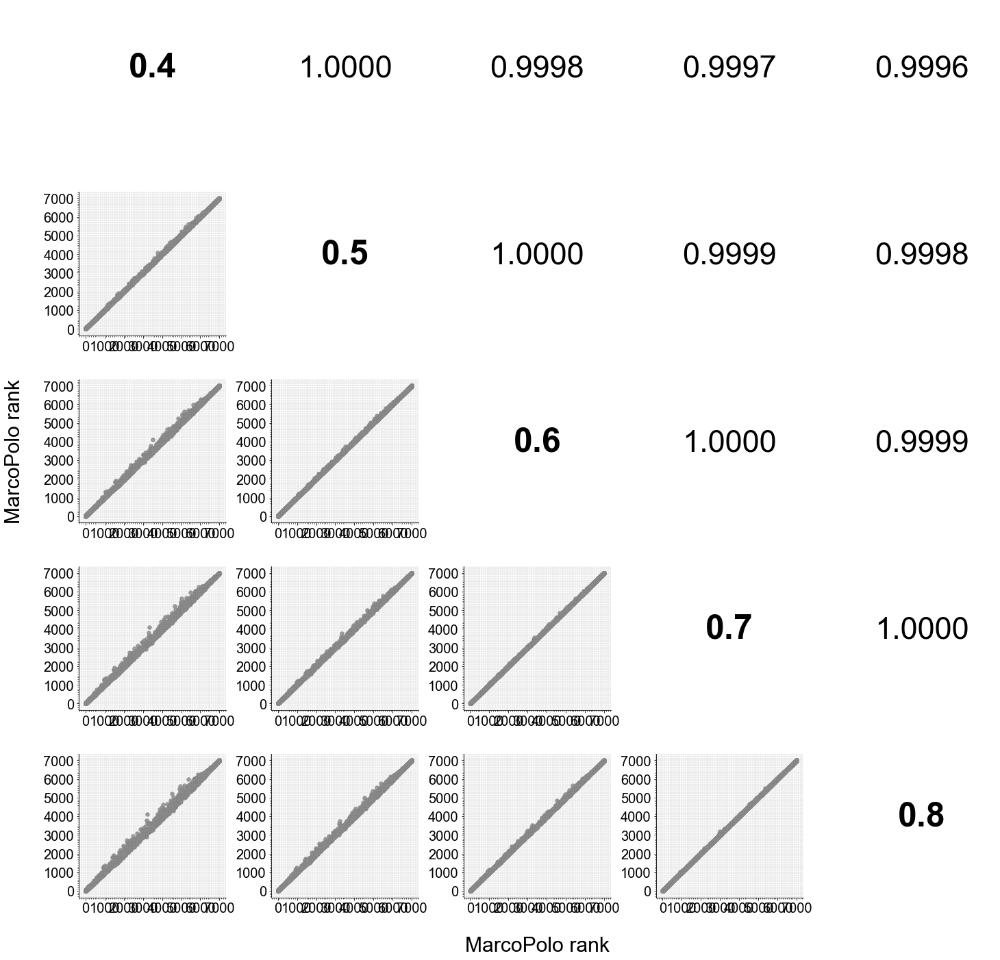

In [99]:
from scipy import stats
from matplotlib.ticker import (MultipleLocator, AutoMinorLocator)


dataset_name='TabulaMarrow_filtered'
path='datasets/extract/{}'.format(dataset_name)

#marker=load_marker(dataset_name,method='EVF')

lfc_thres_range=[0.4,0.5,0.6,0.7,0.8]

hyper_lfc_thres=[]
for lfc_thres in lfc_thres_range:
    result=pd.read_csv(path+'.hyperparamter.lfc_thres.{}.MarcoPolo.2.rank.tsv'.format(str(lfc_thres).replace('.','_')),sep='\t',index_col=0)
    hyper_lfc_thres.append(result['MarcoPolo_rank'].tolist())
hyper_lfc_thres_df=pd.DataFrame(hyper_lfc_thres,index=lfc_thres_range).T    

param_range=lfc_thres_range
param_df=hyper_lfc_thres_df


plt.rcParams["font.size"] = 20

fig = plt.figure(figsize=(25, 25)) 
gs=fig.add_gridspec(25,25)

                         

for i in param_range:
    for j in param_range:
        if i<j:
            fig_sub1=fig.add_subplot(gs[5*param_range.index(i) : 5*(param_range.index(i))+4,
                                        5*param_range.index(j) : 5*(param_range.index(j))+4])   
            r_result=stats.spearmanr(param_df[i], param_df[j])
            fig_sub1.text(x=0.5, y=0.5, s='{:.4f}'.format(r_result[0]),size=45,
                         horizontalalignment='center',
                         )
            fig_sub1.axis('off')
            
        elif i==j:
            fig_sub1=fig.add_subplot(gs[5*param_range.index(i) : 5*(param_range.index(i))+4,
                                        5*param_range.index(j) : 5*(param_range.index(j))+4])   
            fig_sub1.text(x=0.5, y=0.5, s=str(i),
                          fontproperties=font_prop(bold=True,size=50),
                          horizontalalignment='center',
                         )
            fig_sub1.axis('off')
        else:
            fig_sub1=fig.add_subplot(gs[5*param_range.index(i) : 5*(param_range.index(i))+4,
                                        5*param_range.index(j) : 5*(param_range.index(j))+4])
            
            fig_sub1.scatter(x=param_df[i],
                             y=param_df[j],
                             s=30,
                             color='grey',
                             alpha=0.8
                            )
            """
            fig_sub1.scatter(x=param_df[[i in marker for i in exp_data_row]][i],
                             y=param_df[[i in marker for i in exp_data_row]][j],
                             s=30,
                             color='red',
                             alpha=0.8
                            )
            """
            #fig_sub1.set_yscale('log')
            fig_sub1.set_xlabel('')
            fig_sub1.set_ylabel('')
            
            fig_sub1.xaxis.set_major_locator(MultipleLocator(2000))
            fig_sub1.yaxis.set_major_locator(MultipleLocator(2000))
            
            fig_sub1.yaxis.set_minor_locator(MultipleLocator(100))
            fig_sub1.yaxis.grid(True, which='minor',linewidth=0.4,alpha=0.6)
            fig_sub1.yaxis.grid(True, which='major',linewidth=0.4,alpha=0.6)            
            
            fig_sub1.xaxis.set_minor_locator(MultipleLocator(100))
            fig_sub1.xaxis.grid(True, which='minor',linewidth=0.4,alpha=0.6)            
            fig_sub1.xaxis.grid(True, which='major',linewidth=0.4,alpha=0.6)   
            
            fig_sub1.spines['right'].set_visible(False)
            fig_sub1.spines['top'].set_visible(False)            

fig_sub=fig.add_subplot(gs[0:24,0:24])            
fig_sub.axis('off')
#fig_sub.set_xlabel('MarcoPolo rank')   
#fig_sub.set_ylabel('MarcoPolo rank')  
fig_sub.text(x=0.5, y=-0.06, s="MarcoPolo rank",
              fontproperties=font_prop(bold=False,size=30),
              horizontalalignment='center',
            )

fig_sub.text(x=-0.07, y=0.5, s="MarcoPolo rank",
              fontproperties=font_prop(bold=False,size=30),
              horizontalalignment='center',
             verticalalignment='center',
             rotation=90
            )



In [318]:
fig.savefig('pub/simul_sensitivity_lfc.png', bbox_inches='tight')
fig.savefig('pub/simul_sensitivity_lfc.jpg', bbox_inches='tight')
fig.savefig('pub/simul_sensitivity_lfc.svg', bbox_inches='tight')

Text(-0.07, 0.5, 'MarcoPolo rank')

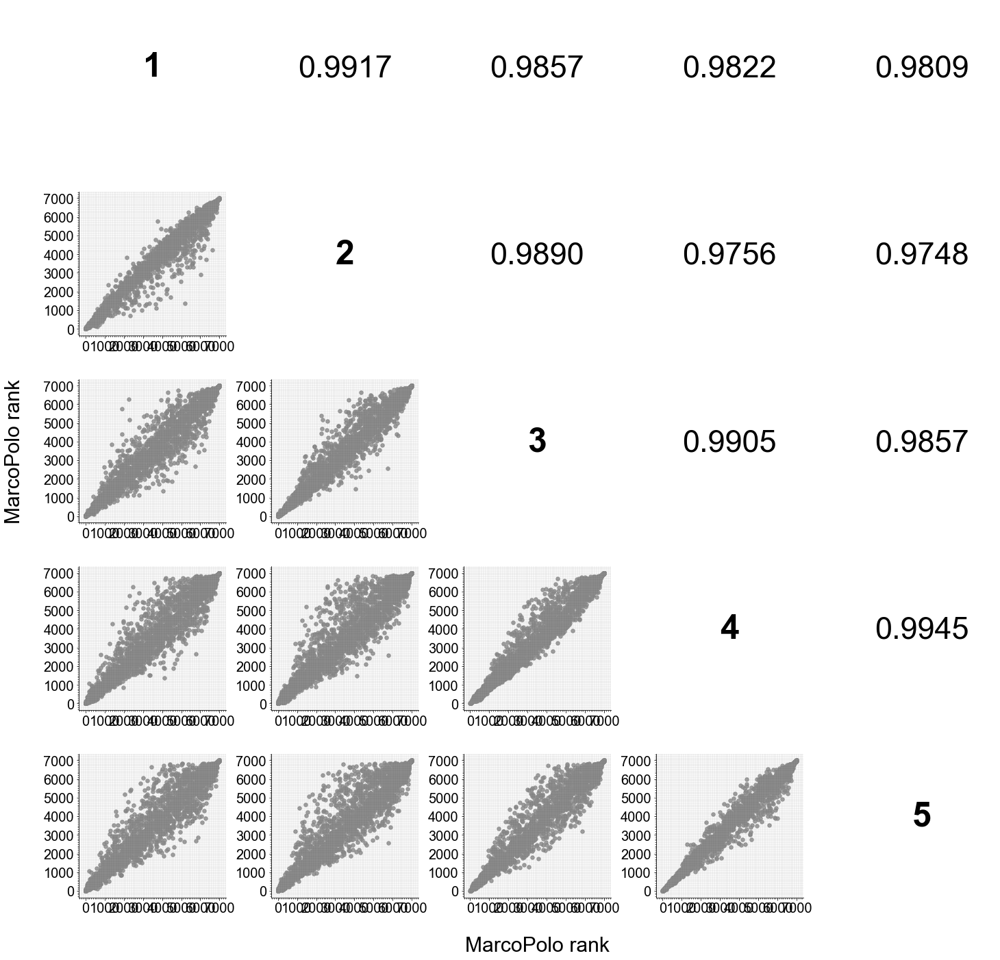

In [101]:
from scipy import stats
from matplotlib.ticker import (MultipleLocator, AutoMinorLocator)


dataset_name='TabulaMarrow_filtered'
path='datasets/extract/{}'.format(dataset_name)

#marker=load_marker(dataset_name,method='EVF')


n_pc_range=[1,2,3,4,5]

hyper_n_pc=[]
for n_pc in n_pc_range:
    result=pd.read_csv(path+'.hyperparamter.n_pc.{}.MarcoPolo.2.rank.tsv'.format(str(n_pc).replace('.','_')),sep='\t',index_col=0)
    hyper_n_pc.append(result['MarcoPolo_rank'].tolist())
hyper_n_pc_df=pd.DataFrame(hyper_n_pc,index=[1,2,3,4,5]).T  

param_range=n_pc_range
param_df=hyper_n_pc_df


plt.rcParams["font.size"] = 20

fig = plt.figure(figsize=(25, 25)) 
gs=fig.add_gridspec(25,25)

                         

for i in param_range:
    for j in param_range:
        if i<j:
            fig_sub1=fig.add_subplot(gs[5*param_range.index(i) : 5*(param_range.index(i))+4,
                                        5*param_range.index(j) : 5*(param_range.index(j))+4])   
            r_result=stats.spearmanr(param_df[i], param_df[j])
            fig_sub1.text(x=0.5, y=0.5, s='{:.4f}'.format(r_result[0]),size=45,
                         horizontalalignment='center',
                         )
            fig_sub1.axis('off')
            
        elif i==j:
            fig_sub1=fig.add_subplot(gs[5*param_range.index(i) : 5*(param_range.index(i))+4,
                                        5*param_range.index(j) : 5*(param_range.index(j))+4])   
            fig_sub1.text(x=0.5, y=0.5, s=str(i),
                          fontproperties=font_prop(bold=True,size=50),
                          horizontalalignment='center',
                         )
            fig_sub1.axis('off')
        else:
            fig_sub1=fig.add_subplot(gs[5*param_range.index(i) : 5*(param_range.index(i))+4,
                                        5*param_range.index(j) : 5*(param_range.index(j))+4])

            fig_sub1.scatter(x=param_df[i],
                             y=param_df[j],
                             s=30,
                             color='grey',
                             alpha=0.8
                            )
            """
            fig_sub1.scatter(x=param_df[[i in marker for i in exp_data_row]][i],
                             y=param_df[[i in marker for i in exp_data_row]][j],
                             s=30,
                             color='red',
                             alpha=0.8
                            )
            """
            #fig_sub1.set_yscale('log')
            fig_sub1.set_xlabel('')
            fig_sub1.set_ylabel('')
            
            fig_sub1.xaxis.set_major_locator(MultipleLocator(2000))
            fig_sub1.yaxis.set_major_locator(MultipleLocator(2000))
            
            fig_sub1.yaxis.set_minor_locator(MultipleLocator(100))
            fig_sub1.yaxis.grid(True, which='minor',linewidth=0.4,alpha=0.6)
            fig_sub1.yaxis.grid(True, which='major',linewidth=0.4,alpha=0.6)            
            
            fig_sub1.xaxis.set_minor_locator(MultipleLocator(100))
            fig_sub1.xaxis.grid(True, which='minor',linewidth=0.4,alpha=0.6)            
            fig_sub1.xaxis.grid(True, which='major',linewidth=0.4,alpha=0.6)   
            
            fig_sub1.spines['right'].set_visible(False)
            fig_sub1.spines['top'].set_visible(False)            

fig_sub=fig.add_subplot(gs[0:24,0:24])            
fig_sub.axis('off')
#fig_sub.set_xlabel('MarcoPolo rank')   
#fig_sub.set_ylabel('MarcoPolo rank')  
fig_sub.text(x=0.5, y=-0.06, s="MarcoPolo rank",
              fontproperties=font_prop(bold=False,size=30),
              horizontalalignment='center',
            )

fig_sub.text(x=-0.07, y=0.5, s="MarcoPolo rank",
              fontproperties=font_prop(bold=False,size=30),
              horizontalalignment='center',
             verticalalignment='center',
             rotation=90
            )



In [320]:
fig.savefig('pub/simul_sensitivity_n_pc.png', bbox_inches='tight')
fig.savefig('pub/simul_sensitivity_n_pc.jpg', bbox_inches='tight')
fig.savefig('pub/simul_sensitivity_n_pc.svg', bbox_inches='tight')

Text(-0.07, 0.5, 'MarcoPolo rank')

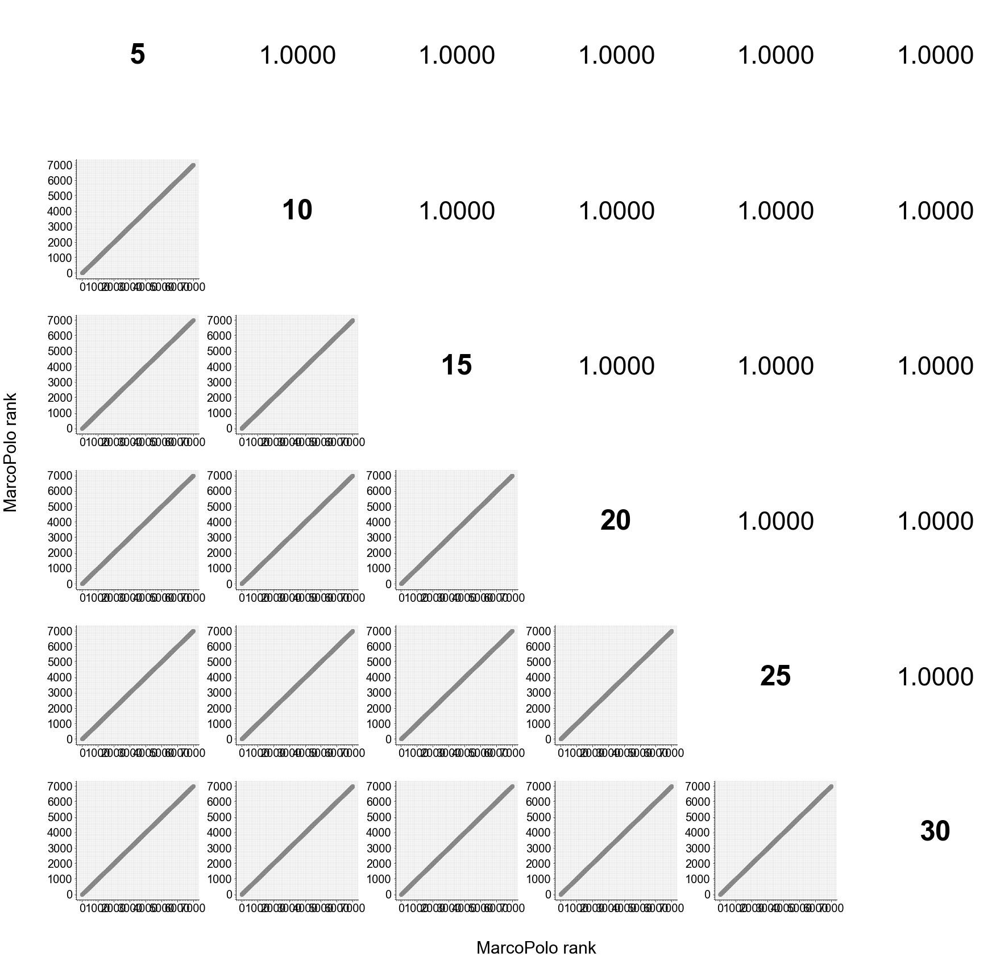

In [102]:
from scipy import stats
from matplotlib.ticker import (MultipleLocator, AutoMinorLocator)


dataset_name='TabulaMarrow_filtered'
path='datasets/extract/{}'.format(dataset_name)

#marker=load_marker(dataset_name,method='EVF')


minor_size_min_range=[5,10,15,20,25,30]


hyper_minor_size_min=[]
for minor_size_min in minor_size_min_range:
    result=pd.read_csv(path+'.hyperparamter.minor_size_min.{}.MarcoPolo.2.rank.tsv'.format(str(minor_size_min).replace('.','_')),sep='\t',index_col=0)
    hyper_minor_size_min.append(result['MarcoPolo_rank'].tolist())
hyper_minor_size_min_df=pd.DataFrame(hyper_minor_size_min,index=minor_size_min_range).T  


param_range=minor_size_min_range
param_df=hyper_minor_size_min_df


plt.rcParams["font.size"] = 20

fig = plt.figure(figsize=(30, 30)) 
gs=fig.add_gridspec(30,30)

                         

for i in param_range:
    for j in param_range:
        if i<j:
            fig_sub1=fig.add_subplot(gs[5*param_range.index(i) : 5*(param_range.index(i))+4,
                                        5*param_range.index(j) : 5*(param_range.index(j))+4])   
            r_result=stats.spearmanr(param_df[i], param_df[j])
            fig_sub1.text(x=0.5, y=0.5, s='{:.4f}'.format(r_result[0]),size=45,
                         horizontalalignment='center',
                         )
            fig_sub1.axis('off')
            
        elif i==j:
            fig_sub1=fig.add_subplot(gs[5*param_range.index(i) : 5*(param_range.index(i))+4,
                                        5*param_range.index(j) : 5*(param_range.index(j))+4])   
            fig_sub1.text(x=0.5, y=0.5, s=str(i),
                          fontproperties=font_prop(bold=True,size=50),
                          horizontalalignment='center',
                         )
            fig_sub1.axis('off')
        else:
            fig_sub1=fig.add_subplot(gs[5*param_range.index(i) : 5*(param_range.index(i))+4,
                                        5*param_range.index(j) : 5*(param_range.index(j))+4])

            fig_sub1.scatter(x=param_df[i],
                             y=param_df[j],
                             s=30,
                             color='grey',
                             alpha=0.8
                            )
            """
            fig_sub1.scatter(x=param_df[[i in marker for i in exp_data_row]][i],
                             y=param_df[[i in marker for i in exp_data_row]][j],
                             s=30,
                             color='red',
                             alpha=0.8
                            )
            """
            #fig_sub1.set_yscale('log')
            fig_sub1.set_xlabel('')
            fig_sub1.set_ylabel('')
            
            fig_sub1.xaxis.set_major_locator(MultipleLocator(2000))
            fig_sub1.yaxis.set_major_locator(MultipleLocator(2000))
            
            fig_sub1.yaxis.set_minor_locator(MultipleLocator(100))
            fig_sub1.yaxis.grid(True, which='minor',linewidth=0.4,alpha=0.6)
            fig_sub1.yaxis.grid(True, which='major',linewidth=0.4,alpha=0.6)            
            
            fig_sub1.xaxis.set_minor_locator(MultipleLocator(100))
            fig_sub1.xaxis.grid(True, which='minor',linewidth=0.4,alpha=0.6)            
            fig_sub1.xaxis.grid(True, which='major',linewidth=0.4,alpha=0.6)   
            
            fig_sub1.spines['right'].set_visible(False)
            fig_sub1.spines['top'].set_visible(False)            

fig_sub=fig.add_subplot(gs[0:29,0:29])            
fig_sub.axis('off')
#fig_sub.set_xlabel('MarcoPolo rank')   
#fig_sub.set_ylabel('MarcoPolo rank')  
fig_sub.text(x=0.5, y=-0.06, s="MarcoPolo rank",
              fontproperties=font_prop(bold=False,size=30),
              horizontalalignment='center',
            )

fig_sub.text(x=-0.07, y=0.5, s="MarcoPolo rank",
              fontproperties=font_prop(bold=False,size=30),
              horizontalalignment='center',
             verticalalignment='center',
             rotation=90
            )



In [323]:
fig.savefig('pub/simul_sensitivity_minor_size_min.png', bbox_inches='tight')
fig.savefig('pub/simul_sensitivity_minor_size_min.jpg', bbox_inches='tight')
fig.savefig('pub/simul_sensitivity_minor_size_min.svg', bbox_inches='tight')

Text(-0.07, 0.5, 'MarcoPolo rank')

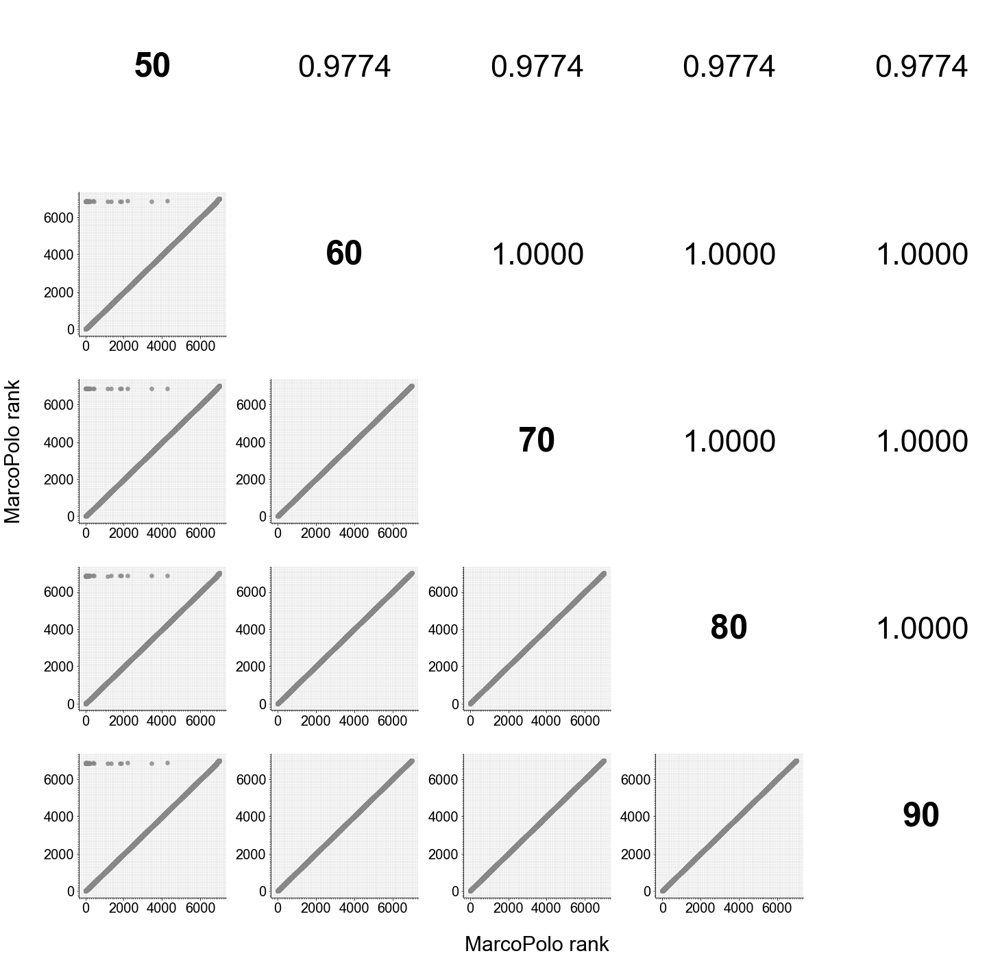

In [105]:
from scipy import stats
from matplotlib.ticker import (MultipleLocator, AutoMinorLocator)


dataset_name='TabulaMarrow_filtered'
path='datasets/extract/{}'.format(dataset_name)

#marker=load_marker(dataset_name,method='EVF')


minor_size_max_percent_range=[50,60,70,80,90]


hyper_minor_size_max_percent=[]
for minor_size_max_percent in minor_size_max_percent_range:
    result=pd.read_csv(path+'.hyperparamter.minor_size_max_percent.{}.MarcoPolo.2.rank.tsv'.format(str(minor_size_max_percent).replace('.','_')),sep='\t',index_col=0)
    hyper_minor_size_max_percent.append(result['MarcoPolo_rank'].tolist())    
hyper_minor_size_max_percent_df=pd.DataFrame(hyper_minor_size_max_percent,index=minor_size_max_percent_range).T   



param_range=minor_size_max_percent_range
param_df=hyper_minor_size_max_percent_df


plt.rcParams["font.size"] = 20

fig = plt.figure(figsize=(30, 30)) 
gs=fig.add_gridspec(30,30)

                         

for i in param_range:
    for j in param_range:
        if i<j:
            fig_sub1=fig.add_subplot(gs[5*param_range.index(i) : 5*(param_range.index(i))+4,
                                        5*param_range.index(j) : 5*(param_range.index(j))+4])   
            r_result=stats.spearmanr(param_df[i], param_df[j])
            fig_sub1.text(x=0.5, y=0.5, s='{:.4f}'.format(r_result[0]),size=45,
                         horizontalalignment='center',
                         )
            fig_sub1.axis('off')
            
        elif i==j:
            fig_sub1=fig.add_subplot(gs[5*param_range.index(i) : 5*(param_range.index(i))+4,
                                        5*param_range.index(j) : 5*(param_range.index(j))+4])   
            fig_sub1.text(x=0.5, y=0.5, s=str(i),
                          fontproperties=font_prop(bold=True,size=50),
                          horizontalalignment='center',
                         )
            fig_sub1.axis('off')
        else:
            fig_sub1=fig.add_subplot(gs[5*param_range.index(i) : 5*(param_range.index(i))+4,
                                        5*param_range.index(j) : 5*(param_range.index(j))+4])

            fig_sub1.scatter(x=param_df[i],
                             y=param_df[j],
                             s=30,
                             color='grey',
                             alpha=0.8
                            )
            """
            fig_sub1.scatter(x=param_df[[i in marker for i in exp_data_row]][i],
                             y=param_df[[i in marker for i in exp_data_row]][j],
                             s=30,
                             color='red',
                             alpha=0.8
                            )
            """
            #fig_sub1.set_yscale('log')
            fig_sub1.set_xlabel('')
            fig_sub1.set_ylabel('')
            
            fig_sub1.xaxis.set_major_locator(MultipleLocator(2000))
            fig_sub1.yaxis.set_major_locator(MultipleLocator(2000))
            
            fig_sub1.yaxis.set_minor_locator(MultipleLocator(100))
            fig_sub1.yaxis.grid(True, which='minor',linewidth=0.4,alpha=0.6)
            fig_sub1.yaxis.grid(True, which='major',linewidth=0.4,alpha=0.6)            
            
            fig_sub1.xaxis.set_minor_locator(MultipleLocator(100))
            fig_sub1.xaxis.grid(True, which='minor',linewidth=0.4,alpha=0.6)            
            fig_sub1.xaxis.grid(True, which='major',linewidth=0.4,alpha=0.6)   
            
            fig_sub1.spines['right'].set_visible(False)
            fig_sub1.spines['top'].set_visible(False)            

fig_sub=fig.add_subplot(gs[0:24,0:24])            
fig_sub.axis('off')
#fig_sub.set_xlabel('MarcoPolo rank')   
#fig_sub.set_ylabel('MarcoPolo rank')  
fig_sub.text(x=0.5, y=-0.06, s="MarcoPolo rank",
              fontproperties=font_prop(bold=False,size=30),
              horizontalalignment='center',
            )

fig_sub.text(x=-0.07, y=0.5, s="MarcoPolo rank",
              fontproperties=font_prop(bold=False,size=30),
              horizontalalignment='center',
             verticalalignment='center',
             rotation=90
            )



In [328]:
fig.savefig('pub/simul_sensitivity_minor_size_max_percent.png', bbox_inches='tight')
fig.savefig('pub/simul_sensitivity_minor_size_max_percent.jpg', bbox_inches='tight')
fig.savefig('pub/simul_sensitivity_minor_size_max_percent.svg', bbox_inches='tight')

In [ ]:
,voting_thres=0.7,norm_thres=10,n_pc=2,lfc_thres=0.6,minor_size_min=10,minor_size_max

In [309]:
marker=load_marker(dataset_name,method='EVF')       

In [ ]:
marker=load_marker(dataset_name,method='EVF')       

In [370]:
record_paramter_list=[]
for ncells_total in [10000]:
    for prop in ['1e-2']:
        for i in range(1,10+1):
            dataset_name='Simul_{}_{}_{}_filtered'.format(ncells_total,prop,i)
            print(dataset_name)
            
            path='datasets/extract/{}'.format(dataset_name)
            
            with open('datasets/extract/{}.data.row'.format(dataset_name),'r') as f: exp_data_row=[i.strip().strip('"') for i in f.read().split()]
            marker=load_marker(dataset_name,method='EVF')       
            DE_bool=list(map(lambda x: x in marker, exp_data_row))
            
            for voting_thres in [0.5,0.6,0.7,0.8,0.9]:
                result=pd.read_csv(path+'.hyperparamter.voting_thres.{}.MarcoPolo.2.rank.tsv'.format(str(voting_thres).replace('.','_')),sep='\t',index_col=0)            
                print(path+'.hyperparamter.voting_thres.{}.MarcoPolo.2.rank.tsv'.format(str(voting_thres).replace('.','_')))
                voting_thres=voting_thres;norm_thres=10;n_pc=2;lfc_thres=0.6;minor_size_min=10;minor_size_max_percent=70;
                
                score=-result['MarcoPolo_rank'].values
                auc=roc_auc_score(DE_bool,score)

                record_paramter_list.append({
                    'dataset_name':dataset_name, 
                    'num_marker':np.sum(DE_bool),
                    'voting_thres':voting_thres,
                    'norm_thres':norm_thres,
                    'n_pc':n_pc,
                    'lfc_thres':lfc_thres,
                    'minor_size_min':minor_size_min,
                    'minor_size_max':minor_size_max_percent,
                    'AUC':auc,
                    'changed':'voting_thres'                                                            
                })                   
                                
                
            for norm_thres in [5,10,15,20]:
                result=pd.read_csv(path+'.hyperparamter.norm_thres.{}.MarcoPolo.2.rank.tsv'.format(str(norm_thres).replace('.','_')),sep='\t',index_col=0)
                voting_thres=0.7;norm_thres=norm_thres;n_pc=2;lfc_thres=0.6;minor_size_min=10;minor_size_max_percent=70;

                score=-result['MarcoPolo_rank'].values
                auc=roc_auc_score(DE_bool,score)

                record_paramter_list.append({
                    'dataset_name':dataset_name,  
                    'num_marker':np.sum(DE_bool),
                    'voting_thres':voting_thres,
                    'norm_thres':norm_thres,
                    'n_pc':n_pc,
                    'lfc_thres':lfc_thres,
                    'minor_size_min':minor_size_min,
                    'minor_size_max':minor_size_max_percent,
                    'AUC':auc,
                    'changed':'norm_thres'                                                            
                })                   
                
                
            for n_pc in [1,2,3,4,5]:
                result=pd.read_csv(path+'.hyperparamter.n_pc.{}.MarcoPolo.2.rank.tsv'.format(str(n_pc).replace('.','_')),sep='\t',index_col=0)
                voting_thres=0.7;norm_thres=10;n_pc=n_pc;lfc_thres=0.6;minor_size_min=10;minor_size_max_percent=70;
                
                score=-result['MarcoPolo_rank'].values
                auc=roc_auc_score(DE_bool,score)

                record_paramter_list.append({
                    'dataset_name':dataset_name,  
                    'num_marker':np.sum(DE_bool),
                    'voting_thres':voting_thres,
                    'norm_thres':norm_thres,
                    'n_pc':n_pc,
                    'lfc_thres':lfc_thres,
                    'minor_size_min':minor_size_min,
                    'minor_size_max':minor_size_max_percent,
                    'AUC':auc,
                    'changed':'n_pc'                                                            
                })                   
                
                
            for lfc_thres in [0.4,0.5,0.6,0.7,0.8]:
                result=pd.read_csv(path+'.hyperparamter.lfc_thres.{}.MarcoPolo.2.rank.tsv'.format(str(lfc_thres).replace('.','_')),sep='\t',index_col=0)
                voting_thres=0.7;norm_thres=10;n_pc=2;lfc_thres=lfc_thres;minor_size_min=10;minor_size_max_percent=70;                

                score=-result['MarcoPolo_rank'].values
                auc=roc_auc_score(DE_bool,score)

                record_paramter_list.append({
                    'dataset_name':dataset_name,
                    'num_marker':np.sum(DE_bool),
                    'voting_thres':voting_thres,
                    'norm_thres':norm_thres,
                    'n_pc':n_pc,
                    'lfc_thres':lfc_thres,
                    'minor_size_min':minor_size_min,
                    'minor_size_max':minor_size_max_percent,
                    'AUC':auc,
                    'changed':'lfc_thres'                                        
                })                   
                
                
            for minor_size_min in [5,10,15,20,25,30]:
                result=pd.read_csv(path+'.hyperparamter.minor_size_min.{}.MarcoPolo.2.rank.tsv'.format(str(minor_size_min).replace('.','_')),sep='\t',index_col=0)
                voting_thres=0.7;norm_thres=10;n_pc=2;lfc_thres=0.6;minor_size_min=minor_size_min;minor_size_max_percent=70;

                score=-result['MarcoPolo_rank'].values
                auc=roc_auc_score(DE_bool,score)

                record_paramter_list.append({
                    'dataset_name':dataset_name, 
                    'num_marker':np.sum(DE_bool),
                    'voting_thres':voting_thres,
                    'norm_thres':norm_thres,
                    'n_pc':n_pc,
                    'lfc_thres':lfc_thres,
                    'minor_size_min':minor_size_min,
                    'minor_size_max':minor_size_max_percent,
                    'AUC':auc,
                    'changed':'minor_size_min'
                })                   
                                
                
            for minor_size_max_percent in [50,60,70,80,90]:
                result=pd.read_csv(path+'.hyperparamter.minor_size_max_percent.{}.MarcoPolo.2.rank.tsv'.format(str(minor_size_max_percent).replace('.','_')),sep='\t',index_col=0)
                voting_thres=0.7;norm_thres=10;n_pc=2;lfc_thres=0.6;minor_size_min=10;minor_size_max_percent=minor_size_max_percent;
                
                score=-result['MarcoPolo_rank'].values
                auc=roc_auc_score(DE_bool,score)

                record_paramter_list.append({
                    'dataset_name':dataset_name,
                    'num_marker':np.sum(DE_bool),
                    'voting_thres':voting_thres,
                    'norm_thres':norm_thres,
                    'n_pc':n_pc,
                    'lfc_thres':lfc_thres,
                    'minor_size_min':minor_size_min,
                    'minor_size_max':minor_size_max_percent,
                    'AUC':auc,
                    'changed':'minor_size_max_percent'                    
                })                   
                
                  
                

Simul_10000_1e-2_1_filtered
datasets/extract/Simul_10000_1e-2_1_filtered.hyperparamter.voting_thres.0_5.MarcoPolo.2.rank.tsv
datasets/extract/Simul_10000_1e-2_1_filtered.hyperparamter.voting_thres.0_6.MarcoPolo.2.rank.tsv
datasets/extract/Simul_10000_1e-2_1_filtered.hyperparamter.voting_thres.0_7.MarcoPolo.2.rank.tsv
datasets/extract/Simul_10000_1e-2_1_filtered.hyperparamter.voting_thres.0_8.MarcoPolo.2.rank.tsv
datasets/extract/Simul_10000_1e-2_1_filtered.hyperparamter.voting_thres.0_9.MarcoPolo.2.rank.tsv
Simul_10000_1e-2_2_filtered
datasets/extract/Simul_10000_1e-2_2_filtered.hyperparamter.voting_thres.0_5.MarcoPolo.2.rank.tsv
datasets/extract/Simul_10000_1e-2_2_filtered.hyperparamter.voting_thres.0_6.MarcoPolo.2.rank.tsv
datasets/extract/Simul_10000_1e-2_2_filtered.hyperparamter.voting_thres.0_7.MarcoPolo.2.rank.tsv
datasets/extract/Simul_10000_1e-2_2_filtered.hyperparamter.voting_thres.0_8.MarcoPolo.2.rank.tsv
datasets/extract/Simul_10000_1e-2_2_filtered.hyperparamter.voting_thres

In [293]:
record_list_df_simul

,Prob. of non-zero gene effect,ncells_total,num_marker,Method,AUC,ARI,runtime,Prob. of non-zero gene effect_num,Methods,Adjusted Rand Index,num. of cells,Num. of Cells,Area under the curve,Runtime (minutes),Mean Runtime (minutes)
0,1e-2,1000,204,MarcoPolo,0.890319,0.000000,243.881035,0.0100,MarcoPolo,0.000000,1000,1000,0.890319,4.064684,4.064684
1,1e-2,1000,204,HVG (VST),0.810446,0.000000,NaN,0.0100,HVG (VST),0.000000,1000,1000,0.810446,NaN,NaN
2,1e-2,1000,204,HVG (DISP),0.871271,0.000000,NaN,0.0100,HVG (DISP),0.000000,1000,1000,0.871271,NaN,NaN
3,1e-2,1000,204,scHaystack,0.849321,0.000000,21.741828,0.0100,scHaystack,0.000000,1000,1000,0.849321,0.362364,0.362364
4,1e-2,1000,204,"Clustering+DE (0.5, no filter)",0.845827,0.206282,66.183386,0.0100,"Clustering (0.5, no filter)",0.206282,1000,1000,0.845827,1.103056,1.103056
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1578,5e-4,10000,11,"Clustering+DE (1.0, no filter)",0.652726,0.043683,854.286654,0.0005,"Clustering (1.0, no filter)",0.043683,10000,10000,0.652726,14.238111,14.238111
1579,5e-4,10000,11,"Clustering+DE (1.5, no filter)",0.654558,0.047321,1223.471687,0.0005,"Clustering (1.5, no filter)",0.047321,10000,10000,0.654558,20.391195,20.391195
1580,5e-4,10000,11,"Clustering+DE (0.5, default)",0.907198,0.039734,70.620215,0.0005,Clustering (0.5),0.039734,10000,10000,0.907198,1.177004,1.177004
1581,5e-4,10000,11,"Clustering+DE (1.0, default)",0.907076,0.043683,82.380275,0.0005,Clustering (1.0),0.043683,10000,10000,0.907076,1.373005,1.373005


In [145]:
record_list_df_simul[(record_list_df_simul['ncells_total']==10000)&
                     (record_list_df_simul['Prob. of non-zero gene effect']=='1e-2')&
                     (record_list_df_simul['Method']=='MarcoPolo')
                    ]

,Prob. of non-zero gene effect,ncells_total,num_marker,num_marker_old,num_marker_intersection,Method,AUC,ARI,runtime,runtime2,Prob. of non-zero gene effect_num,Methods,Num. of Cells,Mean Runtime (minutes),Area under the curve
1200,1e-2,10000,200,100,100,MarcoPolo,0.909942,0.0,410.487826,19967.362797,0.01,MarcoPolo,10000,6.841464,0.909942
1210,1e-2,10000,186,59,59,MarcoPolo,0.783694,0.0,397.883910,19956.039826,0.01,MarcoPolo,10000,6.631398,0.783694
1220,1e-2,10000,195,78,77,MarcoPolo,0.846213,0.0,450.189202,19957.784470,0.01,MarcoPolo,10000,7.503153,0.846213
1230,1e-2,10000,199,100,100,MarcoPolo,0.864557,0.0,449.192994,19956.723253,0.01,MarcoPolo,10000,7.486550,0.864557
1240,1e-2,10000,183,100,100,MarcoPolo,0.855044,0.0,433.348471,19967.364633,0.01,MarcoPolo,10000,7.222475,0.855044
1250,1e-2,10000,193,90,89,MarcoPolo,0.875323,0.0,446.152545,19954.613481,0.01,MarcoPolo,10000,7.435876,0.875323
1260,1e-2,10000,184,100,98,MarcoPolo,0.918858,0.0,388.709988,19962.247656,0.01,MarcoPolo,10000,6.478500,0.918858
1270,1e-2,10000,227,100,97,MarcoPolo,0.885656,0.0,425.542439,19954.499094,0.01,MarcoPolo,10000,7.092374,0.885656
1280,1e-2,10000,216,100,100,MarcoPolo,0.897056,0.0,455.216721,19958.444635,0.01,MarcoPolo,10000,7.586945,0.897056
1290,1e-2,10000,178,100,100,MarcoPolo,0.895260,0.0,429.874757,19959.287209,0.01,MarcoPolo,10000,7.164579,0.895260


In [146]:
record_list_df_parameter=pd.DataFrame(record_paramter_list)

NameError: name 'record_paramter_list' is not defined

In [147]:
record_list_df_parameter[record_list_df_parameter['changed']=='voting_thres']

NameError: name 'record_list_df_parameter' is not defined

In [375]:
record_list_df_parameter[record_list_df_parameter['changed']=='lfc_thres']

,dataset_name,num_marker,voting_thres,norm_thres,n_pc,lfc_thres,minor_size_min,minor_size_max,AUC,changed
14,Simul_10000_1e-2_1_filtered,200,0.7,10,2,0.4,10,70,0.888677,lfc_thres
15,Simul_10000_1e-2_1_filtered,200,0.7,10,2,0.5,10,70,0.896558,lfc_thres
16,Simul_10000_1e-2_1_filtered,200,0.7,10,2,0.6,10,70,0.905858,lfc_thres
17,Simul_10000_1e-2_1_filtered,200,0.7,10,2,0.7,10,70,0.909923,lfc_thres
18,Simul_10000_1e-2_1_filtered,200,0.7,10,2,0.8,10,70,0.910888,lfc_thres
44,Simul_10000_1e-2_2_filtered,186,0.7,10,2,0.4,10,70,0.774202,lfc_thres
45,Simul_10000_1e-2_2_filtered,186,0.7,10,2,0.5,10,70,0.779353,lfc_thres
46,Simul_10000_1e-2_2_filtered,186,0.7,10,2,0.6,10,70,0.780409,lfc_thres
47,Simul_10000_1e-2_2_filtered,186,0.7,10,2,0.7,10,70,0.781362,lfc_thres
48,Simul_10000_1e-2_2_filtered,186,0.7,10,2,0.8,10,70,0.782221,lfc_thres


<AxesSubplot:xlabel='50', ylabel='90'>

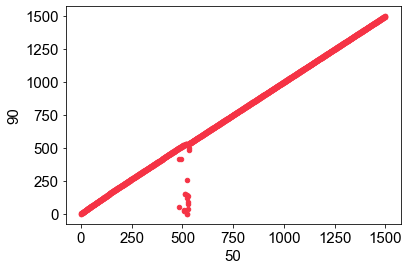

Text(-0.08, 1.0, 'd')

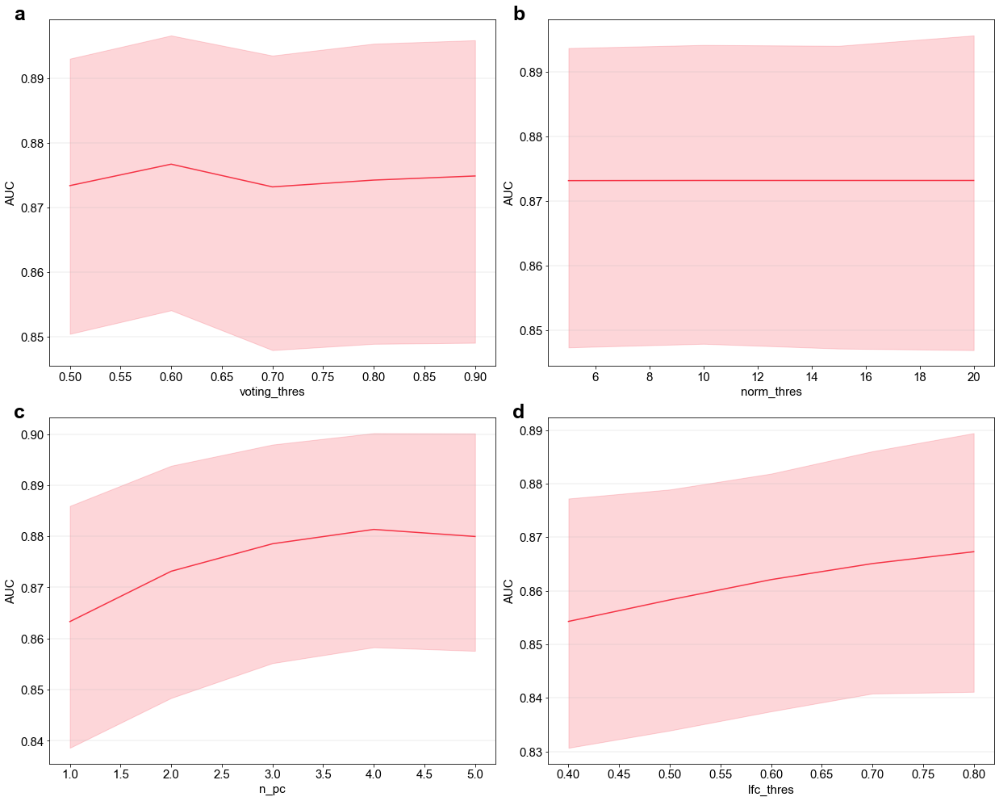

In [390]:
plt.rcParams["axes.prop_cycle"]=cycler('color',color_qual_7_3)
plt.rcParams["font.size"] = 15

fig = plt.figure(figsize=(25, 25)) 
gs=fig.add_gridspec(25,25)


fig_sub1=fig.add_subplot(gs[0:8,0:10])

sns.lineplot(x='voting_thres',y='AUC',
            data=record_list_df_parameter[record_list_df_parameter['changed']=='voting_thres'],
            ax=fig_sub1
           )


fig_sub1.yaxis.grid(True,linewidth=0.4,alpha=0.6)
#leg=fig_sub1.legend()
#fig_sub1.get_legend()._legend_box.align = "left"
#plt.legend()
fig_sub1.text(-0.08, 1.0, 'a', fontproperties=font_prop(bold=True,size=25), transform=fig_sub1.transAxes)




fig_sub1=fig.add_subplot(gs[0:8,11:11+10])

sns.lineplot(x='norm_thres',y='AUC',
            data=record_list_df_parameter[record_list_df_parameter['changed']=='norm_thres'],
            ax=fig_sub1
           )

fig_sub1.yaxis.grid(True,linewidth=0.4,alpha=0.6)
#leg=fig_sub1.legend()
#fig_sub1.get_legend()._legend_box.align = "left"
#plt.legend()
fig_sub1.text(-0.08, 1.0, 'b', fontproperties=font_prop(bold=True,size=25), transform=fig_sub1.transAxes)




fig_sub1=fig.add_subplot(gs[9:9+8,0:0+10])

sns.lineplot(x='n_pc',y='AUC',
            data=record_list_df_parameter[record_list_df_parameter['changed']=='n_pc'],
            ax=fig_sub1
           )

fig_sub1.yaxis.grid(True,linewidth=0.4,alpha=0.6)
#leg=fig_sub1.legend()
#fig_sub1.get_legend()._legend_box.align = "left"
#plt.legend()
fig_sub1.text(-0.08, 1.0, 'c', fontproperties=font_prop(bold=True,size=25), transform=fig_sub1.transAxes)





fig_sub1=fig.add_subplot(gs[9:9+8,11:11+10])

sns.lineplot(x='lfc_thres',y='AUC',
            data=record_list_df_parameter[record_list_df_parameter['changed']=='lfc_thres'],
            ax=fig_sub1
           )

fig_sub1.yaxis.grid(True,linewidth=0.4,alpha=0.6)
#leg=fig_sub1.legend()
#fig_sub1.get_legend()._legend_box.align = "left"
#plt.legend()
fig_sub1.text(-0.08, 1.0, 'd', fontproperties=font_prop(bold=True,size=25), transform=fig_sub1.transAxes)



In [287]:
record_list_df_simul[(record_list_df_simul['ncells_total']==10000)&
                     (record_list_df_simul['Prob. of non-zero gene effect']=='1e-2')&
                     (record_list_df_simul['Method']=='MarcoPolo')
                    ]

,Prob. of non-zero gene effect,ncells_total,num_marker,Method,AUC,ARI,runtime,Prob. of non-zero gene effect_num,Methods,Adjusted Rand Index,num. of cells,Num. of Cells,Area under the curve,Runtime (minutes),Mean Runtime (minutes)
1200,1e-2,10000,200,MarcoPolo,0.909942,0.0,410.487826,0.01,MarcoPolo,0.0,10000,10000,0.909942,6.841464,6.841464
1210,1e-2,10000,186,MarcoPolo,0.783694,0.0,397.883910,0.01,MarcoPolo,0.0,10000,10000,0.783694,6.631398,6.631398
1214,1e-2,10000,195,MarcoPolo,0.846213,0.0,450.189202,0.01,MarcoPolo,0.0,10000,10000,0.846213,7.503153,7.503153
1224,1e-2,10000,199,MarcoPolo,0.864557,0.0,449.192994,0.01,MarcoPolo,0.0,10000,10000,0.864557,7.486550,7.486550
1234,1e-2,10000,183,MarcoPolo,0.855044,0.0,433.348471,0.01,MarcoPolo,0.0,10000,10000,0.855044,7.222475,7.222475
1244,1e-2,10000,193,MarcoPolo,0.875323,0.0,446.152545,0.01,MarcoPolo,0.0,10000,10000,0.875323,7.435876,7.435876
1254,1e-2,10000,184,MarcoPolo,0.918858,0.0,388.709988,0.01,MarcoPolo,0.0,10000,10000,0.918858,6.478500,6.478500
1264,1e-2,10000,227,MarcoPolo,0.885656,0.0,425.542439,0.01,MarcoPolo,0.0,10000,10000,0.885656,7.092374,7.092374
1274,1e-2,10000,216,MarcoPolo,0.897056,0.0,455.216721,0.01,MarcoPolo,0.0,10000,10000,0.897056,7.586945,7.586945
1284,1e-2,10000,178,MarcoPolo,0.895260,0.0,429.874757,0.01,MarcoPolo,0.0,10000,10000,0.895260,7.164579,7.164579


In [288]:
record_list_df_parameter

,voting_thres,norm_thres,n_pc,lfc_thres,minor_size_min,minor_size_max,AUC,changed
0,0.5,10,2,0.6,10,70,0.906262,voting_thres
1,0.6,10,2,0.6,10,70,0.912954,voting_thres
2,0.7,10,2,0.6,10,70,0.909942,voting_thres
3,0.8,10,2,0.6,10,70,0.911677,voting_thres
4,0.9,10,2,0.6,10,70,0.912558,voting_thres
...,...,...,...,...,...,...,...,...
295,0.7,10,2,0.6,10,50,0.633557,minor_size_max_percent
296,0.7,10,2,0.6,10,60,0.633523,minor_size_max_percent
297,0.7,10,2,0.6,10,70,0.636230,minor_size_max_percent
298,0.7,10,2,0.6,10,80,0.640513,minor_size_max_percent


AttributeError: 'NoneType' object has no attribute '_legend_box'

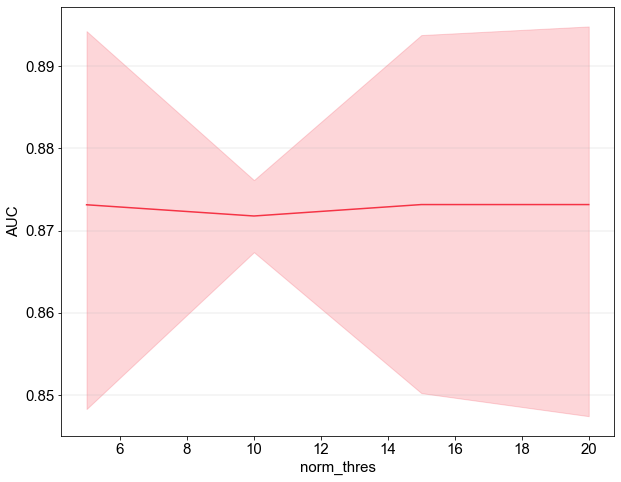

In [377]:
plt.rcParams["axes.prop_cycle"]=cycler('color',color_qual_7_3)
plt.rcParams["font.size"] = 15

fig = plt.figure(figsize=(25, 25)) 
gs=fig.add_gridspec(25,25)


fig_sub1=fig.add_subplot(gs[0:8,0:10])

sns.lineplot(x='norm_thres',y='AUC',
            data=record_list_df_parameter,
            ax=fig_sub1
           )
fig_sub1.yaxis.grid(True,linewidth=0.4,alpha=0.6)
#leg=fig_sub1.legend()
fig_sub1.get_legend()._legend_box.align = "left"
#plt.legend()
fig_sub1.text(-0.08, 1.0, 'a', fontproperties=font_prop(bold=True,size=25), transform=fig_sub1.transAxes)


In [ ]:
plt.rcParams["axes.prop_cycle"]=cycler('color',color_qual_7_3)
plt.rcParams["font.size"] = 15

fig = plt.figure(figsize=(25, 25)) 
gs=fig.add_gridspec(25,25)


fig_sub1=fig.add_subplot(gs[0:8,0:10])

sns.boxplot(x='Prob. of non-zero gene effect',y='runtime',
            order=['1e-2','5e-3','1e-3','5e-4'],
            hue='Method',
            hue_order=['MarcoPolo','HVG (VST)','HVG (DISP)','scHaystack',
                       'Clustering+DE (0.5, default)','Clustering+DE (1.0, default)','Clustering+DE (1.5, default)',
                       'Clustering+DE (0.5, no filter)','Clustering+DE (1.0, no filter)','Clustering+DE (1.5, no filter)'],            
            palette=color_qual_7_3,
            data=record_list_df_simul,
            width=0.7,
            saturation=0.9,
            ax=fig_sub1
           )
fig_sub1.yaxis.grid(True,linewidth=0.4,alpha=0.6)
#leg=fig_sub1.legend()
fig_sub1.get_legend()._legend_box.align = "left"
#plt.legend()
fig_sub1.text(-0.08, 1.0, 'a', fontproperties=font_prop(bold=True,size=25), transform=fig_sub1.transAxes)

fig_sub1=fig.add_subplot(gs[9:9+8,0:10])

sns.boxplot(x='Num. of Cells',y='AUC',
            hue='Method',
            order=[1000,2000,5000,10000],
            hue_order=['MarcoPolo','HVG (VST)','HVG (DISP)','scHaystack',
                       'Clustering+DE (0.5, default)','Clustering+DE (1.0, default)','Clustering+DE (1.5, default)',
                       'Clustering+DE (0.5, no filter)','Clustering+DE (1.0, no filter)','Clustering+DE (1.5, no filter)'],                        
            palette=color_qual_7_3,
            data=record_list_df_simul,
            width=0.7,
            saturation=0.9,
            ax=fig_sub1
           )
fig_sub1.yaxis.grid(True,linewidth=0.4,alpha=0.6)
#leg=fig_sub1.legend()
fig_sub1.get_legend()._legend_box.align = "left"
#plt.legend()
fig_sub1.legend(loc="lower left")
fig_sub1.text(-0.08, 1.0, 'b', fontproperties=font_prop(bold=True,size=25), transform=fig_sub1.transAxes)



In [ ]:
pd.DataFrrecord_list=[]#pd.DataFrame(columns=[1],index=['1e-2','5e-3','1e-3','5e-4','1e-4'])
for ncells_total in [1000,2000,5000,10000]:
    for prop in ['1e-2','5e-3','1e-3','5e-4'][::]:
        for i in range(1,10+1):

            dataset_name='Simul_{}_{}_{}_filtered'.format(ncells_total,prop,i)
            plt.figure()
            print(dataset_name)

            with open('datasets/extract/{}.data.row'.format(dataset_name),'r') as f: exp_data_row=[i.strip().strip('"') for i in f.read().split()]


            #marker=load_marker(dataset_name,method='truelabel_maxdiff',num_genes=500,lfc=2)          
            marker=load_marker(dataset_name,method='EVF')       

            DE_bool=list(map(lambda x: x in marker, exp_data_row))

            for method in ['MarcoPolo','vst','disp','ht.pca','seurat,0_5,without_filter','seurat,1_0,without_filter','seurat,1_5,without_filter','seurat,0_5,with_filter','seurat,1_0,with_filter','seurat,1_5,with_filter']:
                print(method)
                
                score=load_score(dataset_name,method)

                auc=roc_auc_score(DE_bool,score)
                runtime=load_runtime(dataset_name,method)

                fpr, tpr, thresholds = metrics.roc_curve(DE_bool,score);
                plt.plot(fpr,tpr,label='{}({:.3f})'.format(method,auc))

                if 'seurat' in method:
                    res=method.split(',')[1]
                    clustering_label=pd.read_csv('datasets/extract/{}.clustering.{}.label.tsv'.format(dataset_name,res),sep='\t')
                    exp_data_meta=pd.read_csv('datasets/extract/{}.metadatacol.tsv'.format(dataset_name),sep='\t')
                    ari=adjusted_rand_score(exp_data_meta['phenoid'],clustering_label['seurat_clusters'])
                else:
                    ari=0

                record_list.append({
                    'Prob. of non-zero gene effect':'{:s}'.format(str(prop)),
                    'ncells_total':ncells_total,
                    'num_marker':np.sum(DE_bool),
                    'Method':method_mapper(method),
                    'AUC':auc,
                    'ARI':ari,
                    'runtime':runtime,
                })        


            #plt.title("{}\n# marker from DB={}".format(dataset_name,len(marker_unique_converted_filtered)))
            plt.title("{}\n # marker: {}".format(dataset_name,sum(DE_bool)))
            plt.legend()     

            plt.plot()ame(hyper_voting_thres,index=[0.5,0.6,0.7,0.8,0.9]).T

In [366]:
marker=load_marker('Simul_5000_1e-2_3_filtered',method='EVF')       

In [367]:
marker_lf=load_marker('Simul_5000_1e-2_3_filtered',method='truelabel_maxdiff',num_genes=500,lfc=2)

In [368]:
len(marker),len(marker_lf)

(224, 148)

In [369]:
len(set(marker_lf).intersection(marker))

148

In [314]:
marker_lf

array(['805', '3213', '2698', '4162', '298', '2624', '3750', '2985',
       '1064', '3254', '632', '3337', '4616', '3672', '3317', '3341',
       '4045', '1625', '3660', '4613', '906', '4703', '1477', '4871',
       '4237', '3376', '4001', '3677', '599', '2223', '328', '4625',
       '150', '4516', '1689', '4464', '814', '2266', '1386', '4993',
       '2923', '851', '1561', '766', '4461', '2943', '2296', '1210',
       '4808', '371', '2990', '3324', '3432', '450', '1213', '2738',
       '4878', '781', '4923', '1798', '2641', '1628', '1389', '469',
       '1719', '954', '3930', '646', '3442', '4082', '4852', '2257',
       '2352', '927', '198', '1559', '2483', '454', '4740', '1077',
       '1024', '3218', '3167', '2040', '2152', '4467', '1733', '1217',
       '330', '4080', '1913', '2607', '4309', '2883', '2301', '3067',
       '2219', '4932', '2066', '1340', '2479', '656', '1880', '612',
       '2164', '1885', '3835', '833', '4146', '1426', '4137', '3773',
       '1767', '588', '4403',

In [256]:
DE_bool=list(map(lambda x: x in marker, exp_data_row))

In [264]:
hyper_voting_thres_df.apply(lambda x: roc_auc_score(DE_bool,x),axis=0)

0.5    0.516250
0.6    0.520038
0.7    0.519238
0.8    0.518903
0.9    0.519663
dtype: float64

In [265]:
hyper_norm_thres_df.apply(lambda x: roc_auc_score(DE_bool,x),axis=0)

5     0.519238
10    0.519238
15    0.519238
20    0.519238
dtype: float64

In [263]:
hyper_norm_thres_df.apply(lambda x: print(x),axis=0)

0          1
1          4
2          6
3       1377
4        522
        ... 
1495      87
1496     272
1497     400
1498     383
1499     278
Name: 0.5, Length: 1500, dtype: int64
0          1
1          4
2          6
3       1377
4        522
        ... 
1495      86
1496     281
1497     399
1498     378
1499     287
Name: 0.6, Length: 1500, dtype: int64
0          1
1          4
2          6
3       1377
4        522
        ... 
1495      86
1496     271
1497     405
1498     380
1499     278
Name: 0.7, Length: 1500, dtype: int64
0          1
1          4
2          6
3       1377
4        522
        ... 
1495      86
1496     280
1497     404
1498     379
1499     286
Name: 0.8, Length: 1500, dtype: int64
0          1
1          4
2          6
3       1377
4        522
        ... 
1495      86
1496     281
1497     408
1498     384
1499     287
Name: 0.9, Length: 1500, dtype: int64


0.5    None
0.6    None
0.7    None
0.8    None
0.9    None
dtype: object

In [ ]:
score=load_score(dataset_name,method)

auc=roc_auc_score(DE_bool,score)

In [257]:
DE_bool

[False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 True,
 False,
 False,
 False,
 False,
 True,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 True,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 True,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 True,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 Fals

In [231]:
pd.DataFrrecord_list=[]#pd.DataFrame(columns=[1],index=['1e-2','5e-3','1e-3','5e-4','1e-4'])
for ncells_total in [1000,2000,5000,10000]:
    for prop in ['1e-2','5e-3','1e-3','5e-4'][::]:
        for i in range(1,10+1):

            dataset_name='Simul_{}_{}_{}_filtered'.format(ncells_total,prop,i)
            plt.figure()
            print(dataset_name)

            with open('datasets/extract/{}.data.row'.format(dataset_name),'r') as f: exp_data_row=[i.strip().strip('"') for i in f.read().split()]


            #marker=load_marker(dataset_name,method='truelabel_maxdiff',num_genes=500,lfc=2)          
            marker=load_marker(dataset_name,method='EVF')       

            DE_bool=list(map(lambda x: x in marker, exp_data_row))

            for method in ['MarcoPolo','vst','disp','ht.pca','seurat,0_5,without_filter','seurat,1_0,without_filter','seurat,1_5,without_filter','seurat,0_5,with_filter','seurat,1_0,with_filter','seurat,1_5,with_filter']:
                print(method)
                
                score=load_score(dataset_name,method)

                auc=roc_auc_score(DE_bool,score)
                runtime=load_runtime(dataset_name,method)

                fpr, tpr, thresholds = metrics.roc_curve(DE_bool,score);
                plt.plot(fpr,tpr,label='{}({:.3f})'.format(method,auc))

                if 'seurat' in method:
                    res=method.split(',')[1]
                    clustering_label=pd.read_csv('datasets/extract/{}.clustering.{}.label.tsv'.format(dataset_name,res),sep='\t')
                    exp_data_meta=pd.read_csv('datasets/extract/{}.metadatacol.tsv'.format(dataset_name),sep='\t')
                    ari=adjusted_rand_score(exp_data_meta['phenoid'],clustering_label['seurat_clusters'])
                else:
                    ari=0

                record_list.append({
                    'Prob. of non-zero gene effect':'{:s}'.format(str(prop)),
                    'ncells_total':ncells_total,
                    'num_marker':np.sum(DE_bool),
                    'Method':method_mapper(method),
                    'AUC':auc,
                    'ARI':ari,
                    'runtime':runtime,
                })        


            #plt.title("{}\n# marker from DB={}".format(dataset_name,len(marker_unique_converted_filtered)))
            plt.title("{}\n # marker: {}".format(dataset_name,sum(DE_bool)))
            plt.legend()     

            plt.plot()ame(hyper_voting_thres,index=[0.5,0.6,0.7,0.8,0.9]).T

,0.5,0.6,0.7,0.8,0.9
0,1,1,1,1,1
1,4,4,4,4,4
2,6,6,6,6,6
3,1377,1377,1377,1377,1377
4,522,522,522,522,522
...,...,...,...,...,...
1495,87,86,86,86,86
1496,272,281,271,280,281
1497,400,399,405,404,408
1498,383,378,380,379,384


In [ ]:
import MarcoPolo.QQscore as QQ

gamma_argmax_dict={}
delta_log_dict={}
beta_dict={}

exp_data_dict={}
exp_data_row_dict={}
exp_data_col_dict={}
exp_data_meta_dict={}
exp_data_s_dict={}

clustering_label_0_5_dict={}
clustering_label_1_0_dict={}
clustering_label_1_5_dict={}
clustering_label_2_0_dict={}

for idx,dataset_name in enumerate(dataset_name_all):
    print(dataset_name)
    path='datasets/extract/{}'.format(dataset_name)
    path  
    
    exp_data=mmread('{}.data.counts.mm'.format(path)).toarray().astype(float)
    with open('{}.data.col'.format(path),'r') as f: exp_data_col=[i.strip().strip('"') for i in f.read().split()]
    with open('{}.data.row'.format(path),'r') as f: exp_data_row=[i.strip().strip('"') for i in f.read().split()]
    assert exp_data.shape==(len(exp_data_row),len(exp_data_col))
    assert len(set(exp_data_row))==len(exp_data_row)
    assert len(set(exp_data_col))==len(exp_data_col)            
    
    exp_data_meta=pd.read_csv('{}.metadatacol.tsv'.format(path),sep='\t')
    
    exp_data_s=pd.read_csv('{}.size_factor.tsv'.format(path),sep='\t',header=None)[0].values.astype(float)
    
    clustering_label_0_5=pd.read_csv('{}.clustering.0_5.label.tsv'.format(path),sep='\t')
    clustering_label_1_0=pd.read_csv('{}.clustering.1_0.label.tsv'.format(path),sep='\t')
    clustering_label_1_5=pd.read_csv('{}.clustering.1_5.label.tsv'.format(path),sep='\t')
    clustering_label_2_0=pd.read_csv('{}.clustering.2_0.label.tsv'.format(path),sep='\t')
    
    result_list,gamma_list_list,delta_log_list_list,beta_list_list=QQ.read_QQscore(path,[1,mode])

    gamma_list=gamma_list_list[-1]    

    gamma_argmax_list=QQ.gamma_list_exp_data_to_gamma_argmax_list(gamma_list,exp_data)#gamma_argmax_list=QQ.gamma_list_to_gamma_argmax_list(gamma_list)
    gamma_argmax_list,gamma_argmax_list.shape  
    gamma_argmax_dict[dataset_name]=gamma_argmax_list
    delta_log_dict[dataset_name]=delta_log_list_list
    beta_dict[dataset_name]=beta_list_list
    
    
    exp_data_dict[dataset_name]=exp_data
    exp_data_row_dict[dataset_name]=exp_data_row
    exp_data_col_dict[dataset_name]=exp_data_col
    exp_data_meta_dict[dataset_name]=exp_data_meta
    exp_data_s_dict[dataset_name]=exp_data_s
    
    clustering_label_0_5_dict[dataset_name]=clustering_label_0_5
    clustering_label_1_0_dict[dataset_name]=clustering_label_1_0
    clustering_label_1_5_dict[dataset_name]=clustering_label_1_5
    clustering_label_2_0_dict[dataset_name]=clustering_label_2_0
    

In [268]:
record_list_df_simul

,Prob. of non-zero gene effect,ncells_total,num_marker,Method,AUC,ARI,runtime,Prob. of non-zero gene effect_num,Methods,Adjusted Rand Index,num. of cells,Num. of Cells,Area under the curve,Runtime (minutes),Mean Runtime (minutes)
0,1e-2,1000,204,MarcoPolo,0.890319,0.000000,243.881035,0.0100,MarcoPolo,0.000000,1000,1000,0.890319,4.064684,4.064684
1,1e-2,1000,204,HVG (VST),0.810446,0.000000,NaN,0.0100,HVG (VST),0.000000,1000,1000,0.810446,NaN,NaN
2,1e-2,1000,204,HVG (DISP),0.871271,0.000000,NaN,0.0100,HVG (DISP),0.000000,1000,1000,0.871271,NaN,NaN
3,1e-2,1000,204,scHaystack,0.849321,0.000000,21.741828,0.0100,scHaystack,0.000000,1000,1000,0.849321,0.362364,0.362364
4,1e-2,1000,204,"Clustering+DE (0.5, no filter)",0.845827,0.206282,66.183386,0.0100,"Clustering (0.5, no filter)",0.206282,1000,1000,0.845827,1.103056,1.103056
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1578,5e-4,10000,11,"Clustering+DE (1.0, no filter)",0.652726,0.043683,854.286654,0.0005,"Clustering (1.0, no filter)",0.043683,10000,10000,0.652726,14.238111,14.238111
1579,5e-4,10000,11,"Clustering+DE (1.5, no filter)",0.654558,0.047321,1223.471687,0.0005,"Clustering (1.5, no filter)",0.047321,10000,10000,0.654558,20.391195,20.391195
1580,5e-4,10000,11,"Clustering+DE (0.5, default)",0.907198,0.039734,70.620215,0.0005,Clustering (0.5),0.039734,10000,10000,0.907198,1.177004,1.177004
1581,5e-4,10000,11,"Clustering+DE (1.0, default)",0.907076,0.043683,82.380275,0.0005,Clustering (1.0),0.043683,10000,10000,0.907076,1.373005,1.373005
